# A Dissertation on  - Predicting the Impact of COVID-19 on Business

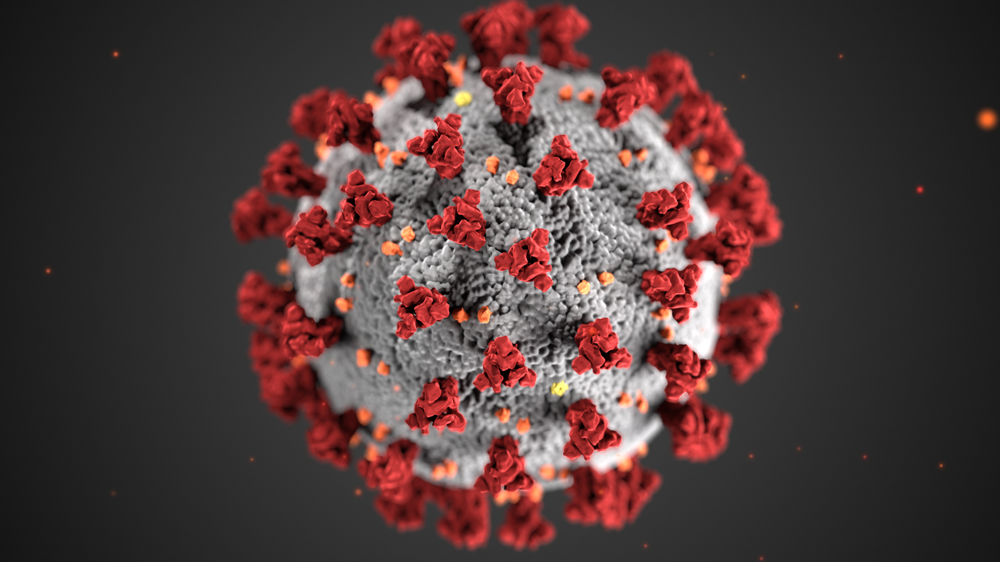

Steps undertaken - 

Load Dataset

Descriptive Analysis

-Data Exploration and Preprocessing

-Correlation Analysis

Predictive Analysis - Data Modelling

-Model Evaluation

-Model Optimization

# Load dataset

In [217]:
#Required Libraries to load dataset
import pandas as pd
from pandas import DataFrame,Series

#Required Libraries for skewness
from scipy.stats import skew

#Required Libraries and Packages for fitting Model
from sklearn import tree
from sklearn import linear_model
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor

#Required Libraries for Model Evaluation
import sklearn.metrics as metrics
from sklearn.metrics import mean_absolute_error
from statsmodels.tools.eval_measures import mse, rmse

#Required Libraries for Data Preprocessing
from sklearn.preprocessing import StandardScaler

#Required Libraries for Data Visualization
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pylab as pl

#Required Libraries and Packages for Geospatial Visualization
import folium
import branca.colormap as cm
import branca.colormap as cmp
import geopandas as gpd
import folium
from geopandas import GeoDataFrame
#!pip install geoplot
import geoplot as gplt
import geoplot.crs as gcrs
import imageio
import mapclassify as mc

#Required Library to write SQL Queries
from pandasql import sqldf

#Other Required Libraries
import os
import numpy as np

In [218]:
#Accessing Datasets

#IMD Data
df1 = pd.read_excel('file2.csv')

#COVID-19 Cases Data - regional-wise
df2 = pd.read_csv('https://api.coronavirus.data.gov.uk/v2/data?areaType=ltla&metric=newCasesBySpecimenDate&format=csv')

#map = pd.read_csv('Local_Authority_Districts_(December_2019)_Boundaries_UK_BFC.csv')

#COVID-19 Deaths Data Data - regional-wise
death = pd.read_csv('https://api.coronavirus.data.gov.uk/v2/data?areaType=ltla&metric=newOnsDeathsByRegistrationDate&format=csv')

#COVID-19 Cases Data - England
eng_cases = pd.read_csv("https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=E92000001&metric=newCasesBySpecimenDate&format=csv")

#COVID-19 Deaths Data - England
eng_deaths = pd.read_csv("https://api.coronavirus.data.gov.uk/v2/data?areaType=nation&areaCode=E92000001&metric=newOnsDeathsByRegistrationDate&format=csv")

##COVID-19 Geometry Coordinates data
uk_boundaries = '/Users/jigneshmanocha/Downloads/Local_Authority_Districts_(December_2019)_Boundaries_UK_BUC/Local_Authority_Districts_(December_2019)_Boundaries_UK_BUC.shp'
# Read file using gpd.read_file()
shp_1 = gpd.read_file(uk_boundaries)

#UK population density data
population = pd.read_excel("/Users/jigneshmanocha/Downloads/untitled folder/final/pop.csv")
population.columns

#CJRS - Employment furlough data
cjrs =  pd.read_excel('CJRS.csv')

#  Data Exploration and Preprocessing

# Index of Multiple Deprivation (IMD) - Period-Wise

In [219]:
#check IMD data overview

df1.head()

,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Rank (where 1 is most deprived),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Rank (where 1 is most deprived),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Rank (where 1 is most deprived)","Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Rank (where 1 is most deprived),Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Rank (where 1 is most deprived),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Rank (where 1 is most deprived),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Rank (where 1 is most deprived),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
0,E01000001,City of London 001A,E09000001,City of London,29199,9,32831,10,32742,10,32842,10,32113,10,32662,10,7319,3,7789,3
1,E01000002,City of London 001B,E09000001,City of London,30379,10,29901,10,31190,10,32832,10,29705,10,32789,10,11707,4,13070,4
2,E01000003,City of London 001C,E09000001,City of London,14915,5,18510,6,15103,5,26386,9,17600,6,29363,9,2157,1,4092,2
3,E01000005,City of London 001E,E09000001,City of London,8678,3,6029,2,7833,3,12370,4,17907,6,31059,10,2217,1,9397,3
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,14486,5,14023,5,21692,7,17511,6,21581,7,18848,6,1033,1,10629,4


In [220]:
#Dropping IMD Rank Columns

df1 = df1.drop(['Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)', 
                'Income Rank (where 1 is most deprived)', 
                'Employment Rank (where 1 is most deprived)', 
                'Education, Skills and Training Rank (where 1 is most deprived)', 
                'Health Deprivation and Disability Rank (where 1 is most deprived)', 
                'Crime Rank (where 1 is most deprived)', 
                'Barriers to Housing and Services Rank (where 1 is most deprived)', 
                'Living Environment Rank (where 1 is most deprived)'], axis =1)
#df1

In [221]:
#Finding Correlation 

df1.corr()

,Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),1.000000,0.939711,0.914044,0.813465,0.835048,0.708783,0.138953,0.374970
Income Decile (where 1 is most deprived 10% of LSOAs),0.939711,1.000000,0.938335,0.805128,0.799449,0.651639,0.044242,0.246011
Employment Decile (where 1 is most deprived 10% of LSOAs),0.914044,0.938335,1.000000,0.805117,0.849441,0.606485,-0.054114,0.164790
"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",0.813465,0.805128,0.805117,1.000000,0.721870,0.509339,-0.053055,0.075298
Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),0.835048,0.799449,0.849441,0.721870,1.000000,0.590988,-0.157568,0.167576
Crime Decile (where 1 is most deprived 10% of LSOAs),0.708783,0.651639,0.606485,0.509339,0.590988,1.000000,0.006056,0.317191
Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),0.138953,0.044242,-0.054114,-0.053055,-0.157568,0.006056,1.000000,0.187557
Living Environment Decile (where 1 is most deprived 10% of LSOAs),0.374970,0.246011,0.164790,0.075298,0.167576,0.317191,0.187557,1.000000


In [222]:
#Check Data Sample Size

df1.shape

(32844, 12)

In [223]:
#Checking Outliers

df1.describe()

,Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
count,32844.000000,32844.000000,32844.000000,32844.000000,32844.000000,32844.000000,32844.000000,32844.000000
mean,5.500122,5.500122,5.500122,5.500122,5.500122,5.500122,5.500122,5.500122
std,2.872325,2.872325,2.872325,2.872325,2.872325,2.872325,2.872325,2.872325
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
50%,5.500000,5.500000,5.500000,5.500000,5.500000,5.500000,5.500000,5.500000
75%,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
max,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [224]:
# Check missing data

total = df1.isnull().sum().sort_values(ascending=False)
percent = (df1.isnull().sum()/df1.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
LSOA code (2011),0,0.0
LSOA name (2011),0,0.0
Local Authority District code (2019),0,0.0
Local Authority District name (2019),0,0.0
Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),0,0.0
Income Decile (where 1 is most deprived 10% of LSOAs),0,0.0
Employment Decile (where 1 is most deprived 10% of LSOAs),0,0.0
"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",0,0.0
Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),0,0.0
Crime Decile (where 1 is most deprived 10% of LSOAs),0,0.0


In [225]:
#Check Duplicate Values

duplicate = df1.duplicated(subset=None, keep='first')
duplicate.unique()

array([False])

In [226]:
#Check Data Types

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32844 entries, 0 to 32843
Data columns (total 12 columns):
 #   Column                                                                              Non-Null Count  Dtype 
---  ------                                                                              --------------  ----- 
 0   LSOA code (2011)                                                                    32844 non-null  object
 1   LSOA name (2011)                                                                    32844 non-null  object
 2   Local Authority District code (2019)                                                32844 non-null  object
 3   Local Authority District name (2019)                                                32844 non-null  object
 4   Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)  32844 non-null  int64 
 5   Income Decile (where 1 is most deprived 10% of LSOAs)                               32844 non-null  in

In [227]:
#Check False Values

columns = df1.iloc[:,4:]
#checking if the data has any infinite values/if it has only finite values
import numpy as np
fin1 = np.isfinite(columns)
for col in fin1:
    print(fin1[col].unique())

[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]
[ True]


In [228]:
#Checking if data has negative values

negative_values_check = (columns < 0)
for col in negative_values_check:
    print(col,'==============',negative_values_check[col].unique())


Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs) ============== [False]
Income Decile (where 1 is most deprived 10% of LSOAs) ============== [False]
Employment Decile (where 1 is most deprived 10% of LSOAs) ============== [False]
Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs) ============== [False]
Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs) ============== [False]
Crime Decile (where 1 is most deprived 10% of LSOAs) ============== [False]
Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs) ============== [False]
Living Environment Decile (where 1 is most deprived 10% of LSOAs) ============== [False]


# COVID-19 Cases (Period-wise)

In [229]:
#check COVID-19 Cases data Overview

df2.head()

,areaCode,areaName,areaType,date,newCasesBySpecimenDate
0,E06000003,Redcar and Cleveland,ltla,2021-09-07,22
1,E07000040,East Devon,ltla,2021-09-07,36
2,E07000090,Havant,ltla,2021-09-07,18
3,E07000214,Surrey Heath,ltla,2021-09-07,5
4,E07000229,Worthing,ltla,2021-09-07,14


In [230]:
#check column's datatype

df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208761 entries, 0 to 208760
Data columns (total 5 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   areaCode                208761 non-null  object
 1   areaName                208761 non-null  object
 2   areaType                208761 non-null  object
 3   date                    208761 non-null  object
 4   newCasesBySpecimenDate  208761 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 8.0+ MB


In [231]:
df2.shape

(208761, 5)

In [232]:
#check outliers

df2.describe()

,newCasesBySpecimenDate
count,208761.000000
mean,33.632537
std,63.490993
min,0.000000
25%,2.000000
50%,10.000000
75%,38.000000
max,1701.000000


In [233]:
# Check missing data

tot = df2.isnull().sum().sort_values(ascending=False)
per = (df2.isnull().sum()/df2.isnull().count()).sort_values(ascending=False)
missing_data1 = pd.concat([tot, per], axis=1, keys=['Total', 'Percent'])
missing_data1

,Total,Percent
areaCode,0,0.0
areaName,0,0.0
areaType,0,0.0
date,0,0.0
newCasesBySpecimenDate,0,0.0


In [234]:
#check duplicate values

duplicate1 = df2.duplicated(subset=None, keep='first')
duplicate1.unique()

array([False])

In [235]:
#checking if the data has any infinite values/if it has only finite values

co1l = df2.iloc[:,4:5]
fin2 = np.isfinite(co1l)
for x in fin2:
    print(fin2[x].unique())
    

[ True]


In [236]:
#Checking if data has negative values

negative_values_check_1 = (co1l < 0)
for y in negative_values_check_1:
    print(y,'==============',negative_values_check_1[y].unique())


newCasesBySpecimenDate ============== [False]


In [237]:
#covert date's data type (Object to datetime)

df2['date'] = pd.to_datetime(df2['date'])

In [238]:
#Check the latest date

df2['date'].max()

Timestamp('2021-09-07 00:00:00')

In [239]:
#Check the start date

df2['date'].min()

Timestamp('2020-01-30 00:00:00')

In [240]:
#Convert the column names

df2 = df2.rename(columns={'areaCode': 'Local Authority District code (2019)'})
df2 = df2.rename(columns={'areaName': 'Local Authority District name (2019)'})
df2

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
0,E06000003,Redcar and Cleveland,ltla,2021-09-07,22
1,E07000040,East Devon,ltla,2021-09-07,36
2,E07000090,Havant,ltla,2021-09-07,18
3,E07000214,Surrey Heath,ltla,2021-09-07,5
4,E07000229,Worthing,ltla,2021-09-07,14
...,...,...,...,...,...
208756,E07000084,Basingstoke and Deane,ltla,2020-03-04,1
208757,E09000017,Hillingdon,ltla,2020-03-04,1
208758,E07000044,South Hams,ltla,2020-03-03,1
208759,E09000017,Hillingdon,ltla,2020-03-03,0


# COVID-19 Death (Period-wise)

In [241]:
# check COVID-19 death data overview

death.head()

,areaCode,areaName,areaType,date,newOnsDeathsByRegistrationDate
0,E06000003,Redcar and Cleveland,ltla,2021-08-27,2
1,E07000040,East Devon,ltla,2021-08-27,2
2,E07000090,Havant,ltla,2021-08-27,2
3,E07000214,Surrey Heath,ltla,2021-08-27,0
4,E07000229,Worthing,ltla,2021-08-27,3


In [242]:
#covert date's data type (Object to datetime)

death['date'] = pd.to_datetime(death['date'])

In [243]:
#check sample size

death.shape

(24361, 5)

In [244]:
#check the latest date

death.date.max()

Timestamp('2021-08-27 00:00:00')

In [245]:
#check the start date

death.date.min()

Timestamp('2020-03-13 00:00:00')

In [246]:
#check outliers

death.describe()

,newOnsDeathsByRegistrationDate
count,24361.000000
mean,5.715611
std,10.926440
min,0.000000
25%,0.000000
50%,1.000000
75%,6.000000
max,273.000000


In [247]:
#check column's datatype

death.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24361 entries, 0 to 24360
Data columns (total 5 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   areaCode                        24361 non-null  object        
 1   areaName                        24361 non-null  object        
 2   areaType                        24361 non-null  object        
 3   date                            24361 non-null  datetime64[ns]
 4   newOnsDeathsByRegistrationDate  24361 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 951.7+ KB


In [248]:
# Check missing data

death_tot = death.isnull().sum().sort_values(ascending=False)
death_per = (death.isnull().sum()/death.isnull().count()).sort_values(ascending=False)
death_missing_data = pd.concat([death_tot, death_per], axis=1, keys=['Total', 'Percent'])
death_missing_data

,Total,Percent
areaCode,0,0.0
areaName,0,0.0
areaType,0,0.0
date,0,0.0
newOnsDeathsByRegistrationDate,0,0.0


In [249]:
#Check Duplicate Values

death_duplicate = death.duplicated(subset=None, keep='first')
death_duplicate.unique()

array([False])

In [250]:
#checking if the data has any infinite values/if it has only finite values

death_co1 = death.iloc[:,4:]
death_fin = np.isfinite(death_co1)
for x in death_fin:
    print(death_fin[x].unique())
    

[ True]


In [251]:
#Checking if data has negative values

death_negative_values_check = (death_co1 < 0)
for y in death_negative_values_check:
    print(y,'==============',death_negative_values_check[y].unique())


newOnsDeathsByRegistrationDate ============== [False]


In [252]:
#Convert column's name

death = death.rename(columns={'areaCode': 'Local Authority District code (2019)'})
death = death.rename(columns={'areaName': 'Local Authority District name (2019)'})
death

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newOnsDeathsByRegistrationDate
0,E06000003,Redcar and Cleveland,ltla,2021-08-27,2
1,E07000040,East Devon,ltla,2021-08-27,2
2,E07000090,Havant,ltla,2021-08-27,2
3,E07000214,Surrey Heath,ltla,2021-08-27,0
4,E07000229,Worthing,ltla,2021-08-27,3
...,...,...,...,...,...
24356,E07000084,Basingstoke and Deane,ltla,2020-03-27,3
24357,E07000176,Rushcliffe,ltla,2020-03-27,1
24358,E09000017,Hillingdon,ltla,2020-03-27,10
24359,E07000084,Basingstoke and Deane,ltla,2020-03-20,1


# CJRS Employment Furlough (Period-wise)

In [253]:
#check CJRS data overview

cjrs.head()

,Local Authority District code (2019),Local Authority District name (2019),Cumulative number of employments on furlough
0,E06000047,County Durham UA,81700
1,E06000005,Darlington UA,16700
2,E06000001,Hartlepool UA,13200
3,E06000002,Middlesbrough UA,19500
4,E06000057,Northumberland UA,48900


In [254]:
#check column's datatype

cjrs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302 entries, 0 to 301
Data columns (total 3 columns):
 #   Column                                        Non-Null Count  Dtype 
---  ------                                        --------------  ----- 
 0   Local Authority District code (2019)          302 non-null    object
 1   Local Authority District name (2019)          302 non-null    object
 2   Cumulative number of employments on furlough  302 non-null    int64 
dtypes: int64(1), object(2)
memory usage: 7.2+ KB


In [255]:
#check sample size

cjrs.shape

(302, 3)

In [256]:
#Check outliers

cjrs.describe()

,Cumulative number of employments on furlough
count,302.000000
mean,30311.589404
std,20196.227522
min,6000.000000
25%,17725.000000
50%,23400.000000
75%,37275.000000
max,181100.000000


In [257]:
# Check missing data

total_1 = cjrs.isnull().sum().sort_values(ascending=False)
percent_1 = (cjrs.isnull().sum()/cjrs.isnull().count()).sort_values(ascending=False)
missing_data_1 = pd.concat([total_1, percent_1], axis=1, keys=['Total', 'Percent'])
missing_data_1

,Total,Percent
Local Authority District code (2019),0,0.0
Local Authority District name (2019),0,0.0
Cumulative number of employments on furlough,0,0.0


In [258]:
#Check Duplicate Values

duplicate_1 = cjrs.duplicated(subset=None, keep='first')
duplicate_1.unique()

array([False])

In [259]:
#checking if the data has any infinite values/if it has only finite values

col_2 = cjrs.iloc[:,2:]
fin3= np.isfinite(col_2)
for col in fin3:
    print(fin3[col].unique())

[ True]


In [260]:
#Checking if data has negative values

negative_values_check_2 = (col_2 < 0)
for col in negative_values_check_2:
    print(col,'==============',negative_values_check_2[col].unique())


Cumulative number of employments on furlough ============== [False]


# England's COVID-19 Cases Overtime (Mar, 20 - June,21)

In [261]:
#Convert Column's Name

eng_cases = eng_cases.rename(columns={'areaCode': 'Local Authority District code (2019)'})
eng_cases = eng_cases.rename(columns={'areaName': 'Local Authority District name (2019)'})
eng_cases

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
0,E92000001,England,nation,2021-09-07,7059
1,E92000001,England,nation,2021-09-06,27772
2,E92000001,England,nation,2021-09-05,21856
3,E92000001,England,nation,2021-09-04,22098
4,E92000001,England,nation,2021-09-03,27757
...,...,...,...,...,...
582,E92000001,England,nation,2020-02-03,0
583,E92000001,England,nation,2020-02-02,0
584,E92000001,England,nation,2020-02-01,0
585,E92000001,England,nation,2020-01-31,0


In [262]:
#Convert date column's datatype

eng_cases['date'] = pd.to_datetime(eng_cases['date'])
eng_cases

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
0,E92000001,England,nation,2021-09-07,7059
1,E92000001,England,nation,2021-09-06,27772
2,E92000001,England,nation,2021-09-05,21856
3,E92000001,England,nation,2021-09-04,22098
4,E92000001,England,nation,2021-09-03,27757
...,...,...,...,...,...
582,E92000001,England,nation,2020-02-03,0
583,E92000001,England,nation,2020-02-02,0
584,E92000001,England,nation,2020-02-01,0
585,E92000001,England,nation,2020-01-31,0


In [263]:
#Check the start date

eng_cases.date.min()

Timestamp('2020-01-30 00:00:00')

In [264]:
#Check the latest date

eng_cases.date.max()

Timestamp('2021-09-07 00:00:00')

In [265]:
#Select Data for chosen timeframe

time_interval = (eng_cases['date'] > '2020-03-01') & (eng_cases['date'] <= '2021-06-30')
time_interval = eng_cases.loc[time_interval]
time_interval

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
69,E92000001,England,nation,2021-06-30,23398
70,E92000001,England,nation,2021-06-29,22672
71,E92000001,England,nation,2021-06-28,22874
72,E92000001,England,nation,2021-06-27,15039
73,E92000001,England,nation,2021-06-26,13175
...,...,...,...,...,...
550,E92000001,England,nation,2020-03-06,73
551,E92000001,England,nation,2020-03-05,46
552,E92000001,England,nation,2020-03-04,49
553,E92000001,England,nation,2020-03-03,53


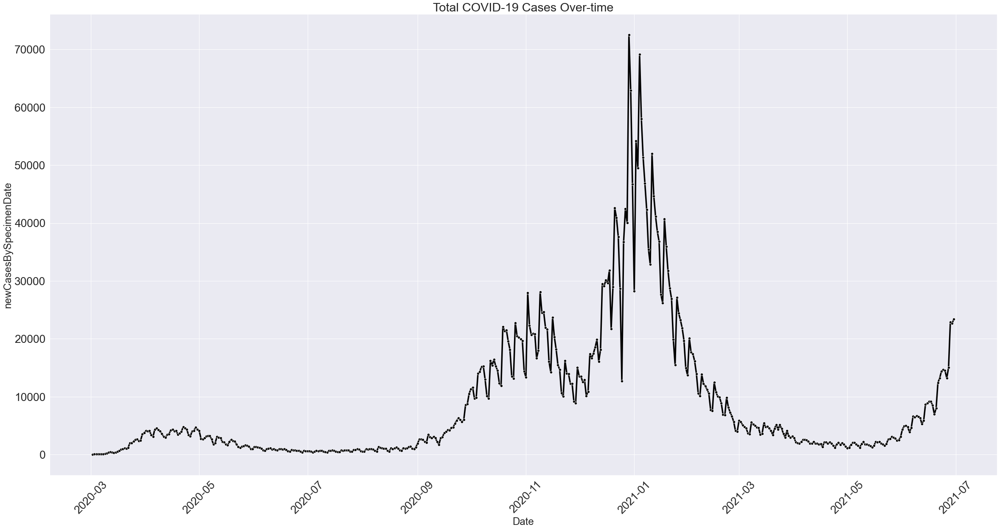

In [266]:
#Visualize Covid-19 Total Cases in England Overtime - Line Chart

plt.figure(figsize=(40,20))
sns.set(font_scale=2.4)
sns.lineplot(x='date',y='newCasesBySpecimenDate',ci=None,data=time_interval, color='black', linewidth=3.5, marker = 'o').set(title='Total COVID-19 Cases Over-time')
plt.xlabel('Date', fontsize=24)
plt.ylabel('newCasesBySpecimenDate', fontsize=24)
plt.xticks(rotation=45)
plt.show()

# Total COVID-19 Cases (Chunk-Wise)

# Period - 1 (Mar,20 - June,20)

In [267]:
#Select Data for period-1

wave_1 = (eng_cases['date'] > '2020-03-01') & (eng_cases['date'] <= '2020-06-30')
wave_1 = eng_cases.loc[wave_1]
wave_1

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
434,E92000001,England,nation,2020-06-30,572
435,E92000001,England,nation,2020-06-29,667
436,E92000001,England,nation,2020-06-28,410
437,E92000001,England,nation,2020-06-27,504
438,E92000001,England,nation,2020-06-26,641
...,...,...,...,...,...
550,E92000001,England,nation,2020-03-06,73
551,E92000001,England,nation,2020-03-05,46
552,E92000001,England,nation,2020-03-04,49
553,E92000001,England,nation,2020-03-03,53


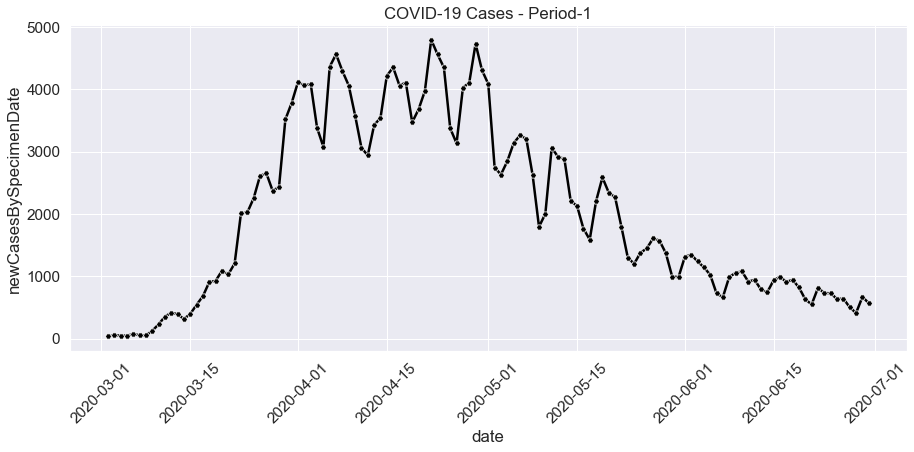

In [268]:
#Visualize Total COVID-19 Cases in Period 1 - Line Chart

plt.figure(figsize=(15,6))
sns.set(font_scale=1.4)
sns.lineplot(x='date',y='newCasesBySpecimenDate',ci=None,data=wave_1, color='black', linewidth=2.5, marker = 'H').set(title='COVID-19 Cases - Period-1')
plt.xticks(rotation=45)
plt.show()

# Period - 2 (July,20 - Oct,20)

In [269]:
#Select data for period 2

wave_2 = (eng_cases['date'] > '2020-07-01') & (eng_cases['date'] <= '2020-10-31')
wave_2 = eng_cases.loc[wave_2]
wave_2

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
311,E92000001,England,nation,2020-10-31,14348
312,E92000001,England,nation,2020-10-30,19641
313,E92000001,England,nation,2020-10-29,19968
314,E92000001,England,nation,2020-10-28,20232
315,E92000001,England,nation,2020-10-27,20489
...,...,...,...,...,...
428,E92000001,England,nation,2020-07-06,657
429,E92000001,England,nation,2020-07-05,540
430,E92000001,England,nation,2020-07-04,386
431,E92000001,England,nation,2020-07-03,541


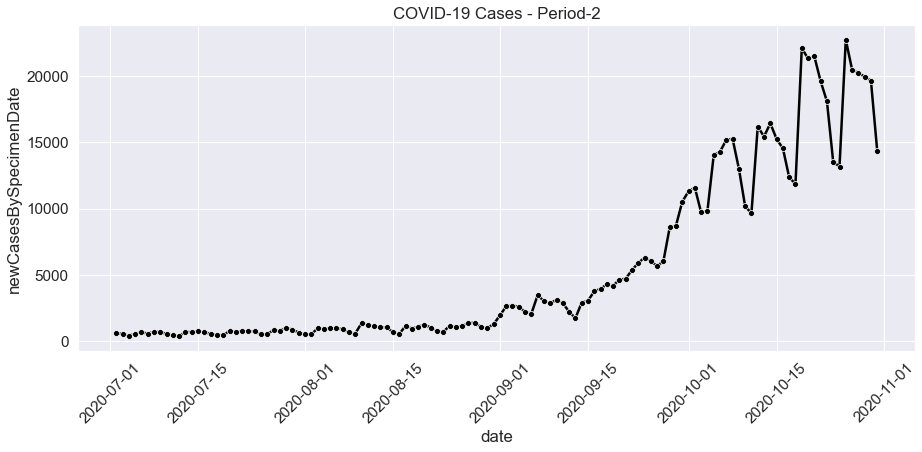

In [270]:
#Visualize Total COVID-19 Cases in Period 2 - Line Chart

plt.figure(figsize=(15,6))
sns.lineplot(x='date',y='newCasesBySpecimenDate',ci=None,data=wave_2, color='black', linewidth=2.5, marker = 'o').set(title='COVID-19 Cases - Period-2')
plt.xticks(rotation=45)
plt.show()

# Period - 3 (Nov,20 - Feb,21)

In [271]:
#Select data for Period-3

wave_3 = (eng_cases['date'] > '2020-11-01') & (eng_cases['date'] <= '2021-02-28')
wave_3 = eng_cases.loc[wave_3]
wave_3

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
191,E92000001,England,nation,2021-02-28,3952
192,E92000001,England,nation,2021-02-27,4103
193,E92000001,England,nation,2021-02-26,5666
194,E92000001,England,nation,2021-02-25,6611
195,E92000001,England,nation,2021-02-24,7291
...,...,...,...,...,...
305,E92000001,England,nation,2020-11-06,20821
306,E92000001,England,nation,2020-11-05,20868
307,E92000001,England,nation,2020-11-04,20692
308,E92000001,England,nation,2020-11-03,22306


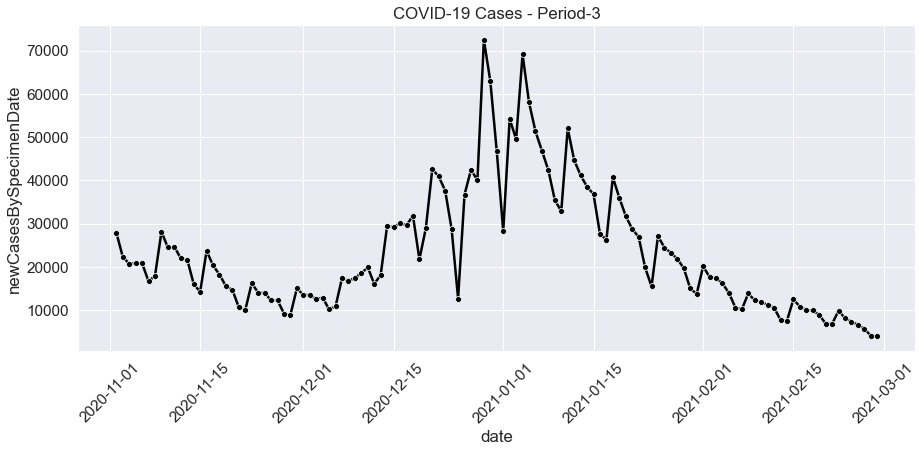

In [272]:
#Visualize Total COVID-19 Cases in Period 3 - Line Chart

plt.figure(figsize=(15,6))
sns.lineplot(x='date',y='newCasesBySpecimenDate',ci=None,data=wave_3, color='black', linewidth=2.5, marker = 'o').set(title='COVID-19 Cases - Period-3')
plt.xticks(rotation=45)
plt.show()

# Period - 4 (Mar,21 - June,21)

In [273]:
#Select data for period-4

wave_4 = (eng_cases['date'] > '2021-03-01') & (eng_cases['date'] <= '2021-06-30')
wave_4 = eng_cases.loc[wave_4]
wave_4

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
69,E92000001,England,nation,2021-06-30,23398
70,E92000001,England,nation,2021-06-29,22672
71,E92000001,England,nation,2021-06-28,22874
72,E92000001,England,nation,2021-06-27,15039
73,E92000001,England,nation,2021-06-26,13175
...,...,...,...,...,...
185,E92000001,England,nation,2021-03-06,3701
186,E92000001,England,nation,2021-03-05,4550
187,E92000001,England,nation,2021-03-04,4790
188,E92000001,England,nation,2021-03-03,5098


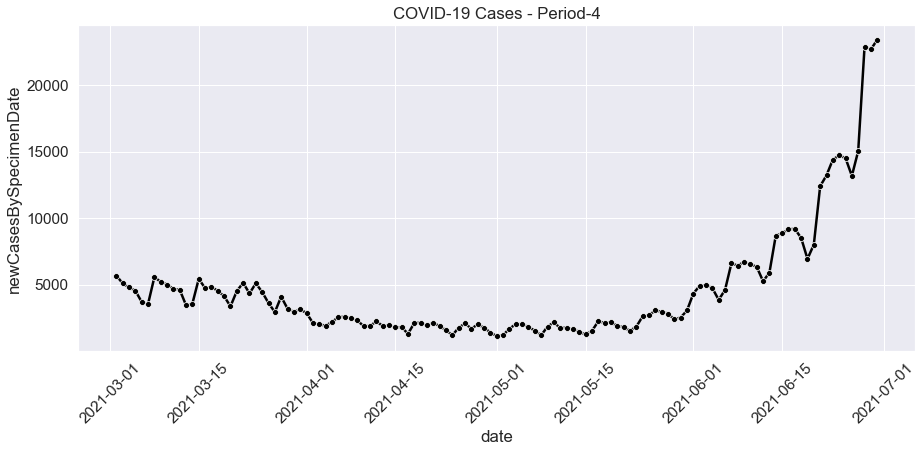

In [274]:
#Visualize Total COVID-19 Cases in Period 4 - Line Chart

plt.figure(figsize=(15,6))
sns.lineplot(x='date',y='newCasesBySpecimenDate',ci=None,data=wave_4, color='black', linewidth=2.5, marker = 'o').set(title='COVID-19 Cases - Period-4')
plt.xticks(rotation=45)
plt.show()

# England's COVID-19 Deaths Over time (Mar,20 - June,21)

In [275]:
#Convert date Column's Datatype

eng_deaths['date'] = pd.to_datetime(eng_deaths['date'])

In [276]:
#Select Data for chose timeframe

death_time = (eng_deaths['date'] > '2020-03-01') & (eng_deaths['date'] <= '2021-06-30')
death_time = eng_deaths.loc[death_time]

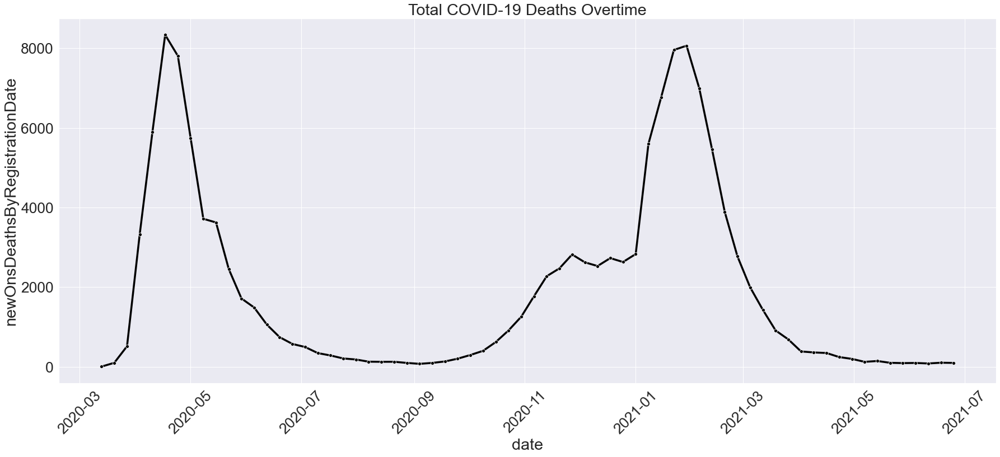

In [277]:
#Visualize Covid-19 Total Cases in England Overtime - Line Chart

plt.figure(figsize=(30,12))
sns.set(font_scale = 2.4)
sns.lineplot(x='date',y='newOnsDeathsByRegistrationDate',ci=None,data=death_time, color='black', linewidth=3.5, marker = 'o').set(title='Total COVID-19 Deaths Overtime')
plt.xticks(rotation=45)
plt.show()

# Total COVID-19 Deaths (Chunk-wise)

# Period-1 (Mar,20 - June,20)

In [278]:
#Select data for period-1

death_wave_1 = (eng_deaths['date'] > '2020-03-01') & (eng_deaths['date'] <= '2020-06-30')
death_wave_1 = eng_deaths.loc[death_wave_1]
death_wave_1

,areaCode,areaName,areaType,date,newOnsDeathsByRegistrationDate
61,E92000001,England,nation,2020-06-26,574
62,E92000001,England,nation,2020-06-19,744
63,E92000001,England,nation,2020-06-12,1057
64,E92000001,England,nation,2020-06-05,1488
65,E92000001,England,nation,2020-05-29,1715
66,E92000001,England,nation,2020-05-22,2455
67,E92000001,England,nation,2020-05-15,3624
68,E92000001,England,nation,2020-05-08,3716
69,E92000001,England,nation,2020-05-01,5748
70,E92000001,England,nation,2020-04-24,7806


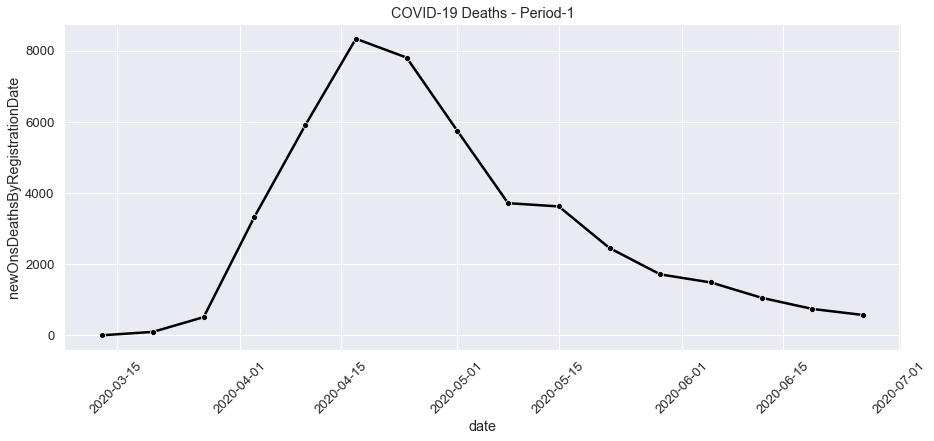

In [279]:
#Visualize Total COVID-19 Deaths in Period 1 - Line Chart

plt.figure(figsize=(15,6))
sns.set(font_scale = 1.2)
sns.lineplot(x='date',y='newOnsDeathsByRegistrationDate',ci=None,data=death_wave_1, color='black', linewidth=2.5, marker = 'o').set(title='COVID-19 Deaths - Period-1')
plt.xticks(rotation=45)
plt.show()

# Period - 2 (July,20 - Oct,20)

In [280]:
#Select data for period - 2

death_wave_2 = (eng_deaths['date'] > '2020-07-01') & (eng_deaths['date'] <= '2020-10-31')
death_wave_2 = eng_deaths.loc[death_wave_2]
death_wave_2

,areaCode,areaName,areaType,date,newOnsDeathsByRegistrationDate
43,E92000001,England,nation,2020-10-30,1258
44,E92000001,England,nation,2020-10-23,913
45,E92000001,England,nation,2020-10-16,622
46,E92000001,England,nation,2020-10-09,401
47,E92000001,England,nation,2020-10-02,296
48,E92000001,England,nation,2020-09-25,203
49,E92000001,England,nation,2020-09-18,134
50,E92000001,England,nation,2020-09-11,97
51,E92000001,England,nation,2020-09-04,74
52,E92000001,England,nation,2020-08-28,97


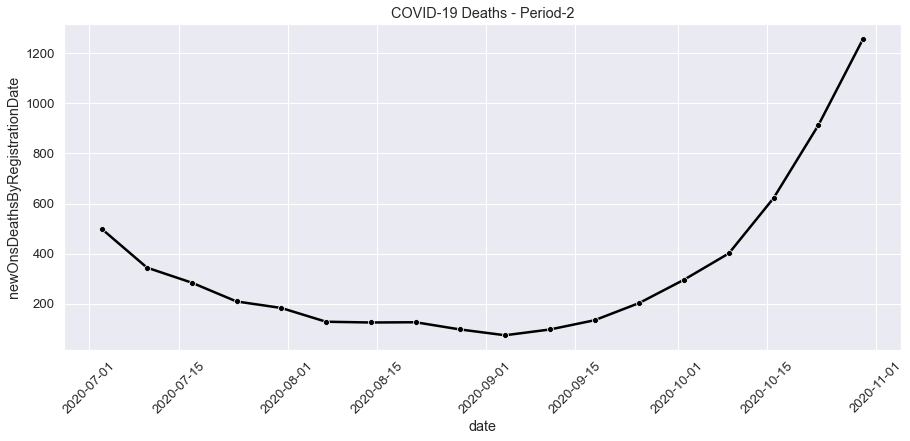

In [281]:
#Visualize Total COVID-19 Deaths in Period 2 - Line Chart

plt.figure(figsize=(15,6))
sns.lineplot(x='date',y='newOnsDeathsByRegistrationDate',ci=None,data=death_wave_2, color='black', linewidth=2.5, marker = 'o').set(title='COVID-19 Deaths - Period-2')
plt.xticks(rotation=45)
plt.show()

# Period - 3 (Nov,20 - Feb,21)

In [282]:
#Select data for period-3

death_wave_3 = (eng_deaths['date'] > '2020-11-01') & (eng_deaths['date'] <= '2021-02-28')
death_wave_3 = eng_deaths.loc[death_wave_3]
death_wave_3

,areaCode,areaName,areaType,date,newOnsDeathsByRegistrationDate
26,E92000001,England,nation,2021-02-26,2772
27,E92000001,England,nation,2021-02-19,3891
28,E92000001,England,nation,2021-02-12,5464
29,E92000001,England,nation,2021-02-05,6990
30,E92000001,England,nation,2021-01-29,8063
31,E92000001,England,nation,2021-01-22,7956
32,E92000001,England,nation,2021-01-15,6767
33,E92000001,England,nation,2021-01-08,5597
34,E92000001,England,nation,2021-01-01,2831
35,E92000001,England,nation,2020-12-25,2631


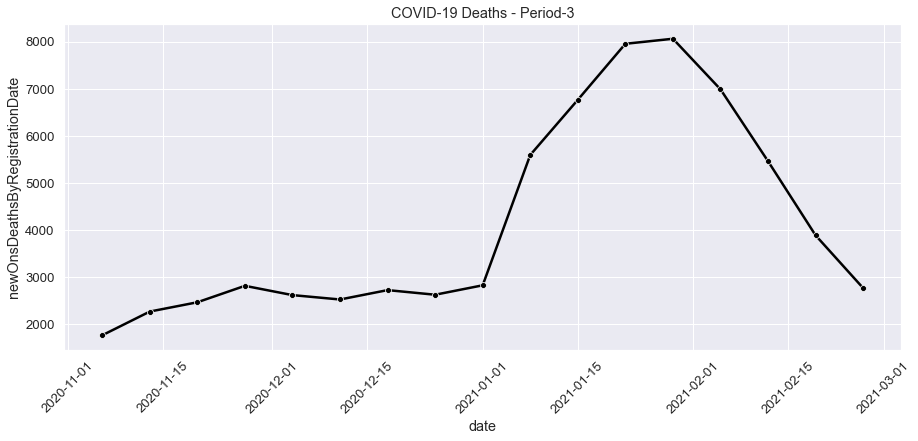

In [283]:
#Visualize Total COVID-19 Deaths in Period 3 - Line Chart

plt.figure(figsize=(15,6))
sns.lineplot(x='date',y='newOnsDeathsByRegistrationDate', ci=None,data=death_wave_3, color='black', linewidth=2.5, marker = 'o').set(title='COVID-19 Deaths - Period-3')
plt.xticks(rotation=45)
plt.show()

# Period - 4 (Mar,21 - June,30)

In [284]:
#select data for period-4

death_wave_4 = (eng_deaths['date'] > '2021-03-01') & (eng_deaths['date'] <= '2021-06-30')
death_wave_4 = eng_deaths.loc[death_wave_4]
death_wave_4

,areaCode,areaName,areaType,date,newOnsDeathsByRegistrationDate
9,E92000001,England,nation,2021-06-25,97
10,E92000001,England,nation,2021-06-18,102
11,E92000001,England,nation,2021-06-11,83
12,E92000001,England,nation,2021-06-04,96
13,E92000001,England,nation,2021-05-28,92
14,E92000001,England,nation,2021-05-21,100
15,E92000001,England,nation,2021-05-14,145
16,E92000001,England,nation,2021-05-07,124
17,E92000001,England,nation,2021-04-30,198
18,E92000001,England,nation,2021-04-23,244


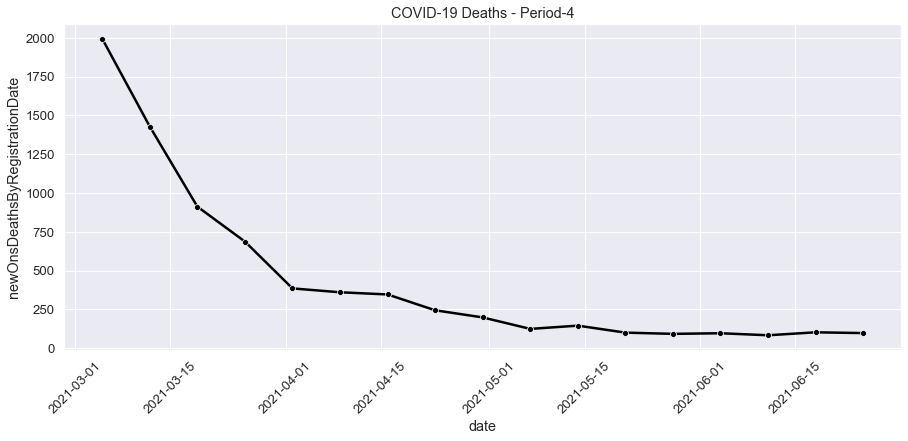

In [285]:
#Visualize Total COVID-19 Deaths in Period 4 - Line Chart

plt.figure(figsize=(15,6))
sns.lineplot(x='date',y='newOnsDeathsByRegistrationDate',ci=None,data=death_wave_4, color='black', linewidth=2.5, marker = 'o').set(title='COVID-19 Deaths - Period-4')
plt.xticks(rotation=45)
plt.show()

# Index of Multiple Deprivation (IMD) - Region-wise

In [286]:
#Concat IMD regions on mean

df3 = df1.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).mean()
df3 = df3.reset_index()
df3

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
0,E06000001,Hartlepool,3.689655,3.482759,3.068966,4.517241,2.637931,3.551724,7.758621,8.689655
1,E06000002,Middlesbrough,3.383721,3.337209,2.965116,3.860465,2.151163,3.453488,7.651163,7.441860
2,E06000003,Redcar and Cleveland,4.340909,4.318182,3.352273,4.715909,2.750000,4.931818,7.556818,8.670455
3,E06000004,Stockton-on-Tees,5.208333,5.025000,4.475000,5.450000,3.391667,6.041667,7.166667,9.150000
4,E06000005,Darlington,4.815385,4.738462,4.353846,4.738462,3.461538,3.600000,8.415385,8.138462
...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,7.099174,6.520661,6.950413,7.090909,7.636364,6.231405,4.884298,5.140496
313,E09000030,Tower Hamlets,3.680556,3.250000,4.763889,5.798611,4.541667,3.548611,2.659722,3.000000
314,E09000031,Waltham Forest,4.076389,4.118056,5.076389,5.555556,6.138889,3.826389,1.833333,2.715278
315,E09000032,Wandsworth,6.212291,5.955307,7.100559,8.441341,7.016760,5.044693,3.810056,3.022346


In [287]:
#concat geometric coordinates with IMD data

shp_1['Local Authority District code (2019)'] = shp_1['lad19cd']
shp_1 = shp_1.drop(['lad19cd', 'objectid', 'lad19nm', 'lad19nmw', 'bng_e', 'bng_e', 'bng_n', 'st_areasha', 'st_lengths'], axis = 1)
shp = pd.merge(df3, shp_1, on = ['Local Authority District code (2019)'])
#shp = pd.merge(sql_df_imd_asc, shp_, on = ['Local Authority District code (2019)'])
shp = GeoDataFrame(shp)
#shp_1
#shp_1.isnull().sum()

In [288]:
#Select Least Deprived Regions based on IMD index

imd_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_imd_desc = lambda imd_desc: sqldf(imd_desc, globals())

sql_df_imd_desc = pysqldf_imd_desc(imd_desc)

sql_df_imd_desc 

least_ten = sql_df_imd_desc.head(10)
least_ten

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)
0,E07000089,Hart,9.385965
1,E06000041,Wokingham,9.272727
2,E07000005,Chiltern,8.859649
3,E07000176,Rushcliffe,8.823529
4,E07000155,South Northamptonshire,8.784314
5,E07000228,Mid Sussex,8.767442
6,E07000216,Waverley,8.719512
7,E07000208,Epsom and Ewell,8.704545
8,E07000207,Elmbridge,8.703704
9,E07000214,Surrey Heath,8.690909


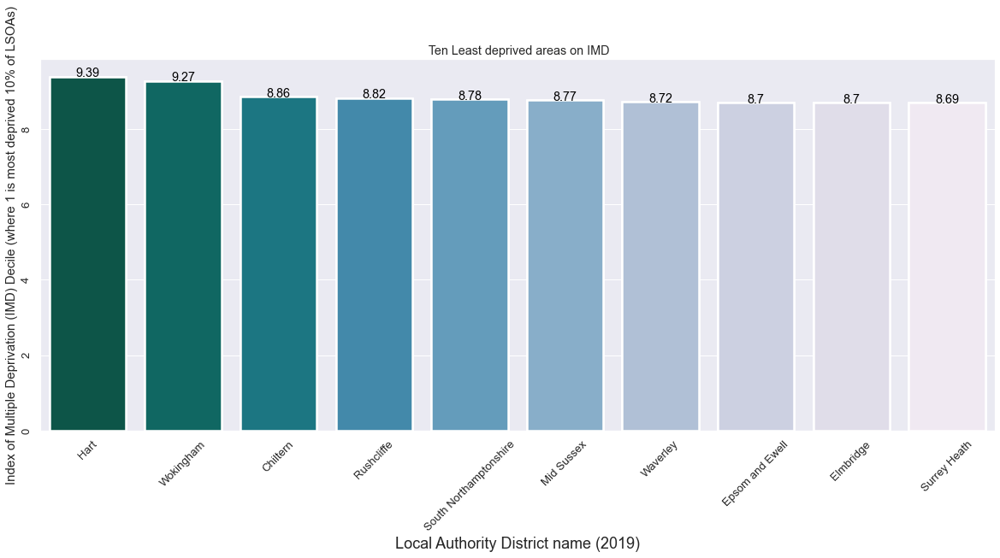

In [289]:
#Visualize Least Deprived Regions based on IMD index - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
plt.ylabel('Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)', fontsize=15)

sns.barplot(x="Local Authority District name (2019)", y="Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)", data=least_ten,
                 linewidth=2.5).set(title=' Ten Least deprived areas on IMD')

g = sns.barplot(x="Local Authority District name (2019)", y="Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)", data=least_ten,
                 linewidth=2.5,  palette=("PuBuGn_r"))
for index, row in least_ten.iterrows():
    g.text(row.name,row['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")

In [290]:
#Select Most Deprived Regions based on IMD index

imd_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_imd_asc = lambda imd_asc: sqldf(imd_asc, globals())

sql_df_imd_asc = pysqldf_imd_asc(imd_asc)

sql_df_imd_asc = sql_df_imd_asc.head(10)
imd_top_ten = sql_df_imd_asc.head(10)
imd_top_ten

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)
0,E06000009,Blackpool,2.414894
1,E08000003,Manchester,2.542553
2,E08000011,Knowsley,2.561224
3,E09000002,Barking and Dagenham,2.681818
4,E09000012,Hackney,2.743056
5,E08000012,Liverpool,2.751678
6,E08000028,Sandwell,2.811828
7,E08000025,Birmingham,2.890454
8,E06000010,"Kingston upon Hull, City of",2.951807
9,E06000018,Nottingham,2.961538


In [291]:
#Merge top ten deprived areas on IMD data wih the geometry coordinates

imd_map = pd.merge(imd_top_ten, shp_1, on = ['Local Authority District code (2019)'])
imd_map = GeoDataFrame(imd_map)
imd_map

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),long,lat,geometry
0,E06000009,Blackpool,2.414894,-3.021990,53.821640,"POLYGON ((-3.04774 53.87572, -3.01975 53.86860..."
1,E08000003,Manchester,2.542553,-2.233590,53.470089,"POLYGON ((-2.25697 53.51795, -2.24664 53.52924..."
2,E08000011,Knowsley,2.561224,-2.832970,53.437881,"POLYGON ((-2.88799 53.50383, -2.86515 53.49209..."
3,E09000002,Barking and Dagenham,2.681818,0.129479,51.545551,"POLYGON ((0.14679 51.56877, 0.16190 51.56161, ..."
4,E09000012,Hackney,2.743056,-0.060450,51.554920,"POLYGON ((-0.06116 51.57779, -0.04709 51.56258..."
5,E08000012,Liverpool,2.751678,-2.913640,53.408298,"POLYGON ((-2.92262 53.47498, -2.91438 53.46501..."
6,E08000028,Sandwell,2.811828,-2.007710,52.514771,"POLYGON ((-2.05098 52.55273, -2.01098 52.56907..."
7,E08000025,Birmingham,2.890454,-1.881410,52.484039,"POLYGON ((-1.87256 52.58494, -1.85395 52.60193..."
8,E06000010,"Kingston upon Hull, City of",2.951807,-0.303820,53.769199,"POLYGON ((-0.33122 53.73831, -0.41921 53.71958..."
9,E06000018,Nottingham,2.961538,-1.166670,52.954189,"POLYGON ((-1.18275 53.01857, -1.14351 53.00650..."


In [292]:
#Visualize the Region's IMD Index and highlighted the most deprived regions 

#Compute centroid mean of each region
x_map=shp_1.centroid.x.mean()
y_map=shp_1.centroid.y.mean()
#print(x_map,y_map)

#Create Color grid
linear = cmp.LinearColormap(
    ['yellow', 'green', 'purple'],
    vmin=3, vmax=10,
    caption='Color Scale for Map' #Caption for Color scale or Legend
)
colormap = linear.to_step(9)

#Locate the regions
mymap = folium.Map(location=[y_map, x_map], zoom_start=6,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(mymap)
colormap.caption = "Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)"
style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL=folium.features.GeoJson(
        shp,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(fields=['Local Authority District name (2019)','Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'],
            aliases=['Local Authority District name','(IMD) Decile (where 1 is most deprived 10% of LSOAs)'],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
        )
    )
folium.Marker(
    radius=100,
    location=[53.821640, -3.021990],
    popup="Blackpool",
    icon=folium.Icon(color="gray", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap)

folium.Marker(
    location=[53.470089, -2.233590],
    radius=50,
    popup="Manchester",
    icon=folium.Icon(color="green", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap)
folium.Marker(
    radius=100,
    location=[53.437881, -2.832970],
    popup="Knowsley",
    icon=folium.Icon(color="lightblue", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap)

folium.Marker(
    location=[51.545551, 0.129479],
    radius=50,
    popup="Barking and Dagenham",
    icon=folium.Icon(color="black", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap)

folium.Marker(
    location=[51.554920, -0.060450],
    popup="Hackney", 
    icon=folium.Icon(color="orange", icon="info-sign"),
).add_to(mymap)
folium.Marker(
    location=[53.408298, -2.913640],
    popup="Liverpool",
    icon=folium.Icon(color="blue", icon="info-sign"),
).add_to(mymap)
folium.Marker(
    location=[52.514771, -2.007710],
    popup="Sandwell",
    icon=folium.Icon(color="red", icon="info-sign"),
).add_to(mymap)
folium.Marker(
    location=[52.484039, -1.881410],
    popup="Birmingham",
    icon=folium.Icon(color="white", icon="info-sign"),
).add_to(mymap)
folium.Marker(
    location=[53.769199, -0.303820],
    popup="Kingston upon Hull",
    icon=folium.Icon(color="lightgreen", icon="info-sign"),
).add_to(mymap)
folium.Marker(
    location=[52.954189, -1.166670],
    popup="Nottingham",
    icon=folium.Icon(color="purple", icon="info-sign"),
).add_to(mymap)
colormap.add_to(mymap)
mymap.add_child(NIL)
mymap

<ipython-input-292-f6c890d830aa>:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  x_map=shp_1.centroid.x.mean()
<ipython-input-292-f6c890d830aa>:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  y_map=shp_1.centroid.y.mean()


Move Cursor on the regions on map to know the IMD Index

# Income

In [293]:
#Select Least Deprived Areas on Income Decile

inc_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Income Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Income Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_inc_desc = lambda inc_desc: sqldf(inc_desc, globals())

sql_df_inc_desc = pysqldf_inc_desc(inc_desc)

sql_df_inc_desc = sql_df_inc_desc.head(10)
sql_df_inc_desc

,Local Authority District code (2019),Local Authority District name (2019),Income Decile (where 1 is most deprived 10% of LSOAs)
0,E06000053,Isles of Scilly,10.000000
1,E07000089,Hart,9.000000
2,E06000041,Wokingham,8.838384
3,E07000155,South Northamptonshire,8.549020
4,E07000208,Epsom and Ewell,8.340909
5,E07000005,Chiltern,8.333333
6,E07000214,Surrey Heath,8.290909
7,E07000228,Mid Sussex,8.290698
8,E07000210,Mole Valley,8.259259
9,E07000179,South Oxfordshire,8.258427


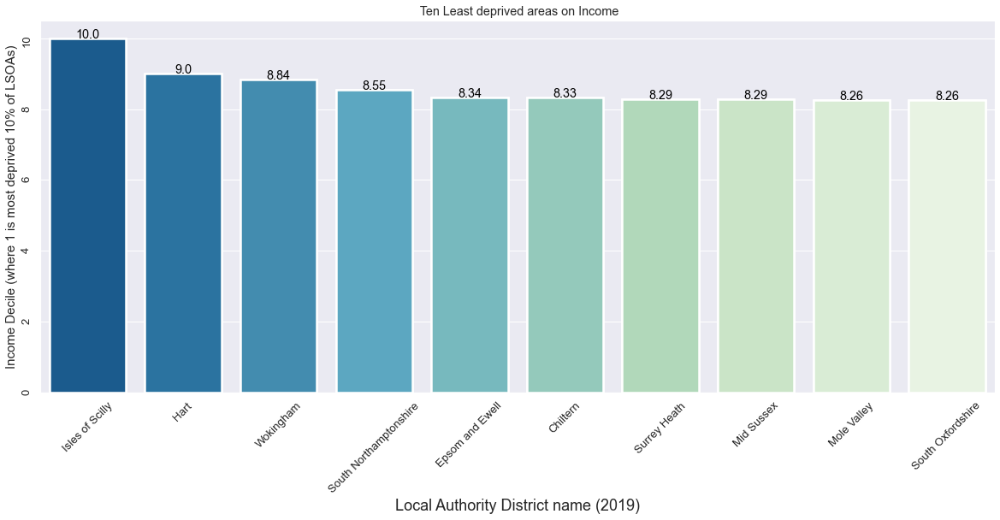

In [294]:
#Visualize Least Deprived Regions based on Income Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
plt.ylabel('Income Decile (where 1 is most deprived 10% of LSOAs)', fontsize=15)
sns.barplot(x="Local Authority District name (2019)", y="Income Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_inc_desc,
                 linewidth=2.5).set(title=' Ten Least deprived areas on Income')

s = sns.barplot(x="Local Authority District name (2019)", y="Income Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_inc_desc,
                 linewidth=2.5, palette=("GnBu_r"))

for index, row in sql_df_inc_desc.iterrows():
    s.text(row.name,row['Income Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Income Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


In [295]:
#Select Most Deprived Areas on Income Decile

inc_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Income Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Income Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_inc_asc = lambda inc_asc: sqldf(inc_asc, globals())

sql_df_inc_asc = pysqldf_inc_asc(inc_asc)

sql_df_inc_asc = sql_df_inc_asc.head(10)
sql_df_inc_asc

,Local Authority District code (2019),Local Authority District name (2019),Income Decile (where 1 is most deprived 10% of LSOAs)
0,E08000028,Sandwell,2.844086
1,E06000009,Blackpool,2.861702
2,E09000002,Barking and Dagenham,2.863636
3,E08000011,Knowsley,2.877551
4,E09000012,Hackney,2.958333
5,E08000012,Liverpool,3.167785
6,E08000031,Wolverhampton,3.215190
7,E08000025,Birmingham,3.228482
8,E09000030,Tower Hamlets,3.250000
9,E08000003,Manchester,3.315603


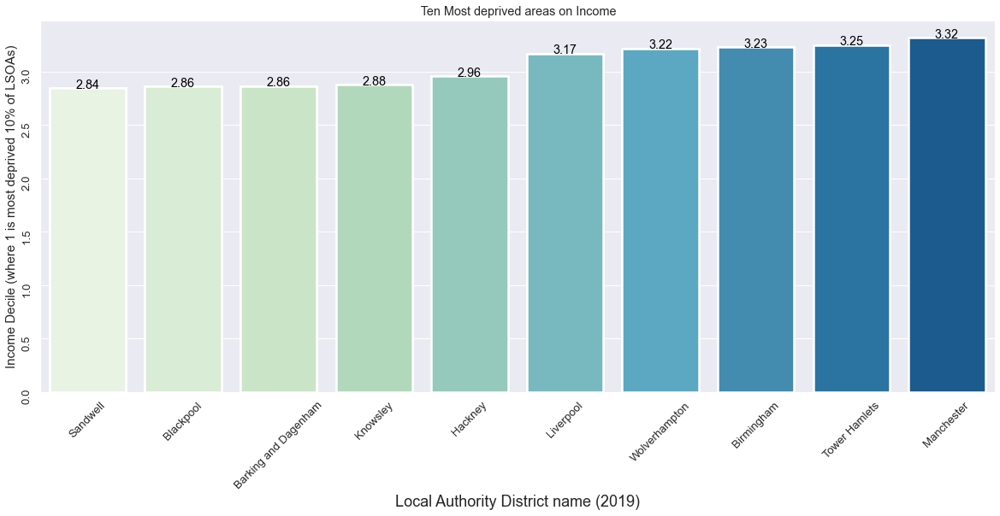

In [296]:
#Visualize Most Deprived Regions based on Income Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
plt.ylabel('Income Decile (where 1 is most deprived 10% of LSOAs)', fontsize=15)
sns.barplot(x="Local Authority District name (2019)", y="Income Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_inc_asc,
                 linewidth=2.5).set(title=' Ten Most deprived areas on Income')

s1 = sns.barplot(x="Local Authority District name (2019)", y="Income Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_inc_asc,
                 linewidth=2.5, palette=("GnBu"))

for index, row in sql_df_inc_asc.iterrows():
    s1.text(row.name,row['Income Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Income Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


# Employment

In [297]:
#Select Least Deprived Areas on Employment Decile

emp_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Employment Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Employment Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_emp_desc = lambda emp_desc: sqldf(emp_desc, globals())

sql_df_emp_desc = pysqldf_emp_desc(emp_desc)

sql_df_emp_desc = sql_df_emp_desc.head(10)
sql_df_emp_desc

,Local Authority District code (2019),Local Authority District name (2019),Employment Decile (where 1 is most deprived 10% of LSOAs)
0,E06000053,Isles of Scilly,10.000000
1,E07000089,Hart,9.122807
2,E06000041,Wokingham,8.929293
3,E07000077,Uttlesford,8.782609
4,E07000179,South Oxfordshire,8.629213
5,E07000155,South Northamptonshire,8.607843
6,E07000208,Epsom and Ewell,8.568182
7,E07000214,Surrey Heath,8.545455
8,E07000207,Elmbridge,8.543210
9,E07000006,South Bucks,8.425000


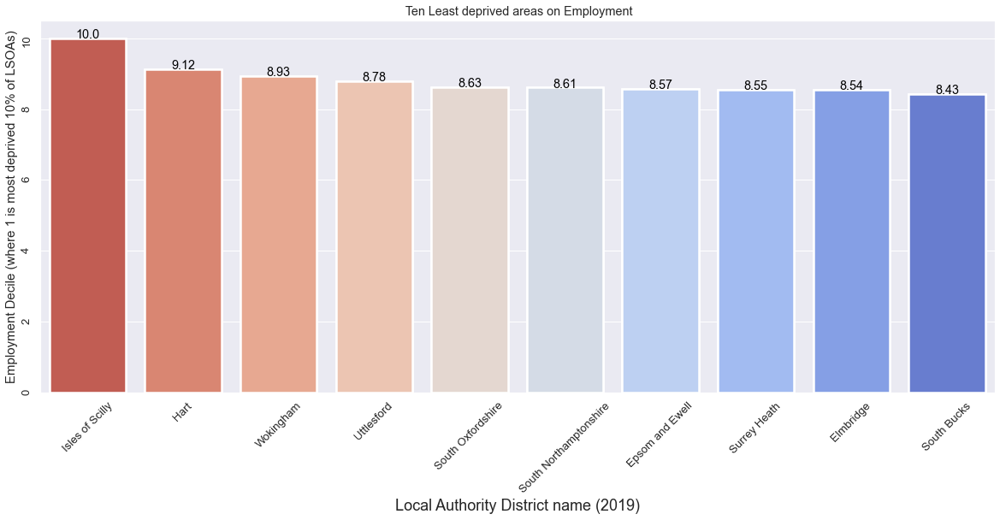

In [298]:
#Visualize Least Deprived Regions based on Employment Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
plt.ylabel('Employment Decile (where 1 is most deprived 10% of LSOAs)', fontsize=15)
sns.barplot(x="Local Authority District name (2019)", y="Employment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_emp_desc,
                 linewidth=2.5).set(title=' Ten Least deprived areas on Employment')

t = sns.barplot(x="Local Authority District name (2019)", y="Employment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_emp_desc,
                 linewidth=2.5, palette=("coolwarm_r"))

for index, row in sql_df_emp_desc.iterrows():
    t.text(row.name,row['Employment Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Employment Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


In [299]:
#Select Most Deprived Areas on Employment Decile

emp_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Employment Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Employment Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_emp_asc = lambda emp_asc: sqldf(emp_asc, globals())

sql_df_emp_asc = pysqldf_emp_asc(emp_asc)

sql_df_emp_asc = sql_df_emp_asc.head(10)
sql_df_emp_asc

,Local Authority District code (2019),Local Authority District name (2019),Employment Decile (where 1 is most deprived 10% of LSOAs)
0,E08000011,Knowsley,2.469388
1,E06000009,Blackpool,2.531915
2,E08000023,South Tyneside,2.794118
3,E08000012,Liverpool,2.956376
4,E06000002,Middlesbrough,2.965116
5,E06000001,Hartlepool,3.068966
6,E08000028,Sandwell,3.069892
7,E08000024,Sunderland,3.070270
8,E08000031,Wolverhampton,3.094937
9,E07000117,Burnley,3.216667


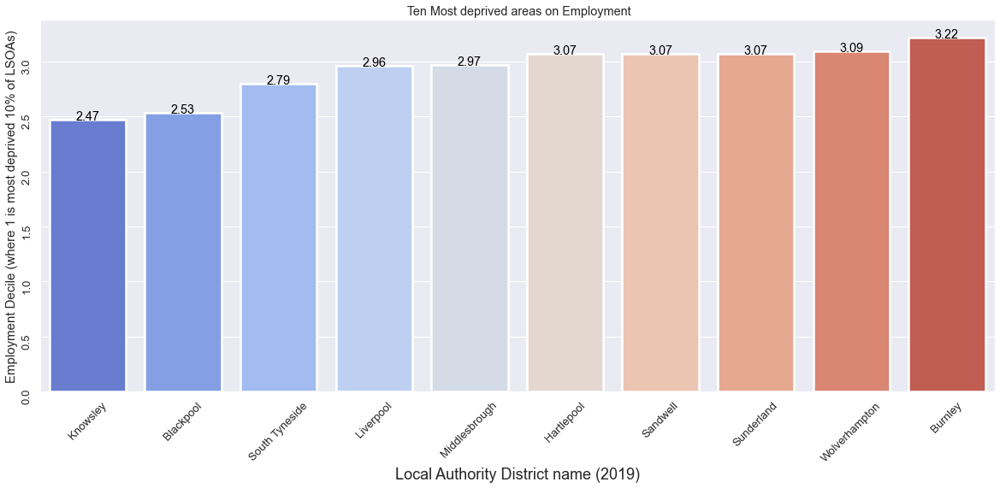

In [300]:
#Visualize Most Deprived Regions based on Employment Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
plt.ylabel('Employment Decile (where 1 is most deprived 10% of LSOAs)', fontsize=15)

sns.barplot(x="Local Authority District name (2019)", y="Employment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_emp_asc,
                 linewidth=2.5).set(title=' Ten Most deprived areas on Employment')


t1 = sns.barplot(x="Local Authority District name (2019)", y="Employment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_emp_asc,
                 linewidth=2.5, palette=("coolwarm"))

for index, row in sql_df_emp_asc.iterrows():
    t1.text(row.name,row['Employment Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Employment Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


# Education, Training and Skills

In [301]:
#Select Least Deprived Areas on Education Decile

edu_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_edu_desc = lambda edu_desc: sqldf(edu_desc, globals())

sql_df_edu_desc = pysqldf_edu_desc(edu_desc)

sql_df_edu_desc = sql_df_edu_desc.head(10)
sql_df_edu_desc

,Local Authority District code (2019),Local Authority District name (2019),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)"
0,E09000027,Richmond upon Thames,9.234783
1,E09000001,City of London,8.833333
2,E07000240,St Albans,8.793103
3,E07000176,Rushcliffe,8.779412
4,E09000020,Kensington and Chelsea,8.747573
5,E07000005,Chiltern,8.614035
6,E06000041,Wokingham,8.535354
7,E07000207,Elmbridge,8.481481
8,E09000032,Wandsworth,8.441341
9,E07000089,Hart,8.421053


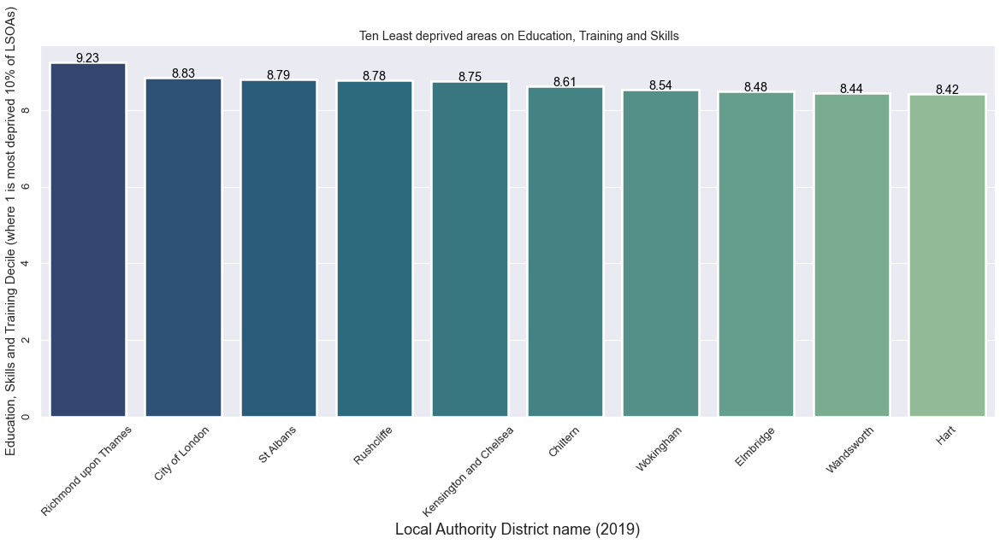

In [302]:
#Visualize Least Deprived Regions based on Education Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
plt.ylabel('Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)', fontsize=15)

sns.barplot(x="Local Authority District name (2019)", y="Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_edu_desc,
                 linewidth=2.5).set(title=' Ten Least deprived areas on Education, Training and Skills')

u = sns.barplot(x="Local Authority District name (2019)", y="Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_edu_desc,
                 linewidth=2.5, palette=("crest_r") )

for index, row in sql_df_edu_desc.iterrows():
    u.text(row.name,row['Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


In [303]:
#Select Most Deprived Areas on Education Decile

edu_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_edu_asc = lambda edu_asc: sqldf(edu_asc, globals())

sql_df_edu_asc = pysqldf_edu_asc(edu_asc)

sql_df_edu_asc = sql_df_edu_asc.head(10)
sql_df_edu_asc

,Local Authority District code (2019),Local Authority District name (2019),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)"
0,E07000136,Boston,2.722222
1,E07000010,Fenland,2.818182
2,E07000145,Great Yarmouth,2.836066
3,E07000150,Corby,2.951220
4,E06000010,"Kingston upon Hull, City of",2.957831
5,E08000011,Knowsley,2.969388
6,E06000021,Stoke-on-Trent,3.037736
7,E08000028,Sandwell,3.059140
8,E07000140,South Holland,3.061224
9,E06000009,Blackpool,3.106383


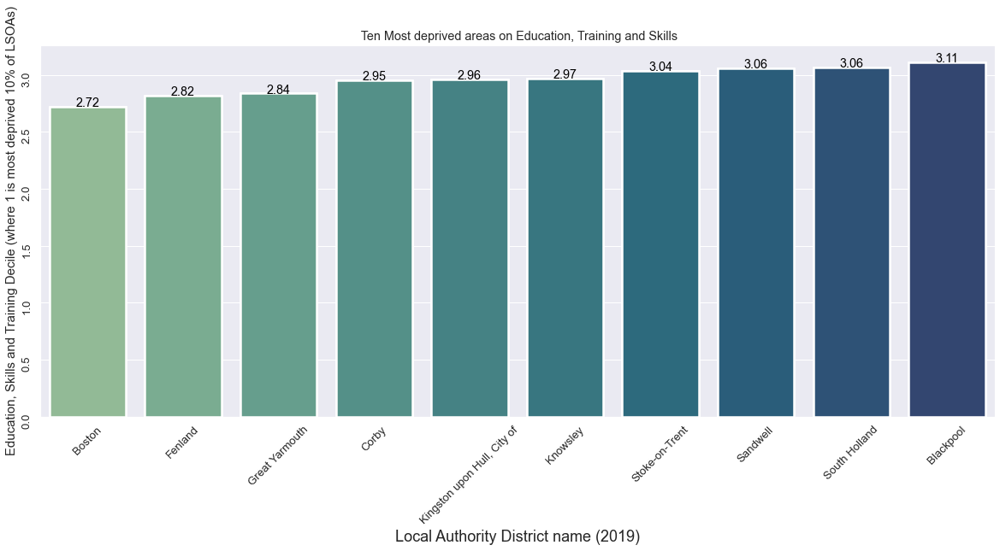

In [304]:
#Visualize Most Deprived Regions based on Education Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
plt.ylabel('Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)', fontsize=15)

sns.barplot(x="Local Authority District name (2019)", y="Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_edu_asc,
                 linewidth=2.5).set(title=' Ten Most deprived areas on Education, Training and Skills')


u1 = sns.barplot(x="Local Authority District name (2019)", y="Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_edu_asc,
                 linewidth=2.5,palette=("crest") )

for index, row in sql_df_edu_asc.iterrows():
    u1.text(row.name,row['Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


# Health

In [305]:
#Select Least Deprived Areas on Health Decile

health_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_health_desc = lambda health_desc: sqldf(health_desc, globals())

sql_df_health_desc = pysqldf_health_desc(health_desc)

sql_df_health_desc = sql_df_health_desc.head(10)
sql_df_health_desc



,Local Authority District code (2019),Local Authority District name (2019),Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)
0,E06000053,Isles of Scilly,10.000000
1,E07000089,Hart,9.789474
2,E06000041,Wokingham,9.696970
3,E07000005,Chiltern,9.561404
4,E07000077,Uttlesford,9.543478
5,E07000207,Elmbridge,9.432099
6,E07000242,East Hertfordshire,9.380952
7,E09000027,Richmond upon Thames,9.347826
8,E07000179,South Oxfordshire,9.325843
9,E07000228,Mid Sussex,9.313953


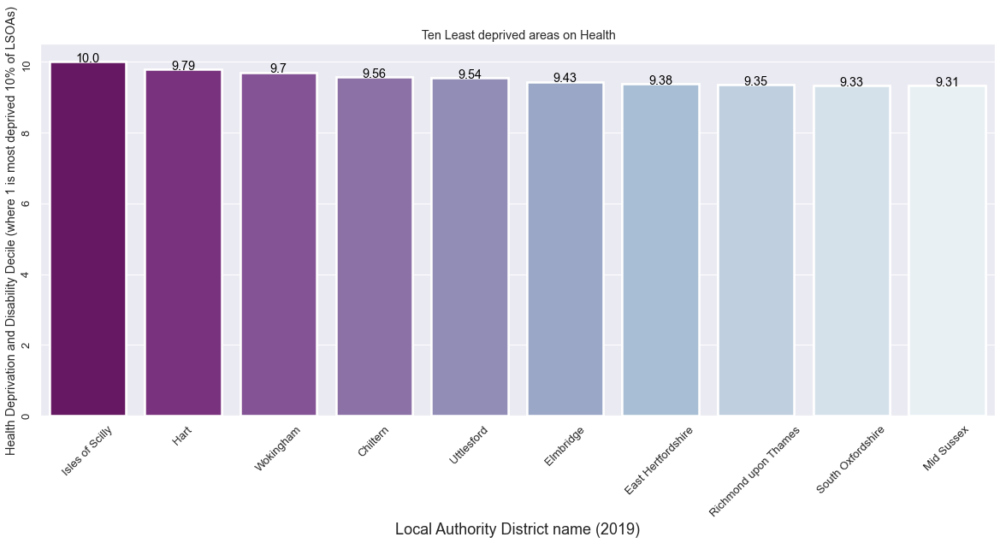

In [306]:
#Visualize Least Deprived Regions based on Health Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
sns.barplot(x="Local Authority District name (2019)", y="Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_health_desc,
                 linewidth=2.5).set(title=' Ten Least deprived areas on Health')


v = sns.barplot(x="Local Authority District name (2019)", y="Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_health_desc,
                 linewidth=2.5, palette=("BuPu_r"))

for index, row in sql_df_health_desc.iterrows():
    v.text(row.name,row['Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


In [307]:
#Select Most Deprived Areas on Health Decile

health_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_health_asc = lambda health_asc: sqldf(health_asc, globals())

sql_df_health_asc = pysqldf_health_asc(health_asc)

sql_df_health_asc = sql_df_health_asc.head(10)
sql_df_health_asc

,Local Authority District code (2019),Local Authority District name (2019),Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)
0,E06000009,Blackpool,1.393617
1,E08000011,Knowsley,1.642857
2,E07000027,Barrow-in-Furness,1.775510
3,E08000012,Liverpool,1.825503
4,E08000003,Manchester,1.858156
5,E07000117,Burnley,2.066667
6,E07000120,Hyndburn,2.115385
7,E06000021,Stoke-on-Trent,2.132075
8,E06000002,Middlesbrough,2.151163
9,E08000013,St. Helens,2.193277


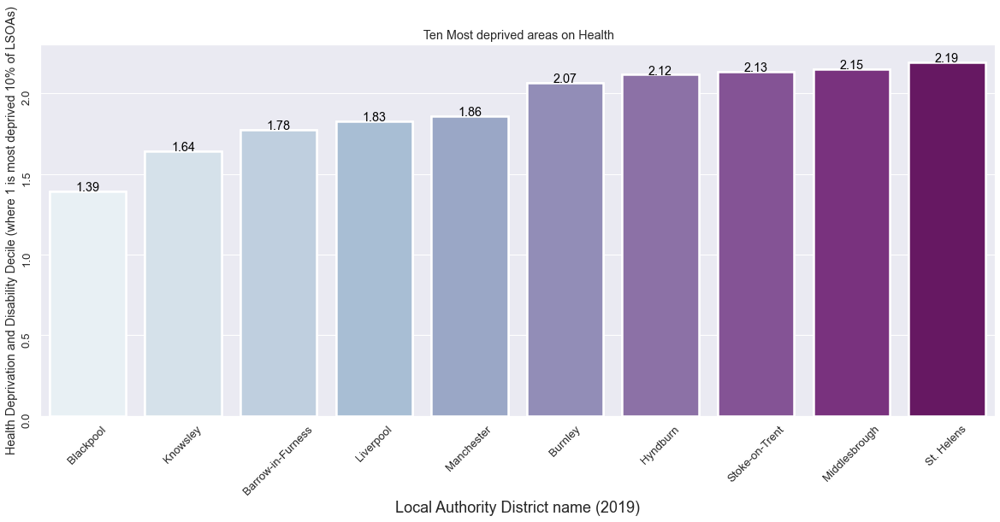

In [308]:
#Visualize Most Deprived Regions based on Health Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)

sns.barplot(x="Local Authority District name (2019)", y="Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_health_asc,
                 linewidth=2.5).set(title=' Ten Most deprived areas on Health')


v1 = sns.barplot(x="Local Authority District name (2019)", y="Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_health_asc,
                 linewidth=2.5, palette=("BuPu") )

for index, row in sql_df_health_asc.iterrows():
    v1.text(row.name,row['Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


# Crime

In [309]:
#Select Least Deprived Areas on Crime Decile

crime_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Crime Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Crime Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_crime_desc = lambda crime_desc: sqldf(crime_desc, globals())

sql_df_crime_desc = pysqldf_crime_desc(crime_desc)

sql_df_crime_desc = sql_df_crime_desc.head(10)
sql_df_crime_desc

,Local Authority District code (2019),Local Authority District name (2019),Crime Decile (where 1 is most deprived 10% of LSOAs)
0,E09000001,City of London,9.833333
1,E07000167,Ryedale,9.500000
2,E07000139,North Kesteven,9.484375
3,E07000166,Richmondshire,9.470588
4,E07000035,Derbyshire Dales,9.302326
5,E06000017,Rutland,9.217391
6,E07000079,Cotswold,9.137255
7,E07000044,South Hams,9.081633
8,E07000164,Hambleton,9.076923
9,E07000144,Broadland,9.047619


<Figure size 1440x576 with 0 Axes>

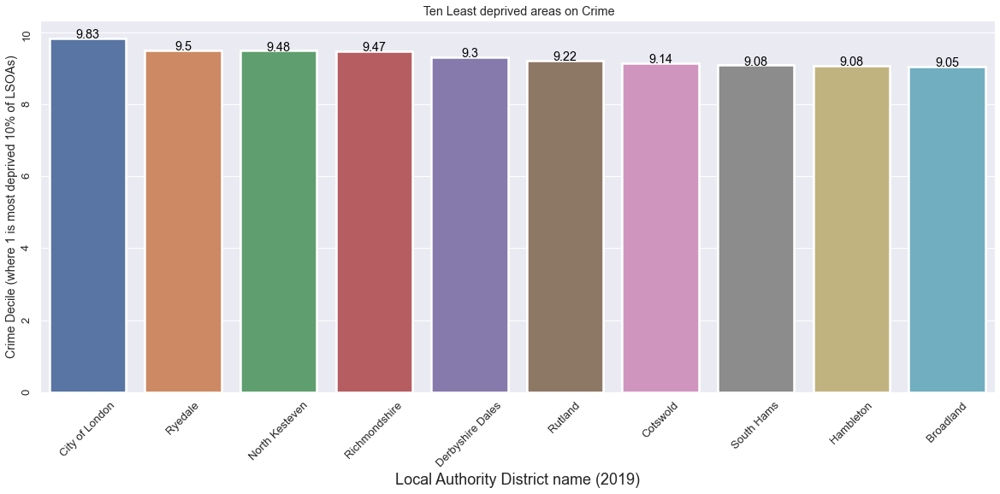

In [310]:
#Visualize Least Deprived Regions based on Crime Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)

sns.barplot(x="Local Authority District name (2019)", y="Crime Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_crime_desc,
                 linewidth=2.5, palette=("PuBuGn_r")).set(title=' Ten Least deprived areas on Crime')


w = sns.barplot(x="Local Authority District name (2019)", y="Crime Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_crime_desc,
                 linewidth=2.5 )

for index, row in sql_df_crime_desc.iterrows():
    w.text(row.name,row['Crime Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Crime Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


In [311]:
#Select Most Deprived Areas on Crime Decile

crime_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Crime Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Crime Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_crime_asc = lambda crime_asc: sqldf(crime_asc, globals())

sql_df_crime_asc = pysqldf_crime_asc(crime_asc)

sql_df_crime_asc = sql_df_crime_asc.head(10)
sql_df_crime_asc

,Local Authority District code (2019),Local Authority District name (2019),Crime Decile (where 1 is most deprived 10% of LSOAs)
0,E08000003,Manchester,1.762411
1,E08000005,Rochdale,2.298507
2,E06000045,Southampton,2.439189
3,E08000032,Bradford,2.674194
4,E08000004,Oldham,2.695035
5,E07000109,Gravesham,2.718750
6,E06000010,"Kingston upon Hull, City of",2.728916
7,E06000023,"Bristol, City of",2.771863
8,E09000014,Haringey,2.827586
9,E08000008,Tameside,2.886525


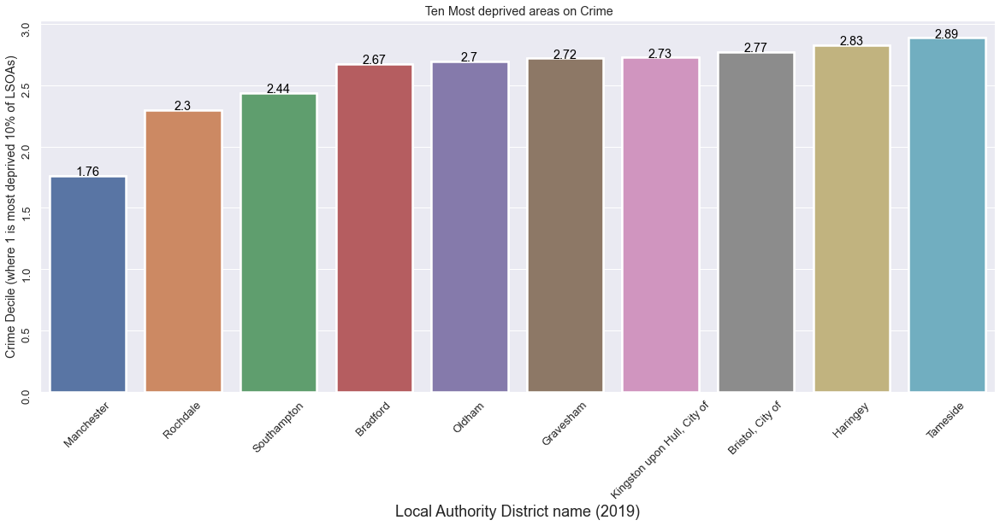

In [312]:
#Visualize Most Deprived Regions based on Crime Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)

sns.barplot(x="Local Authority District name (2019)", y="Crime Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_crime_asc,
                 linewidth=2.5,palette=("PuBuGn_r")).set(title=' Ten Most deprived areas on Crime')

w1 = sns.barplot(x="Local Authority District name (2019)", y="Crime Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_crime_asc,
                 linewidth=2.5)
       
for index, row in sql_df_crime_asc.iterrows():
    w1.text(row.name,row['Crime Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Crime Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


# Barriers to Housing

In [313]:
#Select Least Deprived Areas on Housing Decile

BtH_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_BtH_desc = lambda BtH_desc: sqldf(BtH_desc, globals())

sql_df_BtH_desc = pysqldf_BtH_desc(BtH_desc)

sql_df_BtH_desc = sql_df_BtH_desc.head(10)
sql_df_BtH_desc

,Local Authority District code (2019),Local Authority District name (2019),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)
0,E07000027,Barrow-in-Furness,9.265306
1,E07000120,Hyndburn,9.250000
2,E07000036,Erewash,8.917808
3,E07000122,Pendle,8.877193
4,E08000015,Wirral,8.728155
5,E08000016,Barnsley,8.693878
6,E07000117,Burnley,8.600000
7,E08000014,Sefton,8.582011
8,E07000172,Broxtowe,8.549296
9,E06000009,Blackpool,8.436170


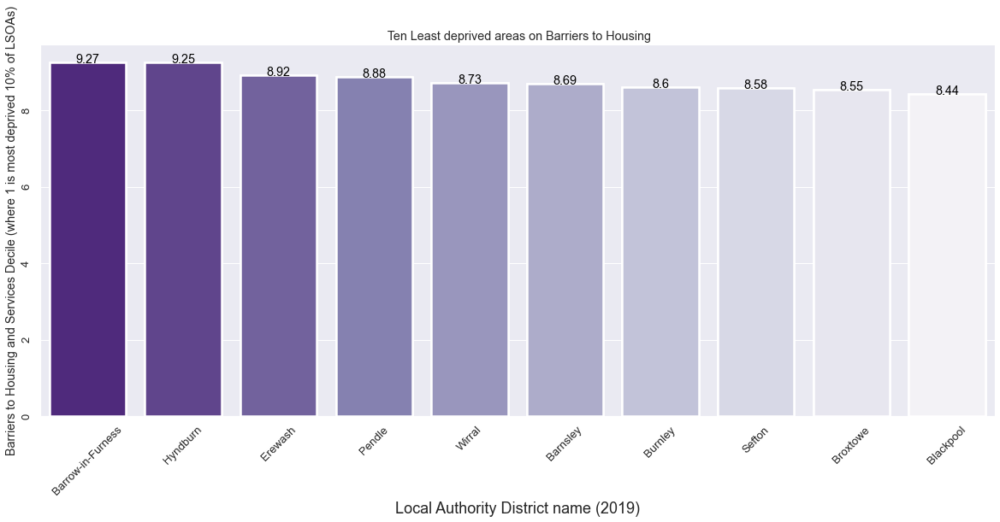

In [314]:
#Visualize Least Deprived Regions based on Housing Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)
sns.barplot(x="Local Authority District name (2019)", y="Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_BtH_desc,
                 linewidth=2.5).set(title=' Ten Least deprived areas on Barriers to Housing')

a = sns.barplot(x="Local Authority District name (2019)", y="Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_BtH_desc,
                 linewidth=2.5, palette=("Purples_r"))

for index, row in sql_df_BtH_desc.iterrows():
    a.text(row.name,row['Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


In [315]:
#Select Most Deprived Areas on Housing Decile

BtH_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_BtH_asc = lambda BtH_asc: sqldf(BtH_asc, globals())

sql_df_BtH_asc = pysqldf_BtH_asc(BtH_asc)

sql_df_BtH_asc = sql_df_BtH_asc.head(10)
sql_df_BtH_asc

,Local Authority District code (2019),Local Authority District name (2019),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)
0,E09000025,Newham,1.000000
1,E09000012,Hackney,1.069444
2,E09000002,Barking and Dagenham,1.081818
3,E09000005,Brent,1.283237
4,E09000010,Enfield,1.644809
5,E09000020,Kensington and Chelsea,1.796117
6,E09000001,City of London,1.833333
7,E09000031,Waltham Forest,1.833333
8,E06000039,Slough,1.887500
9,E09000014,Haringey,2.020690


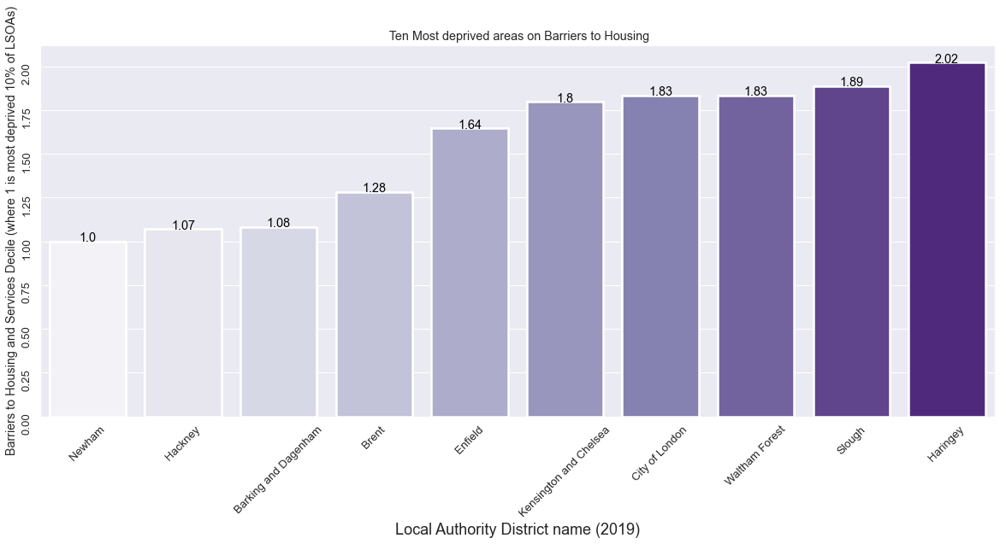

In [316]:
#Visualize Most Deprived Regions based on Housing Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)

sns.barplot(x="Local Authority District name (2019)", y="Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_BtH_asc,
                 linewidth=2.5).set(title=' Ten Most deprived areas on Barriers to Housing')

a1 = sns.barplot(x="Local Authority District name (2019)", y="Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_BtH_asc,
                 linewidth=2.5,  palette=("Purples"))

            
            
for index, row in sql_df_BtH_asc.iterrows():
    a1.text(row.name,row['Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


# Living Environment

In [317]:
#Select Least Deprived Areas on Living Environment Decile

Env_desc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Living Environment Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Living Environment Decile (where 1 is most deprived 10% of LSOAs)"
desc;
"""
pysqldf_Env_desc = lambda Env_desc: sqldf(Env_desc, globals())

sql_df_Env_desc = pysqldf_Env_desc(Env_desc)

sql_df_Env_desc = sql_df_Env_desc.head(10)
sql_df_Env_desc

,Local Authority District code (2019),Local Authority District name (2019),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
0,E07000073,Harlow,9.629630
1,E06000036,Bracknell Forest,9.360000
2,E08000024,Sunderland,9.356757
3,E08000023,South Tyneside,9.323529
4,E06000004,Stockton-on-Tees,9.150000
5,E06000047,County Durham,9.123457
6,E08000022,North Tyneside,9.022901
7,E07000005,Chiltern,8.947368
8,E07000075,Rochford,8.924528
9,E06000041,Wokingham,8.898990


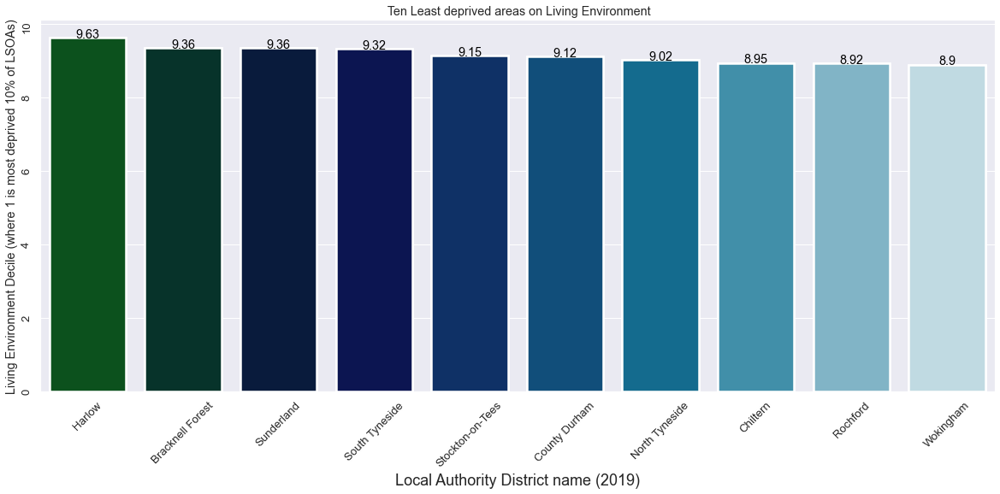

In [318]:
#Visualize Least Deprived Regions based on Living Environment Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)

sns.barplot(x="Local Authority District name (2019)", y="Living Environment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_Env_desc,
                 linewidth=2.5).set(title=' Ten Least deprived areas on Living Environment')


b = sns.barplot(x="Local Authority District name (2019)", y="Living Environment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_Env_desc,
                 linewidth=2.5, palette=("ocean"))

                    
for index, row in sql_df_Env_desc.iterrows():
    b.text(row.name,row['Living Environment Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Living Environment Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


In [319]:
#Select Least Deprived Areas on Living Environment Decile

Env_asc = """
select "Local Authority District code (2019)", "Local Authority District name (2019)", "Living Environment Decile (where 1 is most deprived 10% of LSOAs)" from df3
order by "Living Environment Decile (where 1 is most deprived 10% of LSOAs)"
asc;
"""
pysqldf_Env_asc = lambda Env_asc: sqldf(Env_asc, globals())

sql_df_Env_asc = pysqldf_Env_asc(Env_asc)

sql_df_Env_asc = sql_df_Env_asc.head(10)
sql_df_Env_asc

,Local Authority District code (2019),Local Authority District name (2019),Living Environment Decile (where 1 is most deprived 10% of LSOAs)
0,E06000053,Isles of Scilly,1.000000
1,E09000022,Lambeth,1.752809
2,E09000020,Kensington and Chelsea,1.766990
3,E09000033,Westminster,1.937500
4,E06000044,Portsmouth,2.008000
5,E08000025,Birmingham,2.239437
6,E07000122,Pendle,2.280702
7,E09000001,City of London,2.333333
8,E08000028,Sandwell,2.430108
9,E08000012,Liverpool,2.466443


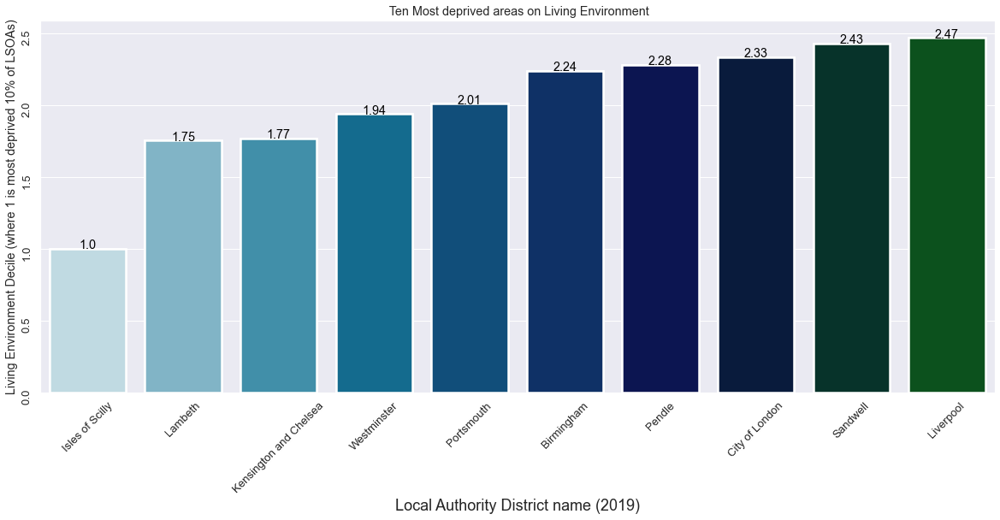

In [320]:
#Visualize Most Deprived Regions based on Living Environment Decile - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Local Authority District name (2019)', fontsize=18)

sns.barplot(x="Local Authority District name (2019)", y="Living Environment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_Env_asc,
                 linewidth=2.5).set(title=' Ten Most deprived areas on Living Environment')

b1 = sns.barplot(x="Local Authority District name (2019)", y="Living Environment Decile (where 1 is most deprived 10% of LSOAs)", data=sql_df_Env_asc,
                 linewidth=2.5,  palette=("ocean_r"))

                    
for index, row in sql_df_Env_asc.iterrows():
    b1.text(row.name,row['Living Environment Decile (where 1 is most deprived 10% of LSOAs)'], round(row['Living Environment Decile (where 1 is most deprived 10% of LSOAs)'],2), color='black', ha="center")


# Total Cases per 100,000 population (Region-wise)

In [321]:
#Select cases data for chosen timeframe

interval_1 = """
select * from df2
where (date BETWEEN '2020-03-01' AND '2021-06-30')
;
"""
pysqldf_interval_1 = lambda interval_1: sqldf(interval_1, globals())

sql_df_interval_1 = pysqldf_interval_1(interval_1)

sql_df_interval_1

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
0,E06000003,Redcar and Cleveland,ltla,2021-06-29 00:00:00.000000,89
1,E07000040,East Devon,ltla,2021-06-29 00:00:00.000000,27
2,E07000090,Havant,ltla,2021-06-29 00:00:00.000000,20
3,E07000214,Surrey Heath,ltla,2021-06-29 00:00:00.000000,20
4,E07000229,Worthing,ltla,2021-06-29 00:00:00.000000,11
...,...,...,...,...,...
181959,E07000084,Basingstoke and Deane,ltla,2020-03-04 00:00:00.000000,1
181960,E09000017,Hillingdon,ltla,2020-03-04 00:00:00.000000,1
181961,E07000044,South Hams,ltla,2020-03-03 00:00:00.000000,1
181962,E09000017,Hillingdon,ltla,2020-03-03 00:00:00.000000,0


In [322]:
#compute total cases per regions

df2_tot_cases = sql_df_interval_1.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
df2_tot_cases = df2_tot_cases.reset_index()
df2_tot_cases

,Local Authority District code (2019),Local Authority District name (2019),newCasesBySpecimenDate
0,E06000001,Hartlepool,9447
1,E06000002,Middlesbrough,13316
2,E06000003,Redcar and Cleveland,10049
3,E06000004,Stockton-on-Tees,16849
4,E06000005,Darlington,8320
...,...,...,...
375,W06000020,Torfaen,6598
376,W06000021,Monmouthshire,4333
377,W06000022,Newport,11591
378,W06000023,Powys,4340


In [323]:
#select death data for chosen time

interval_2 = """
select * from death
where (date BETWEEN '2020-03-01' AND '2021-06-30')
;
"""
pysqldf_interval_2 = lambda interval_2: sqldf(interval_2, globals())

sql_df_interval_2 = pysqldf_interval_2(interval_2)

sql_df_interval_2

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newOnsDeathsByRegistrationDate
0,E06000003,Redcar and Cleveland,ltla,2021-06-25 00:00:00.000000,0
1,E07000040,East Devon,ltla,2021-06-25 00:00:00.000000,0
2,E07000090,Havant,ltla,2021-06-25 00:00:00.000000,0
3,E07000214,Surrey Heath,ltla,2021-06-25 00:00:00.000000,0
4,E07000229,Worthing,ltla,2021-06-25 00:00:00.000000,0
...,...,...,...,...,...
21422,E07000084,Basingstoke and Deane,ltla,2020-03-27 00:00:00.000000,3
21423,E07000176,Rushcliffe,ltla,2020-03-27 00:00:00.000000,1
21424,E09000017,Hillingdon,ltla,2020-03-27 00:00:00.000000,10
21425,E07000084,Basingstoke and Deane,ltla,2020-03-20 00:00:00.000000,1


In [324]:
#Compute total deaths per region

death_total = sql_df_interval_2.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
death_total = death_total.reset_index()
death_total

,Local Authority District code (2019),Local Authority District name (2019),newOnsDeathsByRegistrationDate
0,E06000001,Hartlepool,269
1,E06000002,Middlesbrough,396
2,E06000003,Redcar and Cleveland,334
3,E06000004,Stockton-on-Tees,500
4,E06000005,Darlington,277
...,...,...,...
321,W06000020,Torfaen,260
322,W06000021,Monmouthshire,215
323,W06000022,Newport,388
324,W06000023,Powys,269


In [325]:
#Convert column name

population['Local Authority District code (2019)'] = population.Code

In [326]:
#Concate Cases/Deaths with population density to compute per 100,000 of people

merge = pd.merge(df2_tot_cases,population, on = ['Local Authority District code (2019)'])
merge = pd.merge(death_total, merge, on = ['Local Authority District code (2019)'])
merge.columns

Index(['Local Authority District code (2019)',
       'Local Authority District name (2019)_x',
       'newOnsDeathsByRegistrationDate',
       'Local Authority District name (2019)_y', 'newCasesBySpecimenDate',
       'Code', 'Name', 'Geography', 'Area (sq km)',
       'Estimated population mid-2020', '2020 people per sq. km',
       'Estimated Population mid-2019', '2019 people per sq. km',
       'Estimated Population mid-2018', '2018 people per sq. km',
       'Estimated Population mid-2017', '2017 people per sq. km',
       'Estimated Population mid-2016', '2016 people per sq. km',
       'Estimated Population mid-2015', '2015 people per sq. km',
       'Estimated Population mid-2014', '2014 people per sq. km',
       'Estimated Population mid-2013', '2013 people per sq. km',
       'Estimated Population mid-2012', '2012 people per sq. km',
       'Estimated Population mid-2011', '2011 people per sq. km',
       'Estimated Population mid-2010', '2010 people per sq. km',
       'Es

In [327]:
#delete unnecessary columns

merge = merge.drop(['Code', 'Name', 'Geography',
       'Area (sq km)', 'Estimated Population mid-2019','Local Authority District name (2019)_y',#,'newCasesBySpecimenDate_y', #'areaName_y','areaType',
       '2019 people per sq. km', 'Estimated Population mid-2018',
       '2018 people per sq. km', 'Estimated Population mid-2017',
       '2017 people per sq. km', 'Estimated Population mid-2016',
       '2016 people per sq. km', 'Estimated Population mid-2015',
       '2015 people per sq. km', 'Estimated Population mid-2014',
       '2014 people per sq. km', 'Estimated Population mid-2013',
       '2013 people per sq. km', 'Estimated Population mid-2012',
       '2012 people per sq. km', 'Estimated Population mid-2011',
       '2011 people per sq. km', 'Estimated Population mid-2010',
       '2010 people per sq. km', 'Estimated Population mid-2009',
       '2009 people per sq. km', 'Estimated Population mid-2008',
       '2008 people per sq. km', 'Estimated Population mid-2007',
       '2007 people per sq. km', 'Estimated Population mid-2006',
       '2006 people per sq. km', 'Estimated Population mid-2005',
       '2005 people per sq. km', 'Estimated Population mid-2004',
       '2004 people per sq. km', 'Estimated Population mid-2003',
       '2003 people per sq. km', 'Estimated Population mid-2002',
       '2002 people per sq. km', 'Estimated Population mid-2001',
       '2001 people per sq. km', '2020 people per sq. km'], axis = 1)

In [328]:
#convert column name

merge = merge.rename(columns={'Local Authority District name (2019)_x': 'Local Authority District name (2019)'})
merge

,Local Authority District code (2019),Local Authority District name (2019),newOnsDeathsByRegistrationDate,newCasesBySpecimenDate,Estimated population mid-2020
0,E06000001,Hartlepool,269,9447,93836
1,E06000002,Middlesbrough,396,13316,141285
2,E06000003,Redcar and Cleveland,334,10049,137228
3,E06000004,Stockton-on-Tees,500,16849,197419
4,E06000005,Darlington,277,8320,107402
...,...,...,...,...,...
321,W06000020,Torfaen,260,6598,94832
322,W06000021,Monmouthshire,215,4333,95164
323,W06000022,Newport,388,11591,156447
324,W06000023,Powys,269,4340,133030


In [329]:
#Select regions of England

Cases = """
select * from merge
where "Local Authority District code (2019)" LIKE 'E0%'
;
"""
pysqldf_Cases = lambda Cases: sqldf(Cases, globals())

sql_df_Cases = pysqldf_Cases(Cases)

sql_df_Cases 

,Local Authority District code (2019),Local Authority District name (2019),newOnsDeathsByRegistrationDate,newCasesBySpecimenDate,Estimated population mid-2020
0,E06000001,Hartlepool,269,9447,93836
1,E06000002,Middlesbrough,396,13316,141285
2,E06000003,Redcar and Cleveland,334,10049,137228
3,E06000004,Stockton-on-Tees,500,16849,197419
4,E06000005,Darlington,277,8320,107402
...,...,...,...,...,...
299,E09000029,Sutton,508,16827,207707
300,E09000030,Tower Hamlets,519,31055,331969
301,E09000031,Waltham Forest,584,26323,276940
302,E09000032,Wandsworth,500,24618,329735


In [330]:
#Compute Total cases per 100000 people

sql_df_Cases['Total Covid-19 Cases (per 1,00,000)'] = (sql_df_Cases['newCasesBySpecimenDate'] / sql_df_Cases['Estimated population mid-2020']) * 100000
tot_Cases = sql_df_Cases.drop(['newCasesBySpecimenDate'], axis = 1)
tot_Cases


,Local Authority District code (2019),Local Authority District name (2019),newOnsDeathsByRegistrationDate,Estimated population mid-2020,"Total Covid-19 Cases (per 1,00,000)"
0,E06000001,Hartlepool,269,93836,10067.564687
1,E06000002,Middlesbrough,396,141285,9424.921258
2,E06000003,Redcar and Cleveland,334,137228,7322.849564
3,E06000004,Stockton-on-Tees,500,197419,8534.639523
4,E06000005,Darlington,277,107402,7746.596898
...,...,...,...,...,...
299,E09000029,Sutton,508,207707,8101.315796
300,E09000030,Tower Hamlets,519,331969,9354.789152
301,E09000031,Waltham Forest,584,276940,9504.946920
302,E09000032,Wandsworth,500,329735,7465.995421


In [331]:
#Select the regions with highest number of cases per 100,000 people

top_cases = """
select * from tot_Cases
order by "Total Covid-19 Cases (per 1,00,000)"
desc;
"""
pysqldf_top_cases = lambda top_cases: sqldf(top_cases, globals())

sql_df_top_cases = pysqldf_top_cases(top_cases)

top_ten_cases = sql_df_top_cases.head(10)
top_ten_cases

,Local Authority District code (2019),Local Authority District name (2019),newOnsDeathsByRegistrationDate,Estimated population mid-2020,"Total Covid-19 Cases (per 1,00,000)"
0,E06000008,Blackburn with Darwen,473,150030,15528.894221
1,E07000117,Burnley,312,89344,13171.561605
2,E08000011,Knowsley,431,152452,12286.490174
3,E07000120,Hyndburn,245,81133,12266.278826
4,E07000122,Pendle,278,92145,12113.516740
5,E08000001,Bolton,806,288248,11711.789848
6,E08000003,Manchester,1033,555741,11473.510142
7,E09000002,Barking and Dagenham,550,214107,11334.986712
8,E07000123,Preston,349,144147,11192.047008
9,E06000016,Leicester,877,354036,11184.173361


In [332]:
#Concate the cases data with geometry corrdinates for geospatial visualization

shp_cases = pd.merge(tot_Cases, shp_1, on = ['Local Authority District code (2019)'])
shp_cases = GeoDataFrame(shp_cases)
#shp_cases

In [333]:
#Concate the most infected regions' data with geometry corrdinates for geospatial visualization

shp_top_cases = pd.merge(top_ten_cases, shp_1, on = ['Local Authority District code (2019)'])
shp_top_cases = GeoDataFrame(shp_top_cases)
shp_top_cases

,Local Authority District code (2019),Local Authority District name (2019),newOnsDeathsByRegistrationDate,Estimated population mid-2020,"Total Covid-19 Cases (per 1,00,000)",long,lat,geometry
0,E06000008,Blackburn with Darwen,473,150030,15528.894221,-2.463600,53.700802,"POLYGON ((-2.55130 53.75639, -2.46581 53.78081..."
1,E07000117,Burnley,312,89344,13171.561605,-2.230800,53.774059,"POLYGON ((-2.31321 53.81247, -2.30196 53.82108..."
2,E08000011,Knowsley,431,152452,12286.490174,-2.832970,53.437881,"POLYGON ((-2.88799 53.50383, -2.86515 53.49209..."
3,E07000120,Hyndburn,245,81133,12266.278826,-2.389640,53.756481,"POLYGON ((-2.46581 53.78081, -2.39674 53.81662..."
4,E07000122,Pendle,278,92145,12113.516740,-2.189570,53.886360,"POLYGON ((-2.18452 53.95226, -2.18228 53.93539..."
5,E08000001,Bolton,806,288248,11711.789848,-2.479520,53.584492,"POLYGON ((-2.51132 53.62699, -2.47920 53.61704..."
6,E08000003,Manchester,1033,555741,11473.510142,-2.233590,53.470089,"POLYGON ((-2.25697 53.51795, -2.24664 53.52924..."
7,E09000002,Barking and Dagenham,550,214107,11334.986712,0.129479,51.545551,"POLYGON ((0.14679 51.56877, 0.16190 51.56161, ..."
8,E07000123,Preston,349,144147,11192.047008,-2.718090,53.822021,"POLYGON ((-2.60790 53.83877, -2.62471 53.81556..."
9,E06000016,Leicester,877,354036,11184.173361,-1.130400,52.635921,"POLYGON ((-1.18529 52.66064, -1.17807 52.67803..."


In [334]:
#Visualize the Region's Total COVID-19 Cases and highlighted the most infected regions 

#create color grid
colormap_cases = cm.linear.YlGnBu_09.to_step(data=shp_cases['Total Covid-19 Cases (per 1,00,000)'], method='quant', quantiles=[0,0.1,0.75,0.9,0.98,1])

#locate the regions
mymap_cases = folium.Map(location=[y_map, x_map], zoom_start=6,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(mymap_cases)
colormap_cases.caption = "Total Covid-19 Cases (per 1,00,000)"
style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap_cases(x['properties']['Total Covid-19 Cases (per 1,00,000)']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL_cases=folium.features.GeoJson(
        shp_cases,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(fields=['Local Authority District name (2019)','Total Covid-19 Cases (per 1,00,000)'],
            aliases=['Local Authority District name','Total Covid-19 Cases (per 1,00,000)'],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
        )
    )
folium.Marker(
    radius=100,
    location=[53.700802, -2.463600],
    popup="Blackburn with Darwen",
    icon=folium.Icon(color="gray", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap_cases)

folium.Marker(
    location=[53.774059, -2.230800],
    radius=50,
    popup="Burnley",
    icon=folium.Icon(color="green", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap_cases)
folium.Marker(
    radius=100,
    location=[53.437881, -2.832970],
    popup="Knowsley",
    icon=folium.Icon(color="lightblue", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap_cases)

folium.Marker(
    location=[53.756481, -2.389640],
    radius=50,
    popup="Hyndburn",
    icon=folium.Icon(color="black", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap_cases)

folium.Marker(
    location=[53.886360, -2.189570],
    popup="Pendle", 
    icon=folium.Icon(color="orange", icon="info-sign"),
).add_to(mymap_cases)
folium.Marker(
    location=[53.584492, -2.479520],
    popup="Bolton",
    icon=folium.Icon(color="blue", icon="info-sign"),
).add_to(mymap_cases)
folium.Marker(
    location=[52.635921, -1.130400],
    popup="Leicester",
    icon=folium.Icon(color="red", icon="info-sign"),
).add_to(mymap_cases)
folium.Marker(
    location=[53.470089, -2.233590],
    popup="Manchester",
    icon=folium.Icon(color="white", icon="info-sign"),
).add_to(mymap_cases)
folium.Marker(
    location=[51.545551, 0.129479],
    popup="Barking and Dagenham",
    icon=folium.Icon(color="lightgreen", icon="info-sign"),
).add_to(mymap_cases)
folium.Marker(
    location=[53.822021, -2.718090],
    popup="Preston",
    icon=folium.Icon(color="purple", icon="info-sign"),
).add_to(mymap_cases)
colormap_cases.add_to(mymap_cases)
mymap_cases.add_child(NIL_cases)
mymap_cases

Move Cursor on the regions on map to know the Total cases

# Period 1 (Mar,20 - June,20)

In [335]:
#select the cases data for period 1

cases_period_1 = (df2['date'] > '2020-03-01') & (df2['date'] <= '2020-06-30')
cases_period_1 = df2.loc[cases_period_1]
cases_period_1

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newCasesBySpecimenDate
6510,E06000003,Redcar and Cleveland,ltla,2020-06-30,0
6511,E07000040,East Devon,ltla,2020-06-30,2
6512,E07000090,Havant,ltla,2020-06-30,0
6513,E07000214,Surrey Heath,ltla,2020-06-30,0
6514,E07000229,Worthing,ltla,2020-06-30,1
...,...,...,...,...,...
208756,E07000084,Basingstoke and Deane,ltla,2020-03-04,1
208757,E09000017,Hillingdon,ltla,2020-03-04,1
208758,E07000044,South Hams,ltla,2020-03-03,1
208759,E09000017,Hillingdon,ltla,2020-03-03,0


In [336]:
#compute total cases per 100,000 people in period 1 

WAVE_1 = cases_period_1.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
WAVE_1 = WAVE_1.reset_index()
WAVE_1['Covid-19 Cases - Period_1'] = WAVE_1['newCasesBySpecimenDate']
WAVE_1['Covid-19 Cases (per 1,00,000) - Period_1'] = (WAVE_1['Covid-19 Cases - Period_1'] / merge['Estimated population mid-2020']) * 100000
WAVE_1 = WAVE_1.drop(['newCasesBySpecimenDate'], axis = 1)
WAVE_1

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Cases - Period_1,"Covid-19 Cases (per 1,00,000) - Period_1"
0,E06000001,Hartlepool,581,619.165352
1,E06000002,Middlesbrough,939,664.614078
2,E06000003,Redcar and Cleveland,696,507.185123
3,E06000004,Stockton-on-Tees,954,483.236163
4,E06000005,Darlington,600,558.648815
...,...,...,...,...
375,W06000020,Torfaen,355,NaN
376,W06000021,Monmouthshire,372,NaN
377,W06000022,Newport,872,NaN
378,W06000023,Powys,321,NaN


In [337]:
# select the most infected regions in period 1

w1 = """
select * from WAVE_1
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Cases (per 1,00,000) - Period_1"
desc;
"""
pysqldf_w1 = lambda w1: sqldf(w1, globals())

sql_df_w1 = pysqldf_w1(w1)

sql_df_w1 = sql_df_w1.head(10)
sql_df_w1 = sql_df_w1.drop(['Covid-19 Cases - Period_1'], axis = 1)
sql_df_w1

,Local Authority District code (2019),Local Authority District name (2019),"Covid-19 Cases (per 1,00,000) - Period_1"
0,E09000023,Lewisham,1690.800681
1,E08000019,Sheffield,1479.537229
2,E07000146,King's Lynn and West Norfolk,1478.949388
3,E08000032,Bradford,1461.812562
4,E09000029,Sutton,1369.092530
5,E08000025,Birmingham,1350.144486
6,E07000121,Lancaster,1224.941203
7,E07000105,Ashford,1176.910843
8,E09000026,Redbridge,1138.996938
9,E07000084,Basingstoke and Deane,1106.531726


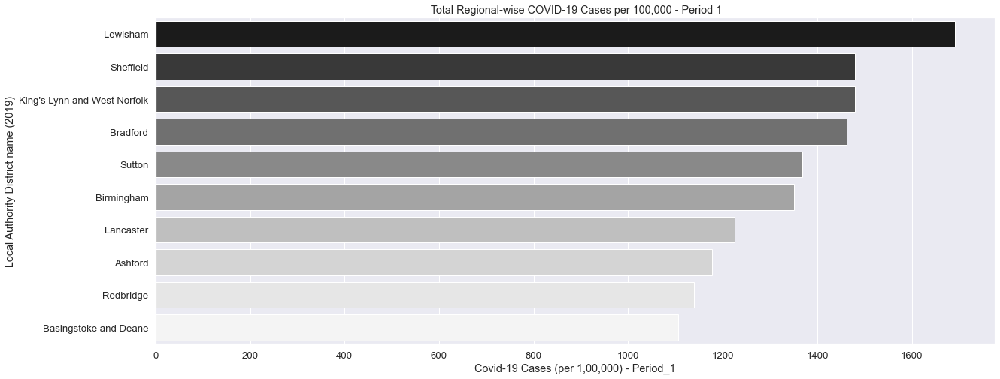

In [338]:
# Visualize the most infected regions in period 1 - Bar Graph

plt.figure(figsize=(20,8))
sns.barplot(x="Covid-19 Cases (per 1,00,000) - Period_1", y="Local Authority District name (2019)", data = sql_df_w1 ,
                 palette="Greys_r").set(title=' Total Regional-wise COVID-19 Cases per 100,000 - Period 1')
plt.show()

# Period 2 (July,20 - Oct,20)

In [339]:
#select the cases data for period 2

cases_period_2 = (df2['date'] > '2020-07-01') & (df2['date'] <= '2020-10-31')
cases_period_2 = df2.loc[cases_period_2]

In [340]:
#compute total cases per 100,000 people in period 2 

WAVE_2 = cases_period_2.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
WAVE_2 = WAVE_2.reset_index()
WAVE_2['Covid-19 Cases - Period_2'] = WAVE_2['newCasesBySpecimenDate']
WAVE_2['Covid-19 Cases (per 1,00,000) - Period_2'] = (WAVE_2['Covid-19 Cases - Period_2'] / merge['Estimated population mid-2020']) * 100000
WAVE_2 = WAVE_2.drop(['newCasesBySpecimenDate'], axis = 1)
WAVE_2

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Cases - Period_2,"Covid-19 Cases (per 1,00,000) - Period_2"
0,E06000001,Hartlepool,1778,1894.795175
1,E06000002,Middlesbrough,2675,1893.336164
2,E06000003,Redcar and Cleveland,1917,1396.945230
3,E06000004,Stockton-on-Tees,3833,1941.555777
4,E06000005,Darlington,1433,1334.239586
...,...,...,...,...
375,W06000020,Torfaen,772,NaN
376,W06000021,Monmouthshire,519,NaN
377,W06000022,Newport,1215,NaN
378,W06000023,Powys,617,NaN


In [341]:
# select the most infected regions in period 2

w2 = """
select * from WAVE_2
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Cases (per 1,00,000) - Period_2"
desc;
"""
pysqldf_w2 = lambda w2: sqldf(w2, globals())

sql_df_w2 = pysqldf_w2(w2)

sql_df_w2 = sql_df_w2.head(10)
sql_df_w2

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Cases - Period_2,"Covid-19 Cases (per 1,00,000) - Period_2"
0,E08000003,Manchester,21225,7693.032595
1,E08000035,Leeds,21488,6441.498020
2,E08000012,Liverpool,17564,6321.487443
3,E08000025,Birmingham,20553,5845.696148
4,E08000019,Sheffield,15218,5755.520845
5,E08000032,Bradford,15612,5585.368995
6,E08000010,Wigan,9371,4486.501238
7,E06000008,Blackburn with Darwen,5767,3843.897887
8,E06000018,Nottingham,12488,3704.560692
9,E07000120,Hyndburn,2276,3669.428949


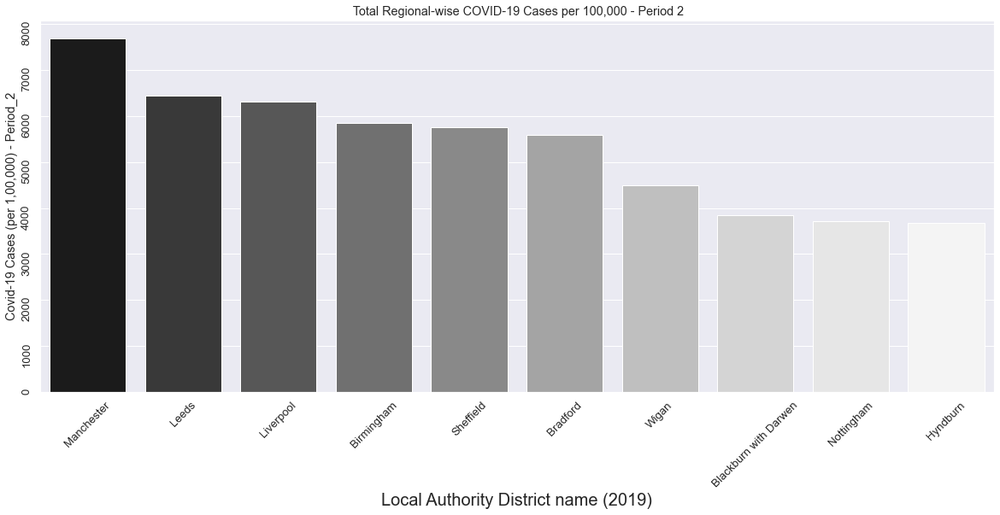

In [342]:
# Visualize the most infected regions in period 2 - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Date', fontsize=20)

sns.barplot(x="Local Authority District name (2019)", y="Covid-19 Cases (per 1,00,000) - Period_2", data = sql_df_w2 ,
                 palette="Greys_r").set(title=' Total Regional-wise COVID-19 Cases per 100,000 - Period 2')
plt.show()

# Period 3 (Nov,20 - Feb,21)

In [343]:
#select the cases data for period 3

cases_period_3 = (df2['date'] > '2020-11-01') & (df2['date'] <= '2021-02-28')
cases_period_3 = df2.loc[cases_period_3]

In [344]:
#compute total cases per 100,000 people in period 3 

WAVE_3 = cases_period_3.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
WAVE_3 = WAVE_3.reset_index()
WAVE_3['Covid-19 Cases - Period_3'] = WAVE_3['newCasesBySpecimenDate']
WAVE_3['Covid-19 Cases (per 1,00,000) - Period_3'] = (WAVE_3['Covid-19 Cases - Period_3'] / merge['Estimated population mid-2020']) * 100000
WAVE_3 = WAVE_3.drop(['newCasesBySpecimenDate'], axis = 1)
WAVE_3

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Cases - Period_3,"Covid-19 Cases (per 1,00,000) - Period_3"
0,E06000001,Hartlepool,5963,6354.703952
1,E06000002,Middlesbrough,8170,5782.637930
2,E06000003,Redcar and Cleveland,6218,4531.145247
3,E06000004,Stockton-on-Tees,9916,5022.819485
4,E06000005,Darlington,4843,4509.227016
...,...,...,...,...
375,W06000020,Torfaen,5161,NaN
376,W06000021,Monmouthshire,3183,NaN
377,W06000022,Newport,8760,NaN
378,W06000023,Powys,3020,NaN


In [345]:
# select the most infected regions in period 3

w3 = """
select * from WAVE_3
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Cases (per 1,00,000) - Period_3"
desc;
"""
pysqldf_w3 = lambda w3: sqldf(w3, globals())

sql_df_w3 = pysqldf_w3(w3)

sql_df_w3 = sql_df_w3.head(10)
sql_df_w3

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Cases - Period_3,"Covid-19 Cases (per 1,00,000) - Period_3"
0,E09000026,Redbridge,27725,28681.825706
1,E09000023,Lewisham,18292,25968.199886
2,E09000025,Newham,30252,25597.373587
3,E08000025,Birmingham,70771,20128.728754
4,E09000030,Tower Hamlets,24275,19151.722669
5,E09000029,Sutton,13403,18386.720626
6,E07000070,Chelmsford,10843,16579.257198
7,E09000009,Ealing,24802,15811.148511
8,E09000010,Enfield,25382,14168.648335
9,E09000028,Southwark,18446,13557.752380


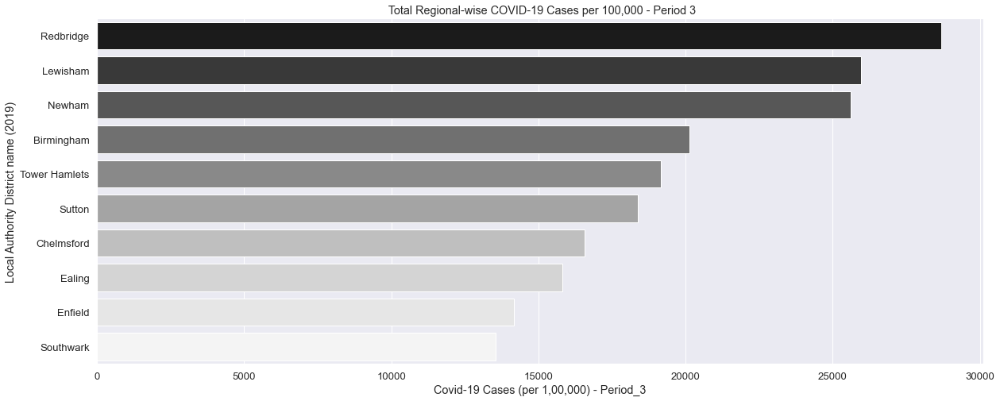

In [346]:
# Visualize the most infected regions in period 3 - Bar Graph

plt.figure(figsize=(20,8))
sns.barplot(x="Covid-19 Cases (per 1,00,000) - Period_3", y="Local Authority District name (2019)", data = sql_df_w3 ,
                 palette="Greys_r").set(title=' Total Regional-wise COVID-19 Cases per 100,000 - Period 3')
plt.show()


# Period 4 (Mar,21 - June,21)

In [347]:
#select the cases data for period 4

cases_period_4 = (df2['date'] > '2021-03-01') & (df2['date'] <= '2021-06-30')
cases_period_4 = df2.loc[cases_period_4]

In [348]:
#compute total cases per 100,000 people in period 4 

WAVE_4 = cases_period_4.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
WAVE_4 = WAVE_4.reset_index()
WAVE_4['Covid-19 Cases - Period_4'] = WAVE_4['newCasesBySpecimenDate']
WAVE_4['Covid-19 Cases (per 1,00,000) - Period_4'] = (WAVE_4['Covid-19 Cases - Period_4'] / merge['Estimated population mid-2020']) * 100000
WAVE_4 = WAVE_4.drop(['newCasesBySpecimenDate'], axis = 1)
WAVE_4

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Cases - Period_4,"Covid-19 Cases (per 1,00,000) - Period_4"
0,E06000001,Hartlepool,1147,1222.345369
1,E06000002,Middlesbrough,1544,1092.826556
2,E06000003,Redcar and Cleveland,1229,895.589821
3,E06000004,Stockton-on-Tees,2127,1077.403897
4,E06000005,Darlington,1453,1352.861213
...,...,...,...,...
375,W06000020,Torfaen,303,NaN
376,W06000021,Monmouthshire,262,NaN
377,W06000022,Newport,721,NaN
378,W06000023,Powys,361,NaN


In [349]:
# select the most infected regions in period 4

w4 = """
select * from WAVE_4
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Cases (per 1,00,000) - Period_4"
desc;
"""
pysqldf_w4 = lambda w4: sqldf(w4, globals())

sql_df_w4 = pysqldf_w4(w4)

sql_df_w4 = sql_df_w4.head(10)
sql_df_w4

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Cases - Period_4,"Covid-19 Cases (per 1,00,000) - Period_4"
0,E08000003,Manchester,14309,5186.318182
1,E08000035,Leeds,15208,4558.930654
2,E06000008,Blackburn with Darwen,6177,4117.176565
3,E07000120,Hyndburn,2520,4062.812369
4,E08000025,Birmingham,13670,3888.029307
5,E08000032,Bradford,9872,3531.819288
6,E08000010,Wigan,7170,3432.740783
7,E09000023,Lewisham,2096,2975.582056
8,E08000019,Sheffield,7580,2866.792483
9,E07000123,Preston,3259,2846.387647


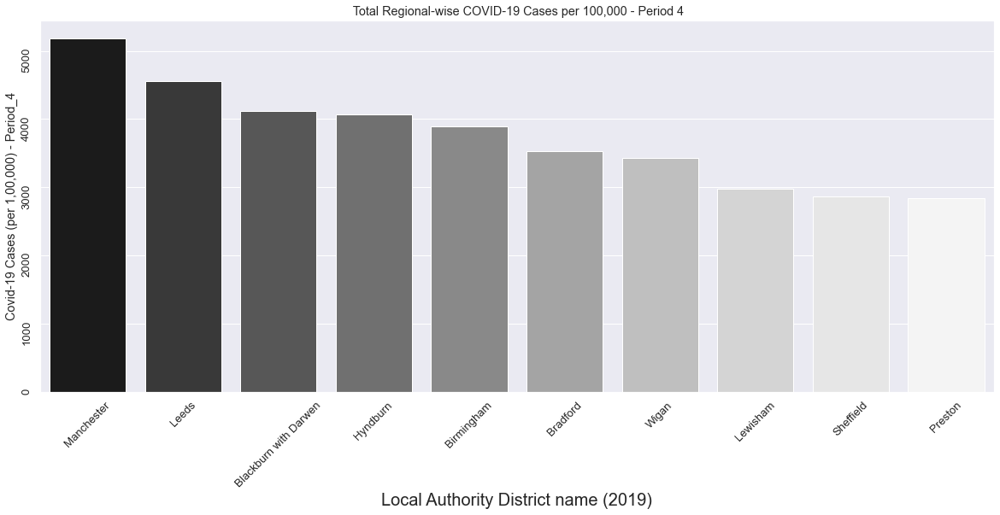

In [350]:
# Visualize the most infected regions in period 4 - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Date', fontsize=20)

sns.barplot(x="Local Authority District name (2019)", y="Covid-19 Cases (per 1,00,000) - Period_4", data = sql_df_w4 ,
                 palette="Greys_r").set(title=' Total Regional-wise COVID-19 Cases per 100,000 - Period 4')
plt.show()

# Total Deaths per 100,000 population (Region-wise)

In [351]:
#Total deaths per 100000

sql_df_Cases['Total Covid-19 Deaths (per 1,00,000)'] = (sql_df_Cases['newOnsDeathsByRegistrationDate'] / sql_df_Cases['Estimated population mid-2020']) * 100000
tot_deaths = sql_df_Cases.drop(['newOnsDeathsByRegistrationDate', 'newCasesBySpecimenDate', 'Total Covid-19 Cases (per 1,00,000)', 'Estimated population mid-2020'], axis = 1)
tot_deaths

,Local Authority District code (2019),Local Authority District name (2019),"Total Covid-19 Deaths (per 1,00,000)"
0,E06000001,Hartlepool,286.670361
1,E06000002,Middlesbrough,280.284531
2,E06000003,Redcar and Cleveland,243.390562
3,E06000004,Stockton-on-Tees,253.268429
4,E06000005,Darlington,257.909536
...,...,...,...
299,E09000029,Sutton,244.575291
300,E09000030,Tower Hamlets,156.339899
301,E09000031,Waltham Forest,210.876002
302,E09000032,Wandsworth,151.636921


In [352]:
#Concate the deaths data with geometry corrdinates for geospatial visualization

shp_death = pd.merge(tot_deaths, shp_1, on = ['Local Authority District code (2019)'])
shp_death = GeoDataFrame(shp_death)
shp_death

,Local Authority District code (2019),Local Authority District name (2019),"Total Covid-19 Deaths (per 1,00,000)",long,lat,geometry
0,E06000001,Hartlepool,286.670361,-1.27018,54.676140,"POLYGON ((-1.24099 54.72319, -1.17617 54.69769..."
1,E06000002,Middlesbrough,280.284531,-1.21099,54.544670,"POLYGON ((-1.20090 54.57764, -1.19056 54.57497..."
2,E06000003,Redcar and Cleveland,243.390562,-1.00608,54.567520,"POLYGON ((-1.19752 54.58211, -1.16019 54.60450..."
3,E06000004,Stockton-on-Tees,253.268429,-1.30664,54.556911,"POLYGON ((-1.19752 54.58211, -1.20090 54.57764..."
4,E06000005,Darlington,257.909536,-1.56835,54.535339,"POLYGON ((-1.69693 54.53601, -1.70527 54.54917..."
...,...,...,...,...,...,...
299,E09000029,Sutton,244.575291,-0.17227,51.357559,"POLYGON ((-0.23968 51.38929, -0.21811 51.38015..."
300,E09000030,Tower Hamlets,156.339899,-0.03643,51.515541,"POLYGON ((0.00919 51.50833, 0.00813 51.50810, ..."
301,E09000031,Waltham Forest,210.876002,-0.01881,51.594608,"POLYGON ((-0.01226 51.64623, 0.02272 51.64112,..."
302,E09000032,Wandsworth,151.636921,-0.20023,51.452400,"POLYGON ((-0.15121 51.46589, -0.14359 51.44184..."


In [353]:
#Select the regions with highest number of deaths per 100,000 people

top_deaths = """
select * from tot_deaths
order by "Total Covid-19 Deaths (per 1,00,000)" 
desc;
"""
pysqldf_top_deaths = lambda top_deaths: sqldf(top_deaths, globals())

sql_df_top_deaths = pysqldf_top_deaths(top_deaths)

top_ten_deaths = sql_df_top_deaths.head(10)
top_ten_deaths

,Local Authority District code (2019),Local Authority District name (2019),"Total Covid-19 Deaths (per 1,00,000)"
0,E07000076,Tendring,445.189443
1,E07000069,Castle Point,435.243692
2,E07000064,Rother,401.174573
3,E06000033,Southend-on-Sea,376.423213
4,E07000193,East Staffordshire,376.272504
5,E07000112,Folkestone and Hythe,374.161666
6,E07000114,Thanet,359.824117
7,E09000016,Havering,353.729700
8,E07000117,Burnley,349.212034
9,E07000061,Eastbourne,348.418567


In [354]:
#Concate the most infected regions' data with geometry corrdinates for geospatial visualization

shp_top_deaths = pd.merge(top_ten_deaths, shp_1, on = ['Local Authority District code (2019)'])
shp_top_deaths = GeoDataFrame(shp_top_deaths)
shp_top_deaths

,Local Authority District code (2019),Local Authority District name (2019),"Total Covid-19 Deaths (per 1,00,000)",long,lat,geometry
0,E07000076,Tendring,445.189443,1.108981,51.856739,"MULTIPOLYGON (((1.06186 51.94595, 1.11948 51.9..."
1,E07000069,Castle Point,435.243692,0.588084,51.561588,"MULTIPOLYGON (((0.63208 51.57053, 0.62579 51.5..."
2,E07000064,Rother,401.174573,0.542937,50.948711,"POLYGON ((0.39647 51.08310, 0.41827 51.06263, ..."
3,E06000033,Southend-on-Sea,376.423213,0.706923,51.549171,"MULTIPOLYGON (((0.82097 51.54092, 0.78210 51.5..."
4,E07000193,East Staffordshire,376.272504,-1.814380,52.836510,"POLYGON ((-2.04153 52.91748, -1.97112 52.94079..."
5,E07000112,Folkestone and Hythe,374.161666,1.000795,51.072128,"POLYGON ((1.00397 51.18005, 1.04958 51.18499, ..."
6,E07000114,Thanet,359.824117,1.328226,51.352520,"POLYGON ((1.44194 51.38717, 1.44591 51.35840, ..."
7,E09000016,Havering,353.729700,0.235368,51.565189,"POLYGON ((0.20031 51.62494, 0.22409 51.63174, ..."
8,E07000117,Burnley,349.212034,-2.230800,53.774059,"POLYGON ((-2.31321 53.81247, -2.30196 53.82108..."
9,E07000061,Eastbourne,348.418567,0.258516,50.773869,"POLYGON ((0.20997 50.73849, 0.21642 50.77472, ..."


In [355]:
#Visualize the Region's Total COVID-19 Deaths and highlighted the most infected regions 

#Create color grid
colormap_death = cm.linear.YlGnBu_09.to_step(data=shp_death['Total Covid-19 Deaths (per 1,00,000)'], method='quant', quantiles=[0,0.1,0.75,0.9,0.98,1])

#Locate the Regions
mymap_death = folium.Map(location=[y_map, x_map], zoom_start=6,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(mymap_death)
colormap_death.caption = "Total Covid-19 Cases (per 1,00,000)"
style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap_death(x['properties']['Total Covid-19 Deaths (per 1,00,000)']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL_death=folium.features.GeoJson(
        shp_death,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(fields=['Local Authority District name (2019)','Total Covid-19 Deaths (per 1,00,000)'],
            aliases=['Local Authority District name','Total Covid-19 Deaths (per 1,00,000)'],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
        )
    )
folium.Marker(
    radius=100,
    location=[51.856739, 1.108981],
    popup="Tendring",
    icon=folium.Icon(color="gray", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap_death)

folium.Marker(
    location=[51.561588, 0.588084],
    radius=50,
    popup="Castle Point",
    icon=folium.Icon(color="green", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap_death)
folium.Marker(
    radius=100,
    location=[50.948711, 0.542937],
    popup="Rother",
    icon=folium.Icon(color="lightblue", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap_death)

folium.Marker(
    location=[51.549171, 0.706923],
    radius=50,
    popup="Southend-on-Sea",
    icon=folium.Icon(color="black", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap_death)

folium.Marker(
    location=[52.836510, -1.814380],
    popup="East Staffordshire", 
    icon=folium.Icon(color="orange", icon="info-sign"),
).add_to(mymap_death)
folium.Marker(
    location=[51.072128, 1.000795],
    popup="Folkestone and Hythe",
    icon=folium.Icon(color="blue", icon="info-sign"),
).add_to(mymap_death)
folium.Marker(
    location=[51.352520, 1.328226],
    popup="Thanet",
    icon=folium.Icon(color="red", icon="info-sign"),
).add_to(mymap_death)
folium.Marker(
    location=[53.774059, -2.230800],
    popup="Burnley",
    icon=folium.Icon(color="white", icon="info-sign"),
).add_to(mymap_death)
folium.Marker(
    location=[51.565189, 0.235368],
    popup="Havering",
    icon=folium.Icon(color="lightgreen", icon="info-sign"),
).add_to(mymap_death)
folium.Marker(
    location=[50.773869, 0.258516],
    popup="Eastbourne",
    icon=folium.Icon(color="purple", icon="info-sign"),
).add_to(mymap_death)

colormap_death.add_to(mymap_death)
mymap_death.add_child(NIL_death)
mymap_death

Move Cursor on the regions on map to know the Total deaths

# Period 1 (Mar,20 - June,20)

In [356]:
#select the deaths data for period 1

death_period_1 = (death['date'] > '2020-03-01') & (death['date'] <= '2020-06-30')
death_period_1 = death.loc[death_period_1]
death_period_1

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newOnsDeathsByRegistrationDate
854,E06000003,Redcar and Cleveland,ltla,2020-06-26,3
855,E07000040,East Devon,ltla,2020-06-26,2
856,E07000090,Havant,ltla,2020-06-26,0
857,E07000214,Surrey Heath,ltla,2020-06-26,2
858,E07000229,Worthing,ltla,2020-06-26,0
...,...,...,...,...,...
24356,E07000084,Basingstoke and Deane,ltla,2020-03-27,3
24357,E07000176,Rushcliffe,ltla,2020-03-27,1
24358,E09000017,Hillingdon,ltla,2020-03-27,10
24359,E07000084,Basingstoke and Deane,ltla,2020-03-20,1


In [357]:
#compute total deaths per 100,000 people in period 1 

death_WAVE_1 = death_period_1.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
death_WAVE_1 = death_WAVE_1.reset_index()
death_WAVE_1['Covid-19 Deaths - Period_1'] = death_WAVE_1['newOnsDeathsByRegistrationDate']
death_WAVE_1['Covid-19 Deaths (per 1,00,000) - Period_1'] = (death_WAVE_1['Covid-19 Deaths - Period_1'] / merge['Estimated population mid-2020']) * 100000
death_WAVE_1 = death_WAVE_1.drop(['newOnsDeathsByRegistrationDate'], axis = 1)
death_WAVE_1

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_1,"Covid-19 Deaths (per 1,00,000) - Period_1"
0,E06000001,Hartlepool,108,115.094420
1,E06000002,Middlesbrough,204,144.389001
2,E06000003,Redcar and Cleveland,133,96.918996
3,E06000004,Stockton-on-Tees,143,72.434771
4,E06000005,Darlington,87,81.004078
...,...,...,...,...
321,W06000020,Torfaen,66,69.596761
322,W06000021,Monmouthshire,74,77.760498
323,W06000022,Newport,161,102.910251
324,W06000023,Powys,92,69.157333


In [358]:
# select the most infected regions in period 1

death_w1 = """
select * from death_WAVE_1
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Deaths (per 1,00,000) - Period_1"
desc;
"""
pysqldf_death_w1 = lambda death_w1: sqldf(death_w1, globals())

sql_df_death_w1 = pysqldf_death_w1(death_w1)

sql_df_death_w1 = sql_df_death_w1.head(10)
sql_df_death_w1

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_1,"Covid-19 Deaths (per 1,00,000) - Period_1"
0,E07000098,Hertsmere,177,167.818642
1,E09000015,Harrow,397,157.328662
2,E09000005,Brent,484,147.672180
3,E06000002,Middlesbrough,204,144.389001
4,E07000031,South Lakeland,148,141.080025
5,E07000072,Epping Forest,181,136.939663
6,E06000049,Cheshire East,521,134.741263
7,E07000038,North East Derbyshire,137,134.029897
8,E07000234,Bromsgrove,133,132.247512
9,E08000015,Wirral,422,130.111983


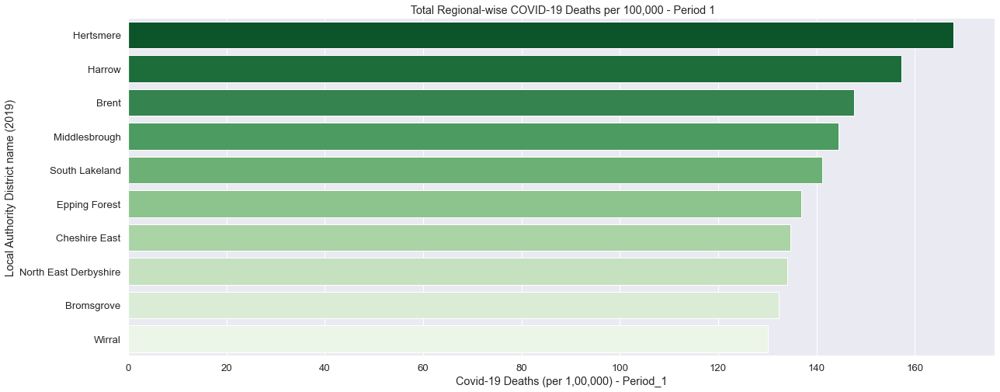

In [359]:
# Visualize the most infected regions in period 1 - Bar Graph

plt.figure(figsize=(20,8))
sns.barplot(x="Covid-19 Deaths (per 1,00,000) - Period_1", y="Local Authority District name (2019)", data = sql_df_death_w1 ,
                 palette="Greens_r").set(title=' Total Regional-wise COVID-19 Deaths per 100,000 - Period 1')
plt.show()

# Period 2 (July,20 - Oct,20)

In [360]:
#select the deaths data for period 2

death_period_2 = (death['date'] > '2020-07-01') & (death['date'] <= '2020-10-31')
death_period_2 = death.loc[death_period_2]
death_period_2

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newOnsDeathsByRegistrationDate
602,E06000003,Redcar and Cleveland,ltla,2020-10-30,15
603,E07000040,East Devon,ltla,2020-10-30,0
604,E07000090,Havant,ltla,2020-10-30,2
605,E07000214,Surrey Heath,ltla,2020-10-30,1
606,E07000229,Worthing,ltla,2020-10-30,1
...,...,...,...,...,...
24245,E07000071,Colchester,ltla,2020-07-03,1
24246,E07000084,Basingstoke and Deane,ltla,2020-07-03,0
24247,E07000116,Tunbridge Wells,ltla,2020-07-03,1
24248,E07000176,Rushcliffe,ltla,2020-07-03,3


In [361]:
#compute total deaths per 100,000 people in period 2 

death_WAVE_2 = death_period_2.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
death_WAVE_2 = death_WAVE_2.reset_index()
death_WAVE_2['Covid-19 Deaths - Period_2'] = death_WAVE_2['newOnsDeathsByRegistrationDate']
death_WAVE_2['Covid-19 Deaths (per 1,00,000) - Period_2'] = (death_WAVE_2['Covid-19 Deaths - Period_2'] / merge['Estimated population mid-2020']) * 100000
death_WAVE_2 = death_WAVE_2.drop(['newOnsDeathsByRegistrationDate'], axis = 1)
death_WAVE_2

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_2,"Covid-19 Deaths (per 1,00,000) - Period_2"
0,E06000001,Hartlepool,10,10.656891
1,E06000002,Middlesbrough,14,9.909049
2,E06000003,Redcar and Cleveland,27,19.675285
3,E06000004,Stockton-on-Tees,44,22.287622
4,E06000005,Darlington,27,25.139197
...,...,...,...,...
321,W06000020,Torfaen,11,11.599460
322,W06000021,Monmouthshire,6,6.304905
323,W06000022,Newport,14,8.948717
324,W06000023,Powys,6,4.510261


In [362]:
# select the most infected regions in period 2

death_w2 = """
select * from death_WAVE_2
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Deaths (per 1,00,000) - Period_2"
desc;
"""
pysqldf_death_w2 = lambda death_w2: sqldf(death_w2, globals())

sql_df_death_w2 = pysqldf_death_w2(death_w2)

sql_df_death_w2 = sql_df_death_w2.head(10)
sql_df_death_w2

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_2,"Covid-19 Deaths (per 1,00,000) - Period_2"
0,E08000008,Tameside,135,59.440729
1,E08000012,Liverpool,192,38.363631
2,E07000037,High Peak,34,36.703982
3,E07000105,Ashford,47,35.872933
4,E07000120,Hyndburn,29,35.743779
5,E08000014,Sefton,98,35.520245
6,E08000011,Knowsley,54,35.420985
7,E07000117,Burnley,31,34.697350
8,E08000024,Sunderland,86,30.952398
9,E07000119,Fylde,25,30.784007


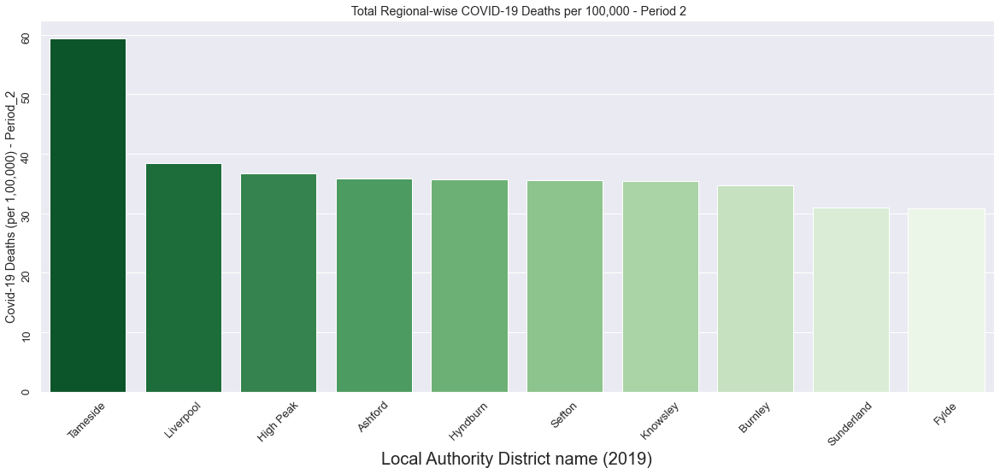

In [363]:
# Visualize the most infected regions in period 2 - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Date', fontsize=20)

sns.barplot(x="Local Authority District name (2019)", y="Covid-19 Deaths (per 1,00,000) - Period_2", data = sql_df_death_w2 ,
                 palette="Greens_r").set(title=' Total Regional-wise COVID-19 Deaths per 100,000 - Period 2')
plt.show()

# Period 3 (Nov,20 - Feb,21)

In [364]:
#select the deaths data for period 3

death_period_3 = (death['date'] > '2020-11-01') & (death['date'] <= '2021-02-28')
death_period_3 = death.loc[death_period_3]
death_period_3

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newOnsDeathsByRegistrationDate
364,E06000003,Redcar and Cleveland,ltla,2021-02-26,3
365,E07000040,East Devon,ltla,2021-02-26,0
366,E07000090,Havant,ltla,2021-02-26,2
367,E07000214,Surrey Heath,ltla,2021-02-26,6
368,E07000229,Worthing,ltla,2021-02-26,8
...,...,...,...,...,...
24101,E07000071,Colchester,ltla,2020-11-06,14
24102,E07000084,Basingstoke and Deane,ltla,2020-11-06,2
24103,E07000116,Tunbridge Wells,ltla,2020-11-06,0
24104,E07000176,Rushcliffe,ltla,2020-11-06,6


In [365]:
#compute total deaths per 100,000 people in period 3 

death_WAVE_3 = death_period_3.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
death_WAVE_3 = death_WAVE_3.reset_index()
death_WAVE_3['Covid-19 Deaths - Period_3'] = death_WAVE_3['newOnsDeathsByRegistrationDate']
death_WAVE_3['Covid-19 Deaths (per 1,00,000) - Period_3'] = (death_WAVE_3['Covid-19 Deaths - Period_3'] / merge['Estimated population mid-2020']) * 100000
death_WAVE_3 = death_WAVE_3.drop(['newOnsDeathsByRegistrationDate'], axis = 1)
death_WAVE_3

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_3,"Covid-19 Deaths (per 1,00,000) - Period_3"
0,E06000001,Hartlepool,144,153.459227
1,E06000002,Middlesbrough,151,106.876172
2,E06000003,Redcar and Cleveland,162,118.051710
3,E06000004,Stockton-on-Tees,293,148.415299
4,E06000005,Darlington,150,139.662204
...,...,...,...,...
321,W06000020,Torfaen,178,187.700354
322,W06000021,Monmouthshire,125,131.352192
323,W06000022,Newport,198,126.560433
324,W06000023,Powys,142,106.742840


In [366]:
# select the most infected regions in period 3

death_w3 = """
select * from death_WAVE_3
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Deaths (per 1,00,000) - Period_3"
desc;
"""
pysqldf_death_w3 = lambda death_w3: sqldf(death_w3, globals())

sql_df_death_w3 = pysqldf_death_w3(death_w3)

sql_df_death_w3 = sql_df_death_w3.head(10)
sql_df_death_w3

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_3,"Covid-19 Deaths (per 1,00,000) - Period_3"
0,E07000064,Rother,320,330.865627
1,E07000069,Castle Point,271,299.368123
2,E07000076,Tendring,428,290.458966
3,E07000062,Hastings,254,274.434384
4,E07000061,Eastbourne,262,253.571290
5,E06000033,Southend-on-Sea,424,231.981748
6,E07000117,Burnley,207,231.688754
7,E07000114,Thanet,320,226.215555
8,E09000016,Havering,585,224.438042
9,E07000112,Folkestone and Hythe,245,216.201906


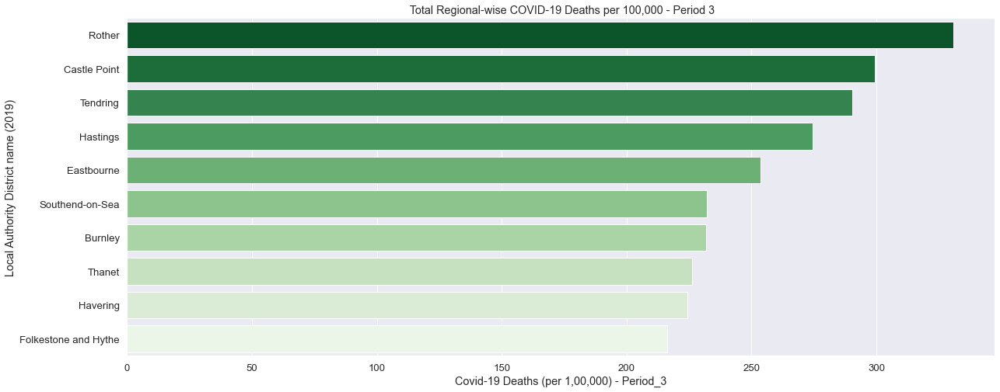

In [367]:
# Visualize the most infected regions in period 3 - Bar Graph

plt.figure(figsize=(20,8))
sns.barplot(x="Covid-19 Deaths (per 1,00,000) - Period_3", y="Local Authority District name (2019)", data = sql_df_death_w3 ,
                 palette="Greens_r").set(title=' Total Regional-wise COVID-19 Deaths per 100,000 - Period 3')
plt.show()

# Period 4 (Mar,21 - June,21)

In [368]:
#select the deaths data for period 4

death_period_4 = (death['date'] > '2021-03-01') & (death['date'] <= '2021-06-30')
death_period_4 = death.loc[death_period_4]
death_period_4

,Local Authority District code (2019),Local Authority District name (2019),areaType,date,newOnsDeathsByRegistrationDate
126,E06000003,Redcar and Cleveland,ltla,2021-06-25,0
127,E07000040,East Devon,ltla,2021-06-25,0
128,E07000090,Havant,ltla,2021-06-25,0
129,E07000214,Surrey Heath,ltla,2021-06-25,0
130,E07000229,Worthing,ltla,2021-06-25,0
...,...,...,...,...,...
23965,E07000071,Colchester,ltla,2021-03-05,13
23966,E07000084,Basingstoke and Deane,ltla,2021-03-05,7
23967,E07000116,Tunbridge Wells,ltla,2021-03-05,3
23968,E07000176,Rushcliffe,ltla,2021-03-05,8


In [369]:
#compute total deaths per 100,000 people in period 4 

death_WAVE_4 = death_period_4.groupby(['Local Authority District code (2019)', 'Local Authority District name (2019)']).sum()
death_WAVE_4 = death_WAVE_4.reset_index()
death_WAVE_4['Covid-19 Deaths - Period_4'] = death_WAVE_4['newOnsDeathsByRegistrationDate']
death_WAVE_4['Covid-19 Deaths (per 1,00,000) - Period_4'] = (death_WAVE_4['Covid-19 Deaths - Period_4'] / merge['Estimated population mid-2020']) * 100000
death_WAVE_4 = death_WAVE_4.drop(['newOnsDeathsByRegistrationDate'], axis = 1)
death_WAVE_4

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_4,"Covid-19 Deaths (per 1,00,000) - Period_4"
0,E06000001,Hartlepool,7,7.459824
1,E06000002,Middlesbrough,27,19.110309
2,E06000003,Redcar and Cleveland,12,8.744571
3,E06000004,Stockton-on-Tees,20,10.130737
4,E06000005,Darlington,13,12.104058
...,...,...,...,...
321,W06000020,Torfaen,5,5.272482
322,W06000021,Monmouthshire,10,10.508175
323,W06000022,Newport,15,9.587912
324,W06000023,Powys,29,21.799594


In [370]:
# select the most infected regions in period 4

death_w4 = """
select * from death_WAVE_4
where "Local Authority District code (2019)" LIKE 'E0%'
order by "Covid-19 Deaths (per 1,00,000) - Period_4"
desc;
"""
pysqldf_death_w4 = lambda death_w4: sqldf(death_w4, globals())

sql_df_death_w4 = pysqldf_death_w4(death_w4)

sql_df_death_w4 = sql_df_death_w4.head(10)
sql_df_death_w4

,Local Authority District code (2019),Local Authority District name (2019),Covid-19 Deaths - Period_4,"Covid-19 Deaths (per 1,00,000) - Period_4"
0,E07000075,Rochford,30,34.236023
1,E07000076,Tendring,48,32.574837
2,E07000108,Dover,38,32.063722
3,E06000033,Southend-on-Sea,52,28.450592
4,E08000002,Bury,54,28.315540
5,E07000033,Bolsover,23,28.288543
6,E07000112,Folkestone and Hythe,32,28.238616
7,E07000193,East Staffordshire,34,28.117066
8,E07000170,Ashfield,36,28.051147
9,E08000016,Barnsley,63,25.395955


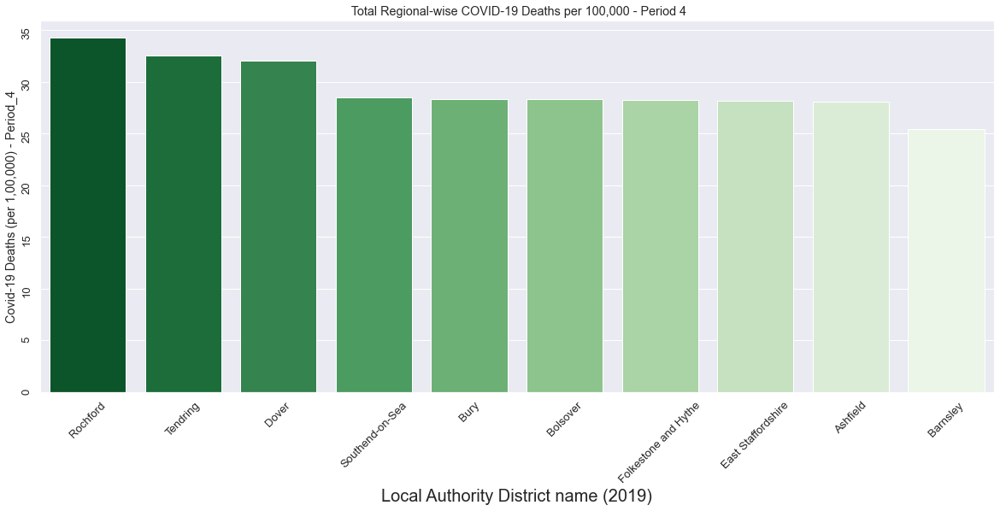

In [371]:
# Visualize the most infected regions in period 4 - Bar Graph

plt.figure(figsize=(20,8))
plt.xticks(rotation=45)
plt.yticks(rotation=90)
plt.xlabel('Date', fontsize=20)

sns.barplot(x="Local Authority District name (2019)", y="Covid-19 Deaths (per 1,00,000) - Period_4", data = sql_df_death_w4 ,
                 palette="Greens_r").set(title=' Total Regional-wise COVID-19 Deaths per 100,000 - Period 4')
plt.show()

# Final Data after data exploration and preprocessing

In [372]:
#concat cases and deaths data

df4 = pd.merge(WAVE_1, WAVE_2, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
df4 = pd.merge(df4,WAVE_3, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
df4 = pd.merge(df4,WAVE_4, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
df4 = pd.merge(df4,death_WAVE_1, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
df4 = pd.merge(df4,death_WAVE_2, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
df4 = pd.merge(df4,death_WAVE_3, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
df4 = pd.merge(df4,death_WAVE_4, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
#df4


In [373]:
#concat imd and cases/deaths data

df = pd.merge(df3,df4, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)' ])
#df

In [374]:
#Compute Cumulative furlough jobs per 100,000 population

cjrs['Cumulative number of employments on furlough (per 1,00,000)'] = (cjrs['Cumulative number of employments on furlough'] / merge['Estimated population mid-2020']) * 100000
cjrs = cjrs.drop(['Cumulative number of employments on furlough'], axis = 1)
cjrs

,Local Authority District code (2019),Local Authority District name (2019),"Cumulative number of employments on furlough (per 1,00,000)"
0,E06000047,County Durham UA,87066.797391
1,E06000005,Darlington UA,11820.079980
2,E06000001,Hartlepool UA,9619.028187
3,E06000002,Middlesbrough UA,9877.468734
4,E06000057,Northumberland UA,45529.878401
...,...,...,...
297,E07000083,Tewkesbury,7974.119440
298,E07000187,Mendip,6562.151386
299,E07000188,Sedgemoor,9628.948471
300,E07000246,Somerset West and Taunton,7500.700367


In [375]:
#concat imd, cases, deaths data with cjrs data

data = pd.merge(df,cjrs, on = ['Local Authority District code (2019)', 'Local Authority District name (2019)'])
#data

# Final Data Exploration

In [376]:
#check data features

data.columns

Index(['Local Authority District code (2019)',
       'Local Authority District name (2019)',
       'Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)',
       'Income Decile (where 1 is most deprived 10% of LSOAs)',
       'Employment Decile (where 1 is most deprived 10% of LSOAs)',
       'Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)',
       'Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)',
       'Crime Decile (where 1 is most deprived 10% of LSOAs)',
       'Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)',
       'Living Environment Decile (where 1 is most deprived 10% of LSOAs)',
       'Covid-19 Cases - Period_1', 'Covid-19 Cases (per 1,00,000) - Period_1',
       'Covid-19 Cases - Period_2', 'Covid-19 Cases (per 1,00,000) - Period_2',
       'Covid-19 Cases - Period_3', 'Covid-19 Cases (per 1,00,000) - Period_3',
       'Covid-19 Cases - Period_4

In [377]:
#check data overview

data.head()

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs),...,"Covid-19 Cases (per 1,00,000) - Period_4",Covid-19 Deaths - Period_1,"Covid-19 Deaths (per 1,00,000) - Period_1",Covid-19 Deaths - Period_2,"Covid-19 Deaths (per 1,00,000) - Period_2",Covid-19 Deaths - Period_3,"Covid-19 Deaths (per 1,00,000) - Period_3",Covid-19 Deaths - Period_4,"Covid-19 Deaths (per 1,00,000) - Period_4","Cumulative number of employments on furlough (per 1,00,000)"
0,E07000008,Cambridge,6.608696,6.855072,7.043478,7.449275,6.753623,4.710145,4.855072,4.028986,...,732.735047,81,64.767357,2,1.599194,45,35.981865,6,4.797582,31922.097185
1,E07000009,East Cambridgeshire,7.500000,7.340000,7.700000,5.940000,8.780000,8.380000,4.100000,6.800000,...,346.515931,50,55.449585,2,2.217983,55,60.994544,3,3.326975,19879.045806
2,E07000010,Fenland,4.145455,4.309091,4.236364,2.818182,3.381818,5.745455,4.800000,6.600000,...,1231.903606,79,77.390282,4,3.918495,136,133.228840,18,17.633229,13323.011000
3,E07000011,Huntingdonshire,7.352381,7.323810,7.352381,5.780952,7.733333,7.114286,5.028571,6.628571,...,915.004976,124,69.279549,15,8.380591,125,69.838255,36,20.113417,26376.467300
4,E07000012,South Cambridgeshire,8.427083,8.250000,8.333333,8.395833,9.093750,7.718750,4.697917,7.197917,...,1164.004056,60,37.289315,1,0.621489,123,76.443097,21,13.051260,21049.466246


In [378]:
#check data sample size

data.shape

(247, 27)

In [379]:
#delete the redundant features

data = data.drop(['Covid-19 Cases - Period_1', 'Covid-19 Cases - Period_2', 
           'Covid-19 Cases - Period_3', 'Covid-19 Cases - Period_4',
           'Covid-19 Deaths - Period_1', 'Covid-19 Deaths - Period_2', 
           'Covid-19 Deaths - Period_3', 'Covid-19 Deaths - Period_4'], axis = 1)

In [380]:
#check column's datatype

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 247 entries, 0 to 246
Data columns (total 19 columns):
 #   Column                                                                              Non-Null Count  Dtype  
---  ------                                                                              --------------  -----  
 0   Local Authority District code (2019)                                                247 non-null    object 
 1   Local Authority District name (2019)                                                247 non-null    object 
 2   Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)  247 non-null    float64
 3   Income Decile (where 1 is most deprived 10% of LSOAs)                               247 non-null    float64
 4   Employment Decile (where 1 is most deprived 10% of LSOAs)                           247 non-null    float64
 5   Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)       247 non-null   

In [381]:
#check outliers

data.describe()

,Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs),"Covid-19 Cases (per 1,00,000) - Period_1","Covid-19 Cases (per 1,00,000) - Period_2","Covid-19 Cases (per 1,00,000) - Period_3","Covid-19 Cases (per 1,00,000) - Period_4","Covid-19 Deaths (per 1,00,000) - Period_1","Covid-19 Deaths (per 1,00,000) - Period_2","Covid-19 Deaths (per 1,00,000) - Period_3","Covid-19 Deaths (per 1,00,000) - Period_4","Cumulative number of employments on furlough (per 1,00,000)"
count,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000
mean,5.943271,5.918115,5.875805,5.681312,6.028149,6.093152,5.518803,5.723006,446.713564,1076.452513,5325.515341,935.400259,81.712191,10.201321,131.930822,13.159742,21861.819002
std,1.547577,1.412777,1.520253,1.447749,2.056682,1.762361,1.653418,1.635337,289.234612,1138.537438,3966.422181,767.822977,27.832433,9.142350,47.611177,6.015472,20373.081378
min,2.542553,2.844086,2.469388,2.722222,1.642857,1.762411,1.000000,1.752809,48.297513,116.879981,744.747645,103.645403,9.724053,0.000000,32.063272,0.000000,1209.969093
25%,4.672241,4.793482,4.764703,4.520762,4.437102,4.717799,4.536904,4.683333,235.463662,395.809860,2844.667050,456.062255,63.850777,3.455121,96.790877,8.671060,8528.363829
50%,5.987578,5.973333,5.908451,5.690476,6.140625,6.133333,5.500000,5.928571,372.180620,666.269634,4315.110256,705.558163,80.456544,7.561489,128.721407,12.965404,14868.791428
75%,7.209105,7.012195,7.132358,6.727241,7.701777,7.506250,6.638379,6.937976,569.110695,1269.365339,6548.521059,1157.557941,102.079464,13.718667,161.431509,16.689311,27578.252389
max,9.385965,9.000000,9.122807,9.234783,9.789474,9.500000,9.265306,9.629630,1690.800681,7693.032595,28681.825706,5186.318182,167.818642,59.440729,330.865627,34.236023,138225.282022


# Correlation Analysis

[Text(0.5, 1.0, ' Correlation between the Variables')]

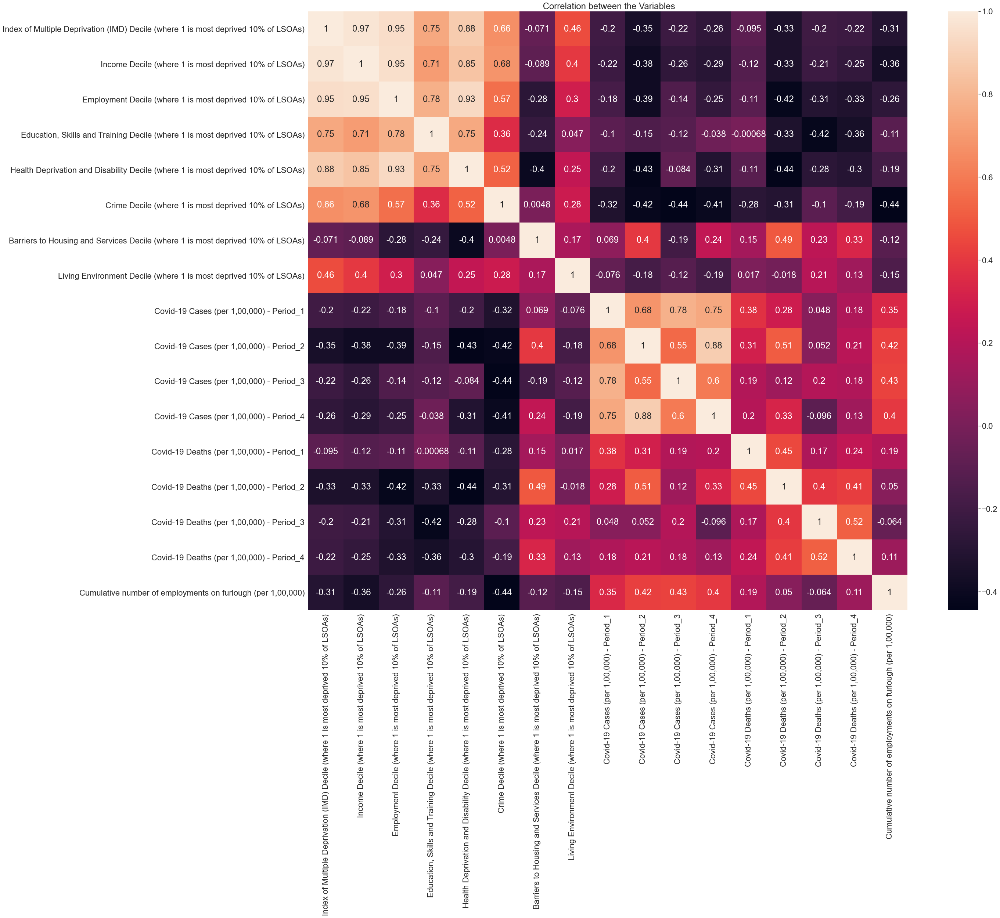

In [382]:
#visualize the spearman correlation among the variables through heatmap

corr_mat=data.corr(method='spearman')
plt.figure(figsize=(40,30))
sns.set(font_scale = 2.0)
sns.heatmap(corr_mat,vmax=1,square=True,annot=True).set(title=' Correlation between the Variables')

Correlation between independent variables with the target class

The correlation between income decile and Cumulative number of employments on furlough is: -0.3647712547250903


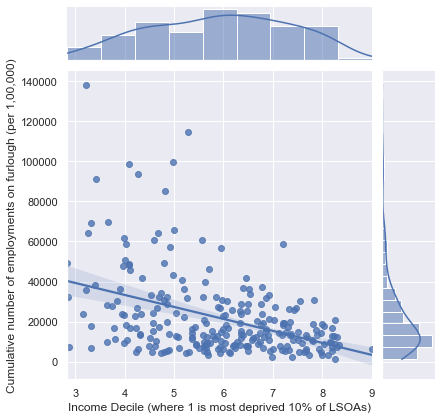

In [383]:
#visualize the spearman correlation between income and furlough jobs variable through jointplot

print('The correlation between income decile and Cumulative number of employments on furlough is: {}'.format(data['Income Decile (where 1 is most deprived 10% of LSOAs)'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Income Decile (where 1 is most deprived 10% of LSOAs)', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg')

The correlation between Employment decile and Cumulative number of employments on furlough is: -0.26419647743609165


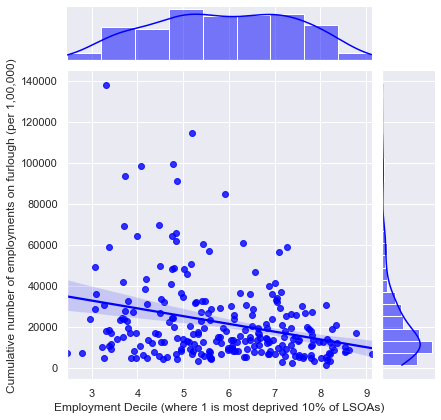

In [384]:
#visualize the spearman correlation between Employment and furlough jobs variable through jointplot

print('The correlation between Employment decile and Cumulative number of employments on furlough is: {}'.format(data['Employment Decile (where 1 is most deprived 10% of LSOAs)'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Employment Decile (where 1 is most deprived 10% of LSOAs)', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'blue')

The correlation between Education decile and Cumulative number of employments on furlough is: -0.11000183356963325


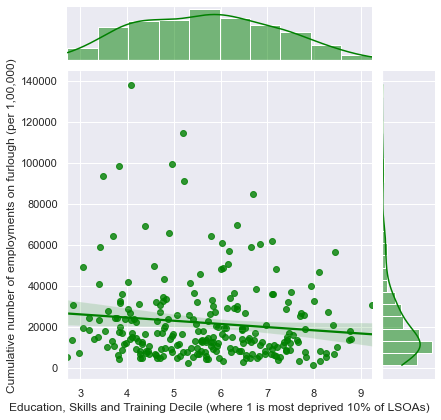

In [385]:
#visualize the spearman correlation between Education and furlough jobs variable through jointplot

print('The correlation between Education decile and Cumulative number of employments on furlough is: {}'.format(data['Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'green')

The correlation between Health decile and Cumulative number of employments on furlough is: -0.19025181241849776


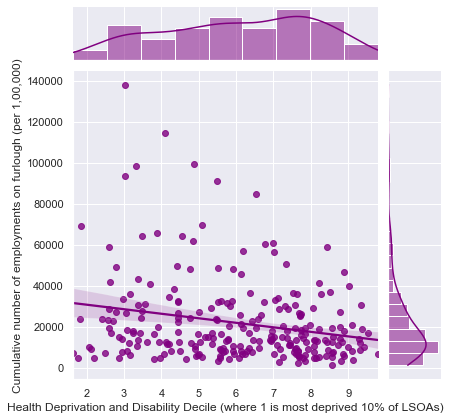

In [386]:
#visualize the spearman correlation between Health and furlough jobs variable through jointplot

print('The correlation between Health decile and Cumulative number of employments on furlough is: {}'.format(data['Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'purple')

The correlation between Crime decile and Cumulative number of employments on furlough is: -0.44195548420456365


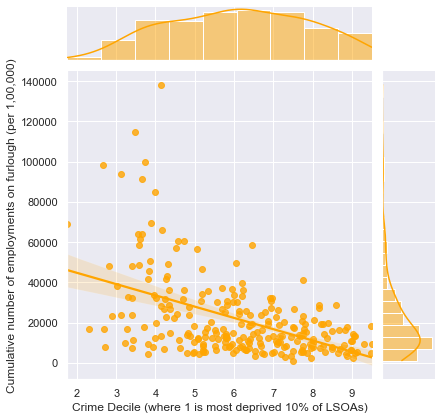

In [387]:
#visualize the spearman correlation between Crime and furlough jobs variable through jointplot

print('The correlation between Crime decile and Cumulative number of employments on furlough is: {}'.format(data['Crime Decile (where 1 is most deprived 10% of LSOAs)'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Crime Decile (where 1 is most deprived 10% of LSOAs)', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'orange')

The correlation between Housing decile and Cumulative number of employments on furlough is: -0.11504593384223945


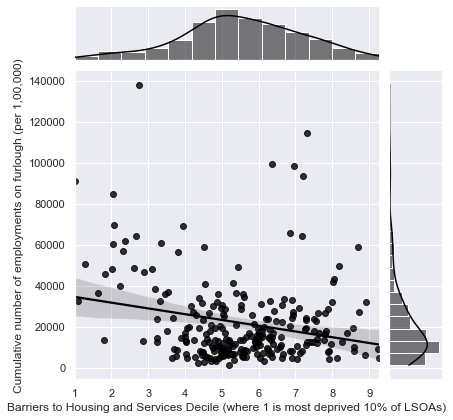

In [388]:
#visualize the spearman correlation between Housing and furlough jobs variable through jointplot

print('The correlation between Housing decile and Cumulative number of employments on furlough is: {}'.format(data['Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'black')


The correlation between Living Environment decile and Cumulative number of employments on furlough is: -0.1476164889073283


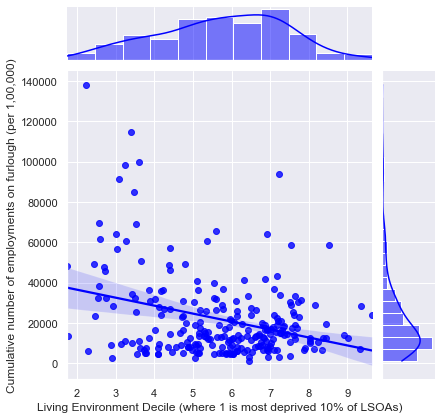

In [389]:
#visualize the spearman correlation between Living Environment and furlough jobs variable through jointplot

print('The correlation between Living Environment decile and Cumulative number of employments on furlough is: {}'.format(data['Living Environment Decile (where 1 is most deprived 10% of LSOAs)'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Living Environment Decile (where 1 is most deprived 10% of LSOAs)', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'blue')

The correlation between Covid-19 Cases (per 1,00,000) - Period_1 and Cumulative number of employments on furlough is: 0.34540130663158525


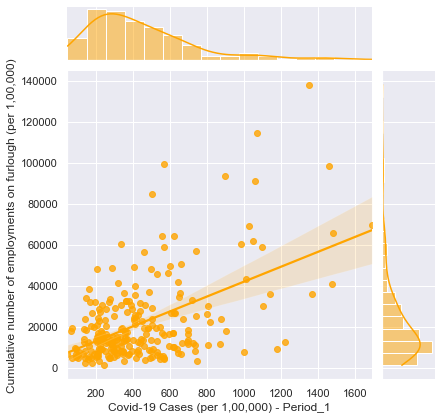

In [390]:
#visualize the spearman correlation between LCovid-19 Cases (per 1,00,000) - Period_1 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Cases (per 1,00,000) - Period_1 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Cases (per 1,00,000) - Period_1'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Cases (per 1,00,000) - Period_1', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'orange')

The correlation between Covid-19 Cases (per 1,00,000) - Period_2 and Cumulative number of employments on furlough is: 0.422968621092767


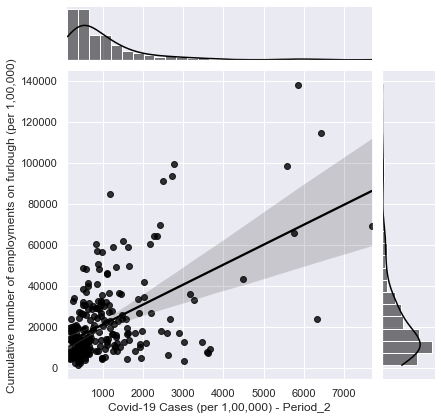

In [391]:
#visualize the spearman correlation between LCovid-19 Cases (per 1,00,000) - Period_2 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Cases (per 1,00,000) - Period_2 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Cases (per 1,00,000) - Period_2'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))

sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Cases (per 1,00,000) - Period_2', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'black')

The correlation between Covid-19 Cases (per 1,00,000) - Period_3 and Cumulative number of employments on furlough is: 0.43470664496379846


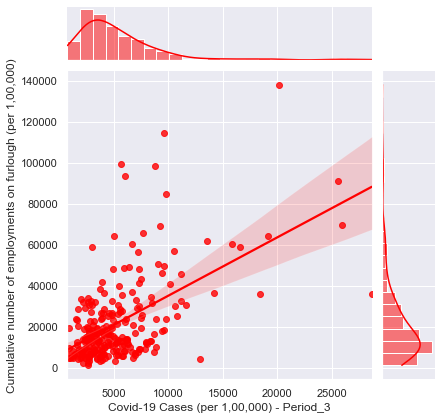

In [392]:
#visualize the spearman correlation between LCovid-19 Cases (per 1,00,000) - Period_3 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Cases (per 1,00,000) - Period_3 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Cases (per 1,00,000) - Period_3'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Cases (per 1,00,000) - Period_3', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'red')

The correlation between Covid-19 Cases (per 1,00,000) - Period_4 and Cumulative number of employments on furlough is: 0.39951646349426795


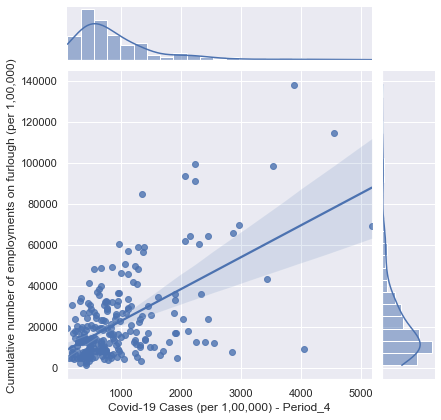

In [393]:
#visualize the spearman correlation between LCovid-19 Cases (per 1,00,000) - Period_4 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Cases (per 1,00,000) - Period_4 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Cases (per 1,00,000) - Period_4'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Cases (per 1,00,000) - Period_4', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg')

The correlation between Covid-19 Deaths (per 1,00,000) - Period_1 and Cumulative number of employments on furlough is: 0.18858003357361508


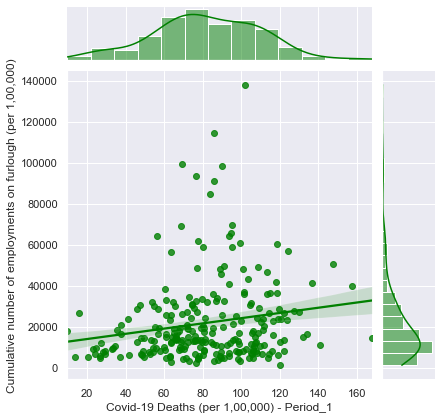

In [394]:
#visualize the spearman correlation between Covid-19 Deaths (per 1,00,000) - Period_1 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Deaths (per 1,00,000) - Period_1 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Deaths (per 1,00,000) - Period_1'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Deaths (per 1,00,000) - Period_1', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'green')


The correlation between Covid-19 Deaths (per 1,00,000) - Period_2 and Cumulative number of employments on furlough is: 0.04973868060621888


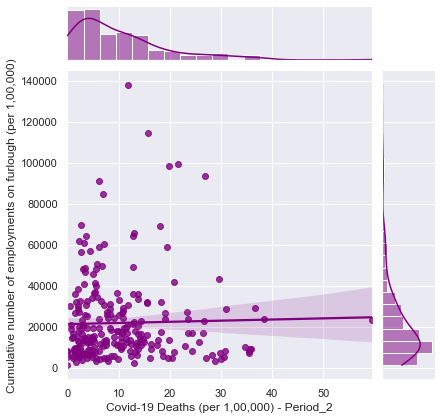

In [395]:
#visualize the spearman correlation between Covid-19 Deaths (per 1,00,000) - Period_2 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Deaths (per 1,00,000) - Period_2 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Deaths (per 1,00,000) - Period_2'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Deaths (per 1,00,000) - Period_2', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'purple')


The correlation between Covid-19 Deaths (per 1,00,000) - Period_3 and Cumulative number of employments on furlough is: -0.06375801514316566


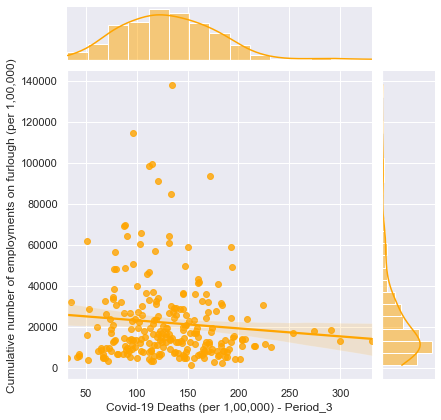

In [396]:
#visualize the spearman correlation between Covid-19 Deaths (per 1,00,000) - Period_3 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Deaths (per 1,00,000) - Period_3 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Deaths (per 1,00,000) - Period_3'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Deaths (per 1,00,000) - Period_3', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'orange')


The correlation between Covid-19 Deaths (per 1,00,000) - Period_4 and Cumulative number of employments on furlough is: 0.1144469500343543


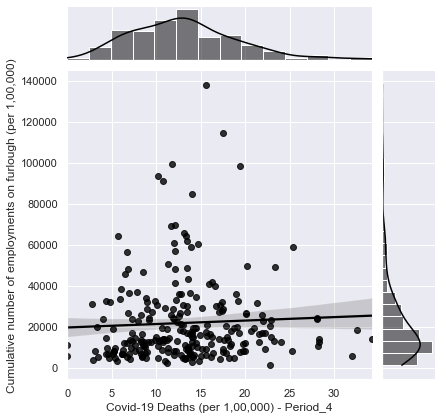

In [397]:
#visualize the spearman correlation between Covid-19 Deaths (per 1,00,000) - Period_4 and furlough jobs variable through jointplot

print('The correlation between Covid-19 Deaths (per 1,00,000) - Period_4 and Cumulative number of employments on furlough is: {}'.format(data['Covid-19 Deaths (per 1,00,000) - Period_4'].corr(data['Cumulative number of employments on furlough (per 1,00,000)'], method="spearman")))
sns.set(font_scale = 1.0)
sns.jointplot(x = 'Covid-19 Deaths (per 1,00,000) - Period_4', y = 'Cumulative number of employments on furlough (per 1,00,000)', data = data, kind = 'reg', color = 'black')


In [398]:
#Create input and output features

dependent = data["Cumulative number of employments on furlough (per 1,00,000)"]

independent = data[[ 'Income Decile (where 1 is most deprived 10% of LSOAs)',
       'Employment Decile (where 1 is most deprived 10% of LSOAs)',
       'Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)',
       'Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)',
       'Crime Decile (where 1 is most deprived 10% of LSOAs)',
       'Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)',
       'Living Environment Decile (where 1 is most deprived 10% of LSOAs)',
       'Covid-19 Cases (per 1,00,000) - Period_1',
       'Covid-19 Cases (per 1,00,000) - Period_2',
       'Covid-19 Cases (per 1,00,000) - Period_3',
       'Covid-19 Cases (per 1,00,000) - Period_4',
       'Covid-19 Deaths (per 1,00,000) - Period_1',
       'Covid-19 Deaths (per 1,00,000) - Period_2',
       'Covid-19 Deaths (per 1,00,000) - Period_3',
       'Covid-19 Deaths (per 1,00,000) - Period_4']]

In [399]:
#Check skewness in data

skew_dep = dependent.skew()
skew_indep = independent.skew()

print(skew_dep)
print(skew_indep)

2.41176322556102
Income Decile (where 1 is most deprived 10% of LSOAs)                              -0.128777
Employment Decile (where 1 is most deprived 10% of LSOAs)                          -0.080060
Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)       0.121286
Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs)   -0.247706
Crime Decile (where 1 is most deprived 10% of LSOAs)                               -0.069314
Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs)    -0.214807
Living Environment Decile (where 1 is most deprived 10% of LSOAs)                  -0.252118
Covid-19 Cases (per 1,00,000) - Period_1                                            1.551601
Covid-19 Cases (per 1,00,000) - Period_2                                            2.874048
Covid-19 Cases (per 1,00,000) - Period_3                                            2.757151
Covid-19 Cases (per 1,00,000) - Period_4             

/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:title={'center':'Skewed - y'}, xlabel='Cumulative number of employments on furlough (per 1,00,000)', ylabel='Density'>

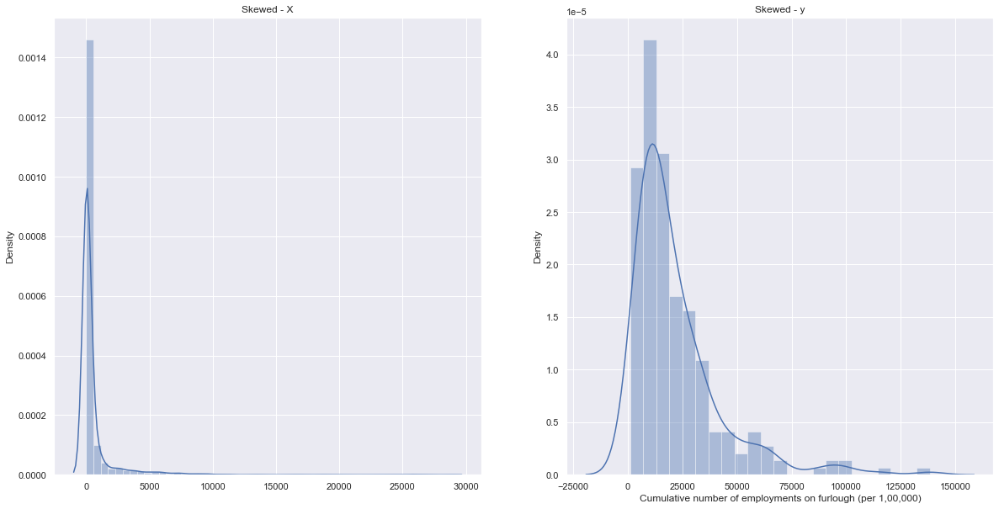

In [400]:
#Visualize the data skewness

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
ax1.set_title('Skewed - X')
sns.distplot(independent, ax = ax1)
ax2.set_title('Skewed - y')
sns.distplot(dependent, ax = ax2)

In [401]:
#Remove Skewness from data

X = np.log(independent+1)
y = np.log(dependent+1)

#skew(X)
#y

/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:title={'center':'Without Skewed - y'}, xlabel='Cumulative number of employments on furlough (per 1,00,000)', ylabel='Density'>

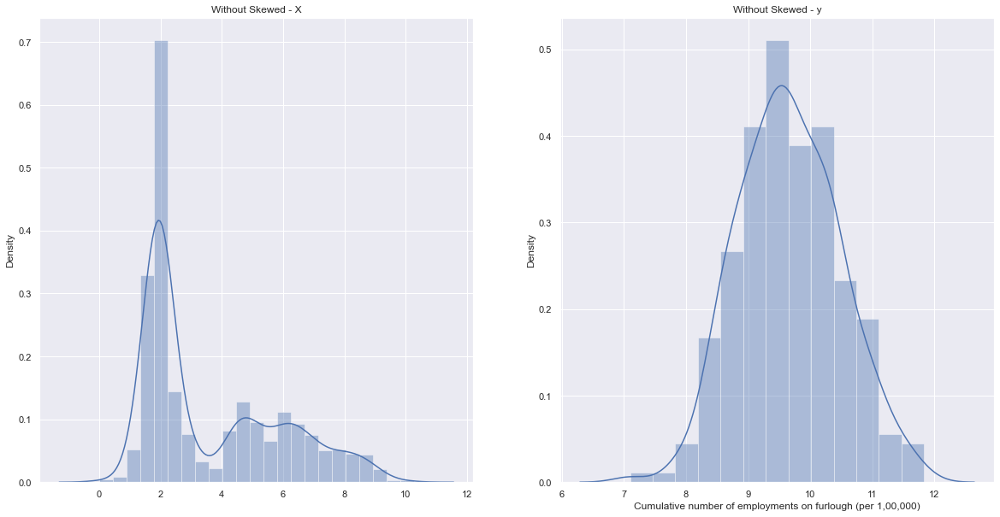

In [402]:
#visualize the removed skewness

fig, (a, b) = plt.subplots(ncols=2, figsize=(20, 10))
a.set_title('Without Skewed - X')
sns.distplot(X, ax = a)
b.set_title('Without Skewed - y')
sns.distplot(y, ax = b)

# Predictive Analysis

# Data Modelling 

In [403]:
#Splitting data into training and testing data

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.21, random_state=42, shuffle=True)

#K-fold Cross_validation
kf = KFold(n_splits=3, shuffle=True, random_state=42)

Ridge Regression Algorithm

In [404]:
#fitting the model in the data via pipeline

pipeline_ridge = make_pipeline(StandardScaler(), Ridge(alpha=1.0))
pipeline_ridge.fit(X_train, y_train)
pipeline_ridge.score(X_test, y_test)

y_predict_ridge = pipeline_ridge.predict(X_train)
Y_tests_ridge = pipeline_ridge.predict(X_test)

#check the performance of model
print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_ridge)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_ridge)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_ridge)))
print("Test Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_ridge)))

Mean Absolute Error (MAE)         : 0.4946300912431585
Mean Squared Error (MSE) : 0.402703084029266
Root Mean Squared Error (RMSE) : 0.6345889094754699
Test Accuracy (R2) : 0.5079085318616761


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Ridge Regression')

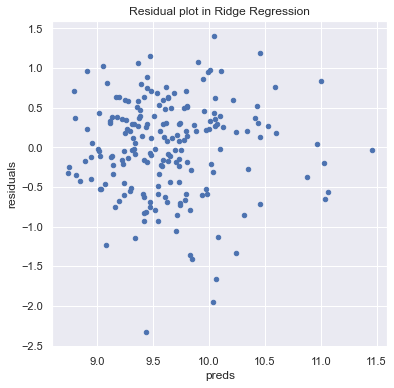

In [405]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds = pd.DataFrame({"preds":pipeline_ridge.predict(X_train), "true":y_train})
preds["residuals"] = preds["true"] - preds["preds"]
preds.plot(x = "preds", y = "residuals",kind = "scatter")
plt.title("Residual plot in Ridge Regression")

Linear Regression Algorithm

In [406]:
#fitting the model in the data via pipeline

pipeline_lr = make_pipeline(StandardScaler(), LinearRegression())
pipeline_lr.fit(X_train, y_train)
pipeline_lr.score(X_test, y_test)

y_predict_lr = pipeline_lr.predict(X_train)
Y_tests_lr = pipeline_lr.predict(X_test)

#check the performance of model
print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_lr)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_lr)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_lr)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_lr)))

Mean Absolute Error (MAE)         : 0.49499443239449303
Mean Squared Error (MSE) : 0.40222700751440726
Root Mean Squared Error (RMSE) : 0.6342136923107284
Testing Accuracy (R2) : 0.5084902835304217


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Linear Regression')

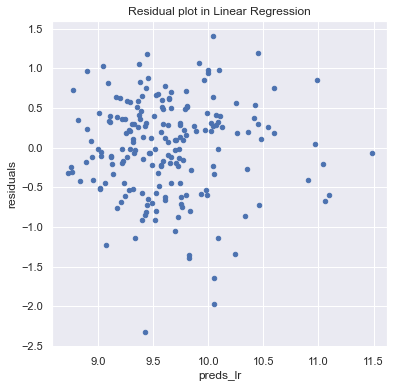

In [407]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds_lr = pd.DataFrame({"preds_lr":pipeline_lr.predict(X_train), "true_lr":y_train})
preds_lr["residuals"] = preds_lr["true_lr"] - preds_lr["preds_lr"]
preds_lr.plot(x = "preds_lr", y = "residuals",kind = "scatter")
plt.title("Residual plot in Linear Regression")

Decision tree Regression Algorithm

In [408]:
#fitting the model in the data via pipeline

pipeline_dt = make_pipeline(StandardScaler(), DecisionTreeRegressor(max_depth=1))
pipeline_dt.fit(X_train, y_train)

pipeline_dt.score(X_test, y_test)

y_predict_dt = pipeline_dt.predict(X_train)
Y_tests_dt = pipeline_dt.predict(X_test)

#check the performance of model
print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_dt)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_dt)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_dt)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_dt)))


Mean Absolute Error (MAE)         : 0.7155446475188741
Mean Squared Error (MSE) : 0.7618263480197658
Root Mean Squared Error (RMSE) : 0.8728266425927693
Testing Accuracy (R2) : 0.06907033759825976


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Decision Tree Regression')

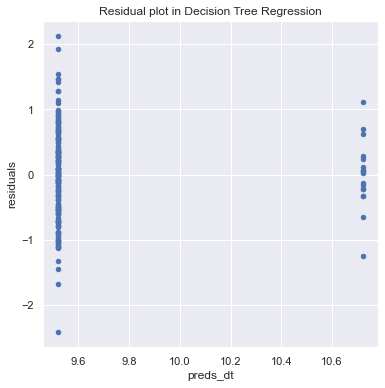

In [409]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds_dt = pd.DataFrame({"preds_dt":pipeline_dt.predict(X_train), "true_dt":y_train})
preds_dt["residuals"] = preds_dt["true_dt"] - preds_dt["preds_dt"]
preds_dt.plot(x = "preds_dt", y = "residuals",kind = "scatter")
plt.title("Residual plot in Decision Tree Regression")

Support Vector Regression Algorithm

In [410]:
#fitting the model in the data via pipeline

pipeline_svr = make_pipeline(StandardScaler(),SVR())
pipeline_svr.fit(X_train, y_train)

pipeline_svr.score(X_test, y_test)

y_predict_svr = pipeline_svr.predict(X_train)
Y_tests_svr = pipeline_svr.predict(X_test)

#check the performance of model
print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_svr)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_svr)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_svr)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_svr)))

Mean Absolute Error (MAE)         : 0.5347961024087124
Mean Squared Error (MSE) : 0.4686605288026965
Root Mean Squared Error (RMSE) : 0.6845878532392292
Testing Accuracy (R2) : 0.427310450743303


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Support Vector Regression')

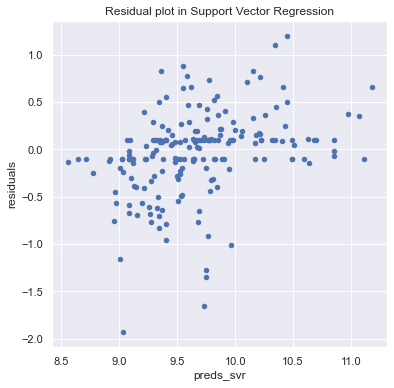

In [411]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds_svr = pd.DataFrame({"preds_svr":pipeline_svr.predict(X_train), "true_svr":y_train})
preds_svr["residuals"] = preds_svr["true_svr"] - preds_svr["preds_svr"]
preds_svr.plot(x = "preds_svr", y = "residuals",kind = "scatter")
plt.title("Residual plot in Support Vector Regression")

KNeighbor Regression Algorithm

In [412]:
#fitting the model in the data via pipeline

pipeline_knn = make_pipeline(StandardScaler(), KNeighborsRegressor(n_neighbors=5))
pipeline_knn.fit(X_train, y_train)

pipeline_knn.score(X_test, y_test)

y_predict_knn = pipeline_knn.predict(X_train)
Y_tests_knn = pipeline_knn.predict(X_test)

#check the performance of model
print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_knn)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_knn)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_knn)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_knn)))


Mean Absolute Error (MAE)         : 0.5523452244901615
Mean Squared Error (MSE) : 0.5133583014937243
Root Mean Squared Error (RMSE) : 0.7164902661542055
Testing Accuracy (R2) : 0.3726910712094663


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Knn Regression')

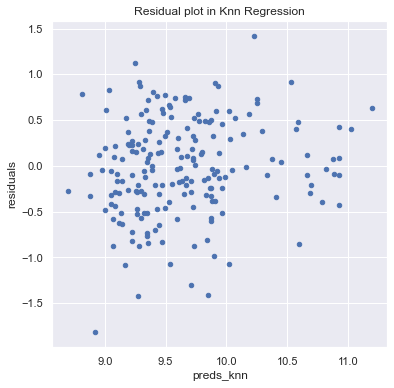

In [413]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds_knn = pd.DataFrame({"preds_knn":pipeline_knn.predict(X_train), "true_knn":y_train})
preds_knn["residuals"] = preds_knn["true_knn"] - preds_knn["preds_knn"]
preds_knn.plot(x = "preds_knn", y = "residuals",kind = "scatter")
plt.title("Residual plot in Knn Regression")

Lasso Regression Algorithm

In [414]:
#fitting the model in the data via pipeline

pipeline_lasso = make_pipeline(StandardScaler(), Lasso(alpha=0.1))
pipeline_lasso.fit(X_train, y_train)

pipeline_lasso.score(X_test, y_test)

y_predict_lasso = pipeline_lasso.predict(X_train)
Y_tests_lasso = pipeline_lasso.predict(X_test)

#check the performance of model
print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_lasso)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_lasso)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_lasso)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_lasso)))


Mean Absolute Error (MAE)         : 0.5879524882342941
Mean Squared Error (MSE) : 0.49320298841026805
Root Mean Squared Error (RMSE) : 0.7022841222826186
Testing Accuracy (R2) : 0.39732027818446136


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Lasso Regression')

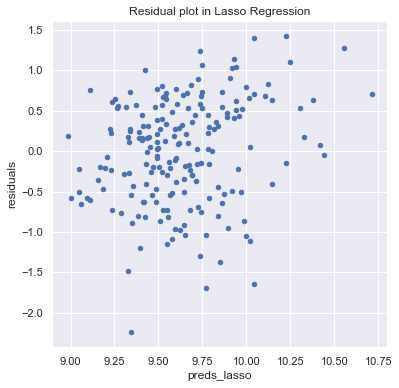

In [415]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds_lasso = pd.DataFrame({"preds_lasso":pipeline_lasso.predict(X_train), "true_lasso":y_train})
preds_lasso["residuals"] = preds_lasso["true_lasso"] - preds_lasso["preds_lasso"]
preds_lasso.plot(x = "preds_lasso", y = "residuals",kind = "scatter")
plt.title("Residual plot in Lasso Regression")

Random Forest Regression Algorithm

In [416]:
#fitting the model in the data via pipeline

pipeline_rf = make_pipeline(StandardScaler(), RandomForestRegressor(max_depth=2, random_state=0))
pipeline_rf.fit(X_train, y_train)

pipeline_rf.score(X_test, y_test)

#check the performance of model
y_predict_rf = pipeline_rf.predict(X_train)
Y_tests_rf = pipeline_rf.predict(X_test)

print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_rf)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_rf)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_rf)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_rf)))


Mean Absolute Error (MAE)         : 0.5536646324775988
Mean Squared Error (MSE) : 0.4729612902666988
Root Mean Squared Error (RMSE) : 0.6877218116845639
Testing Accuracy (R2) : 0.42205504519299475


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Random Forest Regression')

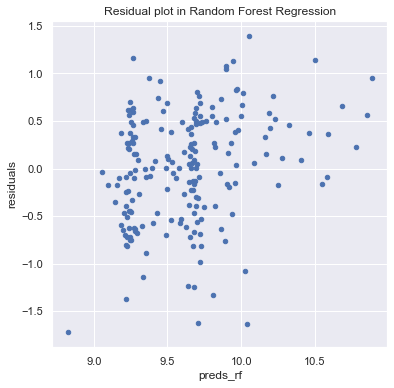

In [417]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds_rf = pd.DataFrame({"preds_rf":pipeline_rf.predict(X_train), "true_rf":y_train})
preds_rf["residuals"] = preds_rf["true_rf"] - preds_rf["preds_rf"]
preds_rf.plot(x = "preds_rf", y = "residuals",kind = "scatter")
plt.title("Residual plot in Random Forest Regression")

Gradient Boosting Regression Algorithm

In [418]:
#fitting the model in the data via pipeline

pipeline_gbm = make_pipeline(StandardScaler(), GradientBoostingRegressor())
pipeline_gbm.fit(X_train, y_train)

pipeline_gbm.score(X_test, y_test)

y_predict_gbm = pipeline_gbm.predict(X_train)
Y_tests_gbm = pipeline_gbm.predict(X_test)

#check the performance of model
print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_gbm)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_gbm)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_gbm)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_gbm)))


Mean Absolute Error (MAE)         : 0.5207487383778252
Mean Squared Error (MSE) : 0.463408800542282
Root Mean Squared Error (RMSE) : 0.6807413609751372
Testing Accuracy (R2) : 0.4337279100884692


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Residual plot in Gradient Boosting Regression')

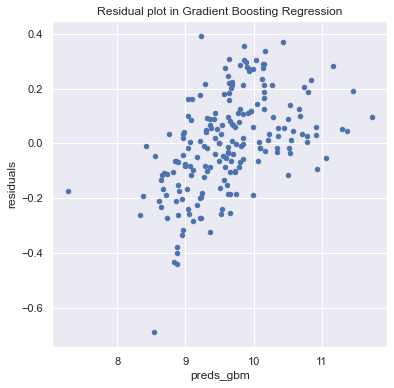

In [419]:
#Visualize the residual outcome via scatter plot

matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)

preds_gbm = pd.DataFrame({"preds_gbm":pipeline_gbm.predict(X_train), "true_gbm":y_train})
preds_gbm["residuals"] = preds_gbm["true_gbm"] - preds_gbm["preds_gbm"]
preds_gbm.plot(x = "preds_gbm", y = "residuals",kind = "scatter")
plt.title("Residual plot in Gradient Boosting Regression")

# Model Evaluation

In [420]:
#Comparing the results

Mean_Absolute_Error = [mean_absolute_error(y_test, Y_tests_ridge), mean_absolute_error(y_test, Y_tests_lr), mean_absolute_error(y_test, Y_tests_dt), mean_absolute_error(y_test, Y_tests_svr), mean_absolute_error(y_test, Y_tests_knn), mean_absolute_error(y_test, Y_tests_lasso), mean_absolute_error(y_test, Y_tests_rf), mean_absolute_error(y_test, Y_tests_gbm)]
Mean_Squared_Error = [mse(y_test, Y_tests_ridge), mse(y_test, Y_tests_lr), mse(y_test, Y_tests_dt), mse(y_test, Y_tests_svr), mse(y_test, Y_tests_knn), mse(y_test, Y_tests_lasso), mse(y_test, Y_tests_rf), mse(y_test, Y_tests_gbm)]
Root_Mean_Absolute_Error = [rmse(y_test, Y_tests_ridge), rmse(y_test, Y_tests_lr), rmse(y_test, Y_tests_dt), rmse(y_test, Y_tests_svr), rmse(y_test, Y_tests_knn), rmse(y_test, Y_tests_lasso), rmse(y_test, Y_tests_rf), rmse(y_test, Y_tests_gbm)]
Test_Accuracy_R2 = [metrics.r2_score(y_test, Y_tests_ridge), metrics.r2_score(y_test, Y_tests_lr), metrics.r2_score(y_test, Y_tests_dt), metrics.r2_score(y_test, Y_tests_svr), metrics.r2_score(y_test, Y_tests_knn), metrics.r2_score(y_test, Y_tests_lasso), metrics.r2_score(y_test, Y_tests_rf), metrics.r2_score(y_test, Y_tests_gbm)]


col={  'MAE' : Mean_Absolute_Error, 'MSE' : Mean_Squared_Error, 'RMSE' : Root_Mean_Absolute_Error, 'Testing Accuracy' : Test_Accuracy_R2}
models=['Ridge Regression', 'Linear Regression', 'Decision Tree', 'SVR', 'Knn',  'Lasso', 'Random Forest', 'Gradient Booster']
output=pd.DataFrame(data=col,index=models)

output.style.background_gradient(cmap = 'gist_earth')

,MAE,MSE,RMSE,Testing Accuracy
Ridge Regression,0.494630,0.402703,0.634589,0.507909
Linear Regression,0.494994,0.402227,0.634214,0.508490
Decision Tree,0.715545,0.761826,0.872827,0.069070
SVR,0.534796,0.468661,0.684588,0.427310
Knn,0.552345,0.513358,0.716490,0.372691
Lasso,0.587952,0.493203,0.702284,0.397320
Random Forest,0.553665,0.472961,0.687722,0.422055
Gradient Booster,0.520749,0.463409,0.680741,0.433728


Text(0.5, 0.98, 'Model Comparisons on Evaluation Metrics')

<Figure size 1440x1080 with 0 Axes>

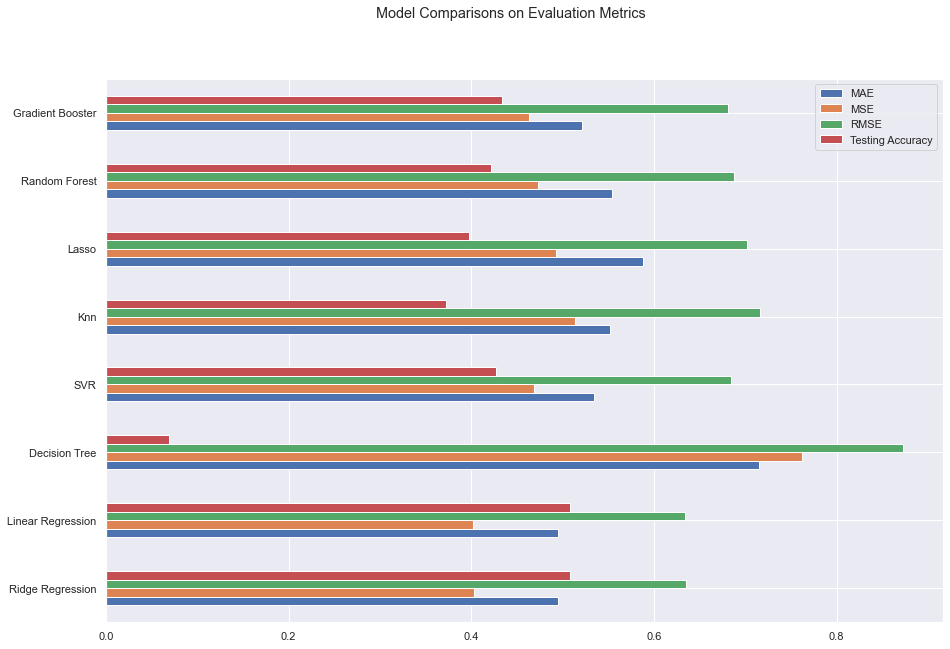

In [421]:
#visualize the performance of model on each evaluation metric

plt.figure (figsize=(20,15))
output.plot(kind='barh', figsize=(15,10))
pl.suptitle("Model Comparisons on Evaluation Metrics")

# Hyper-parameters Tuning

In [422]:
lr_search = {'linearregression__fit_intercept':[True,False], 'linearregression__normalize':[True,False], 'linearregression__copy_X':[True, False]}
lr_cv_model = GridSearchCV(pipeline_lr, lr_search, cv = kf, refit = True)
lr_best_model = lr_cv_model.fit(X_train, y_train)

y_predict_Lr = lr_best_model.predict(X_train)
Y_tests_Lr = lr_best_model.predict(X_test)


print("Mean Absolute Error (MAE)         : {}".format(mean_absolute_error(y_test, Y_tests_Lr)))
print("Mean Squared Error (MSE) : {}".format(mse(y_test, Y_tests_Lr)))
print("Root Mean Squared Error (RMSE) : {}".format(rmse(y_test, Y_tests_Lr)))
print("Testing Accuracy (R2) : {}".format(metrics.r2_score(y_test, Y_tests_Lr)))

lr_best_model.best_estimator_

Mean Absolute Error (MAE)         : 0.49499443239449314
Mean Squared Error (MSE) : 0.4022270075144074
Root Mean Squared Error (RMSE) : 0.6342136923107284
Testing Accuracy (R2) : 0.5084902835304216


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression(normalize=True))])

In [423]:
#Actual vs Prediction

y_pred = pd.DataFrame({'Actual': y_test, 'Predicted': Y_tests_Lr})
y_pred
skew = np.exp(y_test)
skew = skew-1
skewness = np.exp(Y_tests_Lr)
skewness = skewness - 1
y_preds = pd.DataFrame({'Actual': skew, 'Predicted': skewness})

In [424]:
#Inverse transform the normalized model to its orginal form

predict_X = lr_cv_model.predict(X)
prediction = np.exp(predict_X )
prediction = prediction - 1
#prediction

In [425]:
#convert the column name and creat column to evaluate the difference between actual and predicted value

data['Predicted Employment Furlough (per 100,000)'] = prediction
data['Predicted Difference'] = data['Cumulative number of employments on furlough (per 1,00,000)'] - data['Predicted Employment Furlough (per 100,000)']
data

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs),...,"Covid-19 Cases (per 1,00,000) - Period_2","Covid-19 Cases (per 1,00,000) - Period_3","Covid-19 Cases (per 1,00,000) - Period_4","Covid-19 Deaths (per 1,00,000) - Period_1","Covid-19 Deaths (per 1,00,000) - Period_2","Covid-19 Deaths (per 1,00,000) - Period_3","Covid-19 Deaths (per 1,00,000) - Period_4","Cumulative number of employments on furlough (per 1,00,000)","Predicted Employment Furlough (per 100,000)",Predicted Difference
0,E07000008,Cambridge,6.608696,6.855072,7.043478,7.449275,6.753623,4.710145,4.855072,4.028986,...,505.270223,2648.162880,732.735047,64.767357,1.599194,35.981865,4.797582,31922.097185,15754.492712,16167.604473
1,E07000009,East Cambridgeshire,7.500000,7.340000,7.700000,5.940000,8.780000,8.380000,4.100000,6.800000,...,196.256810,2501.252159,346.515931,55.449585,2.217983,60.994544,3.326975,19879.045806,8827.620571,11051.425235
2,E07000010,Fenland,4.145455,4.309091,4.236364,2.818182,3.381818,5.745455,4.800000,6.600000,...,538.021161,6222.462009,1231.903606,77.390282,3.918495,133.228840,17.633229,13323.011000,16771.988634,-3448.977633
3,E07000011,Huntingdonshire,7.352381,7.323810,7.352381,5.780952,7.733333,7.114286,5.028571,6.628571,...,512.329070,5380.376691,915.004976,69.279549,8.380591,69.838255,20.113417,26376.467300,14534.028677,11842.438623
4,E07000012,South Cambridgeshire,8.427083,8.250000,8.333333,8.395833,9.093750,7.718750,4.697917,7.197917,...,773.063300,6792.963066,1164.004056,37.289315,0.621489,76.443097,13.051260,21049.466246,17998.645524,3050.820722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242,E09000028,Southwark,4.024096,3.987952,4.837349,7.096386,4.849398,3.608434,2.361446,2.584337,...,1507.478593,13557.752380,2058.726250,77.495883,2.187384,51.559761,13.436786,61678.331481,60836.437162,841.894319
243,E09000029,Sutton,7.099174,6.520661,6.950413,7.090909,7.636364,6.231405,4.884298,5.140496,...,1452.774539,18386.720626,1895.877632,85.216194,1.444342,145.397122,12.517633,36209.138604,24406.097564,11803.041040
244,E09000030,Tower Hamlets,3.680556,3.250000,4.763889,5.798611,4.541667,3.548611,2.659722,3.000000,...,2339.232038,19151.722669,2444.162176,56.029328,3.614795,90.972350,5.723426,64150.346728,68929.111778,-4778.765050
245,E09000031,Waltham Forest,4.076389,4.118056,5.076389,5.555556,6.138889,3.826389,1.833333,2.715278,...,1094.842508,11132.564857,1106.943122,89.550083,5.055247,109.771070,6.499603,45908.530611,42222.187169,3686.343442


# Least Impacted Regions on Furlough

In [426]:
#compute the least impacted regions based on prediction difference

least_impact = """
select * from data
order by "Predicted Difference"
desc
limit 4
;
"""
pysqldf_least_impact = lambda least_impact: sqldf(least_impact, globals())

sql_df_least_impact = pysqldf_least_impact(least_impact)

sql_df_least_impact = pd.merge(sql_df_least_impact, shp_1, on = ['Local Authority District code (2019)'])
sql_df_least_impact

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs),...,"Covid-19 Deaths (per 1,00,000) - Period_1","Covid-19 Deaths (per 1,00,000) - Period_2","Covid-19 Deaths (per 1,00,000) - Period_3","Covid-19 Deaths (per 1,00,000) - Period_4","Cumulative number of employments on furlough (per 1,00,000)","Predicted Employment Furlough (per 100,000)",Predicted Difference,long,lat,geometry
0,E08000035,Leeds,4.796680,5.282158,5.197095,5.199170,4.085062,3.491701,7.300830,3.396266,...,85.880323,15.773937,96.771851,17.526597,114538.896403,34609.147679,79929.748724,-1.50736,53.822731,"POLYGON ((-1.72722 53.91020, -1.71796 53.90854..."
1,E08000025,Birmingham,2.890454,3.228482,3.311424,4.090767,3.032864,4.129890,2.743349,2.239437,...,101.882905,11.748975,134.324105,15.606848,138225.282022,58870.177805,79355.104217,-1.88141,52.484039,"POLYGON ((-1.87256 52.58494, -1.85395 52.60193..."
2,E08000034,Kirklees,4.714286,4.972973,4.776062,4.965251,4.884170,3.741313,6.370656,3.613900,...,69.342156,21.527794,114.890435,11.783634,99693.463312,24775.343199,74918.120113,-1.78085,53.642330,"POLYGON ((-1.77009 53.72625, -1.76091 53.73465..."
3,E08000017,Doncaster,3.953608,4.268041,3.726804,3.484536,3.025773,3.123711,7.201031,7.226804,...,76.730022,26.855508,172.003133,10.230670,93760.464338,22940.425373,70820.038965,-1.10894,53.526970,"POLYGON ((-0.99100 53.66119, -0.98998 53.65898..."


<Figure size 5000x4000 with 0 Axes>

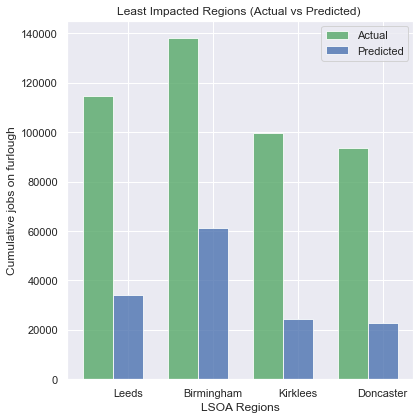

In [427]:
#Visualize the predicted difference of the target class of least impacted regions

plt.figure(figsize=(50,40), dpi=100)
sns.set(font_scale=1.0)

# data to plot
n_groups = 4
Actual = (114538.89640, 138225.28202, 99693.46331, 93760.46434)
Predicted = (34149.72227, 61093.15809, 24404.09242, 22928.31143)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.35
opacity = 0.8

rects1 = plt.bar(index, Actual, bar_width,
alpha=opacity,
color='g',
label='Actual')

rects2 = plt.bar(index + bar_width, Predicted, bar_width,
alpha=opacity,
color='b',
label='Predicted')

plt.xlabel('LSOA Regions')
plt.ylabel('Cumulative jobs on furlough')
plt.title('Least Impacted Regions (Actual vs Predicted) ')
plt.xticks(index + bar_width, ('Leeds', 'Birmingham', 'Kirklees', 'Doncaster'))
plt.legend()

plt.tight_layout()
plt.show()

# Most Impacted Regions on Furlough

In [428]:
#compute the most impacted regions based on prediction difference

most_impact = """
select * from data
order by "Predicted Difference"
asc
limit 4
;
"""
pysqldf_most_impact = lambda most_impact: sqldf(most_impact, globals())

sql_df_most_impact = pysqldf_most_impact(most_impact)

sql_df_most_impact = pd.merge(sql_df_most_impact, shp_1, on = ['Local Authority District code (2019)'])
sql_df_most_impact

,Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),Income Decile (where 1 is most deprived 10% of LSOAs),Employment Decile (where 1 is most deprived 10% of LSOAs),"Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)",Health Deprivation and Disability Decile (where 1 is most deprived 10% of LSOAs),Crime Decile (where 1 is most deprived 10% of LSOAs),Barriers to Housing and Services Decile (where 1 is most deprived 10% of LSOAs),Living Environment Decile (where 1 is most deprived 10% of LSOAs),...,"Covid-19 Deaths (per 1,00,000) - Period_1","Covid-19 Deaths (per 1,00,000) - Period_2","Covid-19 Deaths (per 1,00,000) - Period_3","Covid-19 Deaths (per 1,00,000) - Period_4","Cumulative number of employments on furlough (per 1,00,000)","Predicted Employment Furlough (per 100,000)",Predicted Difference,long,lat,geometry
0,E09000002,Barking and Dagenham,2.681818,2.863636,3.790909,3.836364,4.454545,3.300000,1.081818,3.500000,...,76.597215,6.538787,163.936723,9.808180,32532.779864,63810.670380,-31277.890516,0.129479,51.545551,"POLYGON ((0.14679 51.56877, 0.16190 51.56161, ..."
1,E09000010,Enfield,4.382514,3.912568,4.945355,5.420765,7.519126,4.721311,1.644809,3.857923,...,115.112399,5.096122,109.116962,6.894753,36337.553943,65615.602328,-29278.048385,-0.081470,51.648880,"POLYGON ((-0.10578 51.69188, -0.01192 51.68088..."
2,E08000011,Knowsley,2.561224,2.877551,2.469388,2.969388,1.642857,4.622449,6.326531,3.795918,...,93.800016,35.420985,137.092331,16.398604,7416.606801,28144.465949,-20727.859149,-2.832970,53.437881,"POLYGON ((-2.88799 53.50383, -2.86515 53.49209..."
3,E07000127,West Lancashire,6.164384,5.684932,5.315068,6.041096,5.506849,7.301370,6.150685,6.931507,...,99.566797,28.821968,116.161263,14.847680,3226.115026,23264.587274,-20038.472248,-2.868930,53.612831,"POLYGON ((-2.82699 53.71434, -2.82224 53.70804..."


<Figure size 6000x4000 with 0 Axes>

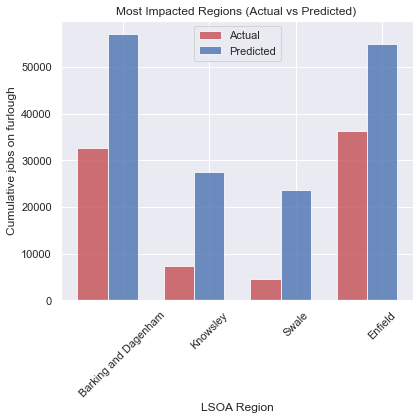

In [429]:
#Visualize the predicted difference of the target class of least impacted regions

plt.figure(figsize=(60,40), dpi=100)
sns.set(font_scale=1.0)

# data to plot
n_groups = 4
Actual = (32532.77986, 7416.60680, 4455.77592, 36337.55394)
Predicted = (57010.64316, 27370.13441, 23533.33316, 54816.87633)


# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.35
opacity = 0.8


rects1 = plt.bar(index, Actual, bar_width,
alpha=opacity,
color='r',
label='Actual')

rects2 = plt.bar(index + bar_width, Predicted, bar_width,
alpha=opacity,
color='b',
label='Predicted')


plt.xlabel('LSOA Region')
plt.ylabel('Cumulative jobs on furlough')
plt.title('Most Impacted Regions (Actual vs Predicted) ')
plt.xticks(index + bar_width, ('Barking and Dagenham', 'Knowsley', 'Swale', 'Enfield'))
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [430]:
#Concat the predicted data with geometry coordinates to visualize the least and most impact region on map

shp_pred = pd.merge(data, shp_1, on = ['Local Authority District code (2019)'])
shp_pred = GeoDataFrame(shp_pred)
colormap_pred = cm.linear.YlGnBu_09.to_step(data=shp_pred['Predicted Employment Furlough (per 100,000)'], method='quant', quantiles=[0,0.1,0.75,0.9,0.98,1])
#shp_pred

In [431]:
#Visualize the predicted furlough value of the regions and highlighted the most (Black) and least(Green) impacted regions

mymap_pred = folium.Map(location=[y_map, x_map], zoom_start=5.5,tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(mymap_pred)
colormap_pred.caption = "Predicted Employment Furlough of 248 regions (local authorities)"
style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap_pred(x['properties']['Predicted Difference']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL_pred = folium.features.GeoJson(
        shp_pred,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(fields=['Local Authority District name (2019)','Predicted Employment Furlough (per 100,000)'],
            aliases=['Local Authority District name','Predicted Employment Furlough (per 100,000)'],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
        )
    )

folium.Marker(
    radius=100,
    location=[53.822731, -1.50736],
    popup="Leeds",
    icon=folium.Icon(color="green", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap_pred)

folium.Marker(
    location=[52.484039, -1.88141],
    radius=50,
    popup="Birmingham",
    icon=folium.Icon(color="green", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap_pred)
folium.Marker(
    radius=100,
    location=[53.642330, -1.78085],
    popup="Kirklees",
    icon=folium.Icon(color="green", icon="info-sign"),
    color="crimson",
    fill=False,
).add_to(mymap_pred)

folium.Marker(
    location=[53.526970, -1.10894],
    radius=50,
    popup="Doncaster",
    icon=folium.Icon(color="green", icon="info-sign"),
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
).add_to(mymap_pred)

folium.Marker(
    location=[51.545551, 0.129479],
    popup="Barking and Dagenham", 
    icon=folium.Icon(color="black", icon="info-sign"),
).add_to(mymap_pred)
folium.Marker(
    location=[51.648880, -0.081470],
    popup="Enfield",
    icon=folium.Icon(color="black", icon="info-sign"),
).add_to(mymap_pred)
folium.Marker(
    location=[53.437881, -2.832970],
    popup="Knowsley",
    icon=folium.Icon(color="black", icon="info-sign"),
).add_to(mymap_pred)
folium.Marker(
    location=[53.612831, -2.868930],
    popup="West Lancashire",
    icon=folium.Icon(color="black", icon="info-sign"),
).add_to(mymap_pred)

colormap_pred.add_to(mymap_pred)
mymap_pred.add_child(NIL_pred)
mymap_pred

Move Cursor on the regions on map to know the furlourgh prediction

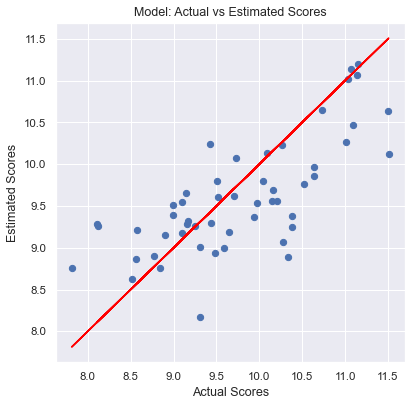

In [432]:
#Visualize the scatter plot stating the difference of actual and predicted furlough jobs

plt.figure(dpi = 75)
plt.scatter(y_test, Y_tests_Lr)
plt.plot(y_test, y_test, color="red")
plt.xlabel("Actual Scores")
plt.ylabel("Estimated Scores")
plt.title("Model: Actual vs Estimated Scores")
plt.show()

# The End